In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
rcParams['font.size'] = 16.0

In [3]:
import keras.models as km

Using TensorFlow backend.


In [4]:
import h5py
import glob

In [5]:
from keras.backend.tensorflow_backend import set_session
from keras.backend.tensorflow_backend import clear_session
from keras.backend.tensorflow_backend import get_session
import tensorflow
import gc

# Reset Keras Session
def reset_keras(model):
    
    sess = get_session()
    clear_session()
    sess.close()
    sess = get_session()

    print(gc.collect()) # if it's done something you should see a number being outputted
    
    try:
        del model # this is from global space - change this as you need
    except:
        pass

    # use the same config as you used to create the session
    #config = tensorflow.ConfigProto()
    #config.gpu_options.per_process_gpu_memory_fraction = 1
    #config.gpu_options.visible_device_list = "0"
    #set_session(tensorflow.Session(config=config))

In [6]:
from kgan.net.gp_loss import *

In [7]:
import keras.losses
keras.losses.custom_loss = wasserstein_loss

In [8]:
from keras.utils.generic_utils import get_custom_objects

In [9]:
get_custom_objects().update({"wasserstein_loss": wasserstein_loss})

In [10]:
from kgan.tools.delta import *

In [11]:
# Load the data
fp = "/work/06147/pberger/maverick2/gadget_runs/cosmo1/n512_512Mpc_cosmo1_z0_gridpart.h5"

with h5py.File(fp, 'r') as data:
    
    delta = []
    for dk in list(data.keys())[:2]:
        delta_i = squash(data[dk][:])
        delta_i = np.array(split3d(delta_i, 8))
        delta.extend(delta_i)
    delta = np.array(delta)
    
print(delta.shape)

(1024, 64, 64, 64)


In [94]:
np.fft.fftn?

In [96]:
def estimate_pk(kki, img, boxsize, nbin=30, normalize=True):
    
    bins = np.linspace(np.min(kki), np.max(kki), nbin+1, endpoint=True)
    ibin = [np.logical_and(kki.ravel() >= bins[i], kki.ravel() < bins[i+1]) for i in range(nbin)]

    n = kki.shape[0]
    n3 = n**3
    kmin = 2*np.pi/boxsize
    d3k = kmin**3

    if normalize:
        nimg = img / np.mean(img.ravel()) - 1.0
        ft = np.absolute(np.fft.fftn(nimg)/n3)**2
    else:
        ft = np.absolute(np.fft.fftn(img)/n3)**2
    pkk = np.array([np.mean(ft.ravel()[ibin[i]]) for i in range(nbin)])
    kk = np.array([np.mean(kki.ravel()[ibin[i]]) for i in range(nbin)])

    return kk, pkk/d3k*(2*np.pi)**3

In [13]:
np.fft.fftfreq(64, d=1.0)*2*np.pi

array([ 0.        ,  0.09817477,  0.19634954,  0.29452431,  0.39269908,
        0.49087385,  0.58904862,  0.68722339,  0.78539816,  0.88357293,
        0.9817477 ,  1.07992247,  1.17809725,  1.27627202,  1.37444679,
        1.47262156,  1.57079633,  1.6689711 ,  1.76714587,  1.86532064,
        1.96349541,  2.06167018,  2.15984495,  2.25801972,  2.35619449,
        2.45436926,  2.55254403,  2.6507188 ,  2.74889357,  2.84706834,
        2.94524311,  3.04341788, -3.14159265, -3.04341788, -2.94524311,
       -2.84706834, -2.74889357, -2.6507188 , -2.55254403, -2.45436926,
       -2.35619449, -2.25801972, -2.15984495, -2.06167018, -1.96349541,
       -1.86532064, -1.76714587, -1.6689711 , -1.57079633, -1.47262156,
       -1.37444679, -1.27627202, -1.17809725, -1.07992247, -0.9817477 ,
       -0.88357293, -0.78539816, -0.68722339, -0.58904862, -0.49087385,
       -0.39269908, -0.29452431, -0.19634954, -0.09817477])

In [103]:
def quick_check_plot(real_imgs, test_imgs):

    fig = figure(figsize = (15, 5))

    kx = np.fft.fftfreq(64, d=1.0)*2*np.pi
    ky = np.fft.fftfreq(64, d=1.0)*2*np.pi
    kz = np.fft.fftfreq(64, d=1.0)*2*np.pi
    kk = np.sqrt(kx[:, np.newaxis, np.newaxis]**2 
                 + ky[np.newaxis, :, np.newaxis]**2 
                 + kz[np.newaxis, np.newaxis, :]**2)

    pk1r = []
    pk2f = []
    Nim = len(real_imgs)
    for i in range(Nim):
        k1, pk1 = estimate_pk(kk, squash_inv(real_imgs[i]), 64.0)
        k2, pk2 = estimate_pk(kk, squash_inv(test_imgs[i]), 64.0)
        #k1, pk1 = estimate_pk(kk, real_imgs[i])
        #k2, pk2 = estimate_pk(kk, test_imgs[i])

        pk1r.append(pk1)
        pk2f.append(pk2)
    pk1r = np.array(pk1r)
    pk2f = np.array(pk2f)

    subplot(2,2,1)
    plot(k1, pk1r.mean(0), '-o')
    fill_between(k1, pk1r.mean(0) - pk1r.std(0)/2, 
                 pk1r.mean(0) + pk1r.std(0)/2, color='C0', alpha=0.1)
    plot(k2, pk2f.mean(0), '-o')
    fill_between(k2, pk2f.mean(0) - pk2f.std(0)/2, 
                 pk2f.mean(0) + pk2f.std(0)/2, color='C1', alpha=0.1)
    yscale('log')
    xscale('log')
    subplot(2,2,3)
    plot(k1, np.sqrt(pk2f.mean(0)/pk1r.mean(0)), '-o')
    krange = np.linspace(np.min(k1), np.max(k1), 100)
    fill_between(krange, np.ones_like(krange)*0.9, np.ones_like(krange)*1.1, color='C5', alpha=0.1)
    fill_between(krange, np.ones_like(krange)*0.95, np.ones_like(krange)*1.05, color='C5', alpha=0.2)
    axhline(1.0, ls='--', c='grey')
    xscale('log')
    ylim(0.75, 1.25)

    subplot(1,2,2)
    foo = hist((real_imgs).ravel(), bins=50, edgecolor='C0', alpha=0.1)
    foot = hist((test_imgs).ravel(), bins=50, edgecolor='C1', alpha=0.1)
    #foo = hist(squash_inv(real_imgs).ravel(), bins=50, edgecolor='C0', alpha=0.1)
    #foot = hist(squash_inv(test_imgs).ravel(), bins=50, edgecolor='C1', alpha=0.1)
    yscale('log')

In [15]:
hist_list = glob.glob("/work/06147/pberger/maverick2/saved_models/*_2[0-2].history5")
#hist_list.pop(3)
hist_list = np.sort(hist_list)
hist_list

array(['/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_21.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22.history5'],
      dtype='|S67')

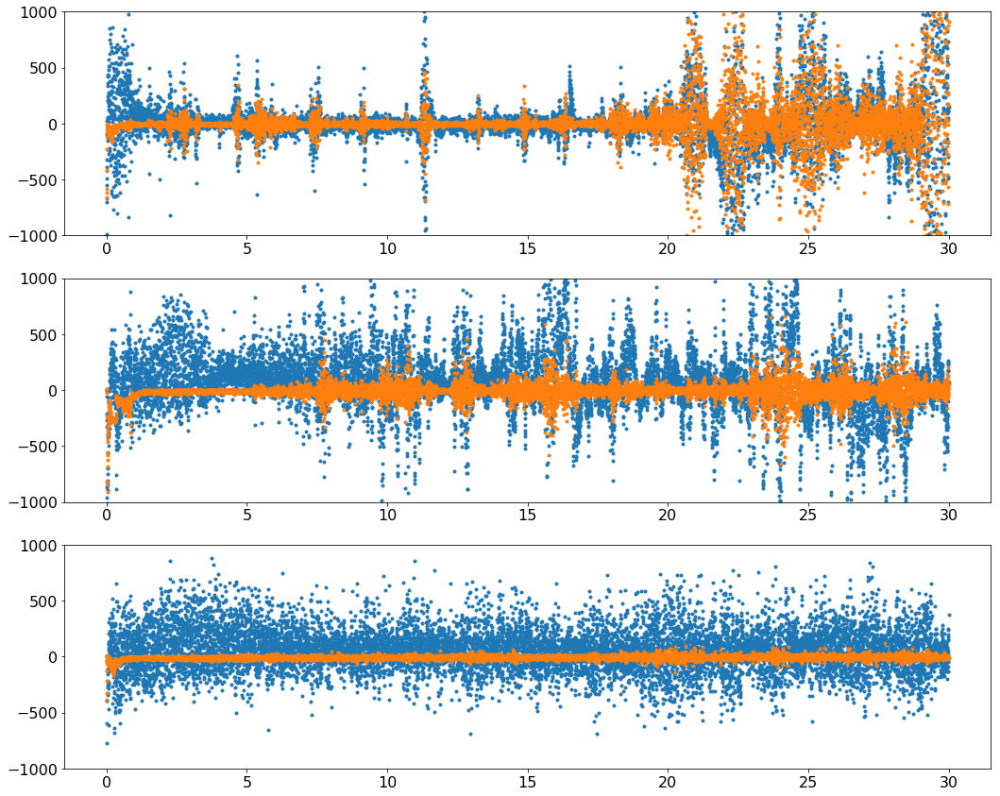

In [21]:
fig = figure(figsize = (15, 12))

#titles=['decay=1.5e-4', 'decay=1.5e-4,latent_dim=192', 'decay=1e.5e-4,base_features=48', 'all of the above']

for mi in range(3):
    
    #spis = [0, 1, 2, 4, 5]
    #spi = spis[mi]
    
    #subplot(3,2,1+spi)
    subplot(3,1,1+mi)
    with h5py.File(hist_list[mi], 'r') as hfile:

        epoch = np.arange(hfile['g_loss'][:].shape[0])*30./hfile['g_loss'][:].shape[0]
        plot(epoch, hfile['d_loss'][:], '.')
        plot(epoch, hfile['g_loss'][:], '.')
        
        #title(titles[mi])

    ylim(-1000, 1000)
    
tight_layout()

In [16]:
hist_list = glob.glob("/work/06147/pberger/maverick2/saved_models/*_20*.history5")
#hist_list.pop(3)
hist_list = np.sort(hist_list)
hist_list

array(['/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20-2.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20d-2.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-2.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s.history5'],
      dtype='|S70')

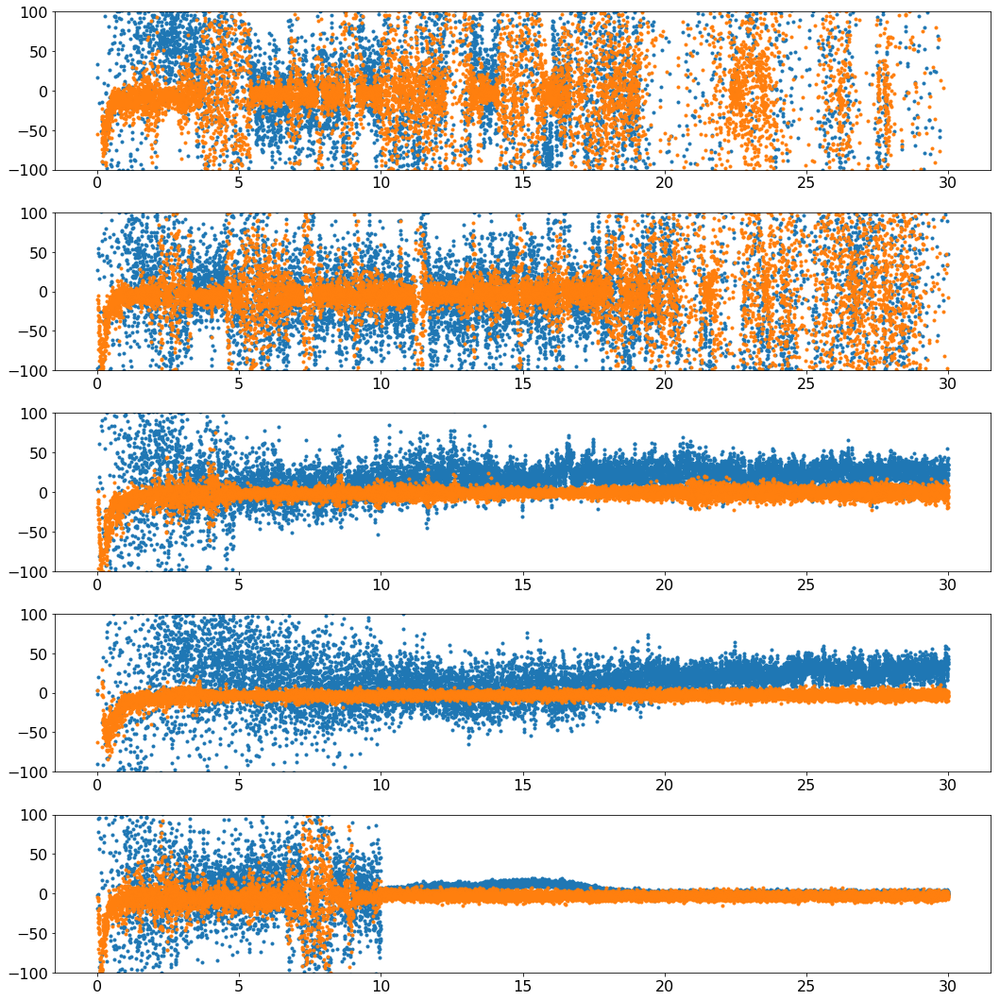

In [17]:
fig = figure(figsize = (15, 15))

#titles=['decay=1.5e-4', 'decay=1.5e-4,latent_dim=192', 'decay=1e.5e-4,base_features=48', 'all of the above']

for mi in range(5):
    
    #spis = [0, 1, 2, 4, 5]
    #spi = spis[mi]
    
    #subplot(3,2,1+spi)
    subplot(5,1,1+mi)
    with h5py.File(hist_list[mi], 'r') as hfile:

        epoch = np.arange(hfile['g_loss'][:].shape[0])*30./hfile['g_loss'][:].shape[0]
        plot(epoch, hfile['d_loss'][:], '.')
        plot(epoch, hfile['g_loss'][:], '.')
        
        #title(titles[mi])

    ylim(-100, 100)
    
tight_layout()

In [57]:
model_list1 = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*_20d-2.keras*"))
model_list2 = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*_20s-2.keras*"))
model_list3 = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*_20s.keras*"))

In [26]:
latent_dim=192

In [59]:
model_list2

array(['/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-2.keras-005',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-2.keras-007',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-2.keras-009',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-2.keras-011',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-2.keras-013',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-2.keras-015',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-2.keras-017',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-2.keras-018',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-2.keras-019',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-2.keras-020',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-2.keras-021',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-2.keras-022',
       '/work/06

In [45]:
!cat ../scripts/config_20s.yaml

save_model : '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s.keras'
save_history : '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s.history5'

paths_to_data :
    'z0' : "/work/06147/pberger/maverick2/gadget_runs/cosmo1/n512_512Mpc_cosmo1_z0_gridpart.h5"

train_config :
    train_batch_size : 8
    image_shape      : (64, 64, 64)
    nepochs          : 30
    latent_dim       : 192

net_config :
    generator :
        module : kgan.net.generator_resnet3d
        args : 
            nlevels            : 3
            base_features      : 32
            nconvl             : 1
            conv_kernel_size   : (5, 5, 5)
            updown_kernel_size : (2, 2, 2)
            updown_method      : 'conv'
    critic : 
        module : kgan.net.critic_simple
        args :
            base_features : 32

optimizer_config :
    name   : Adam
    lr_gamma : 0.5 
    args   : 
        beta_1 : 0.0
        beta_2 : 0.9
        lr     : 2e-4
        decay  : 0.0


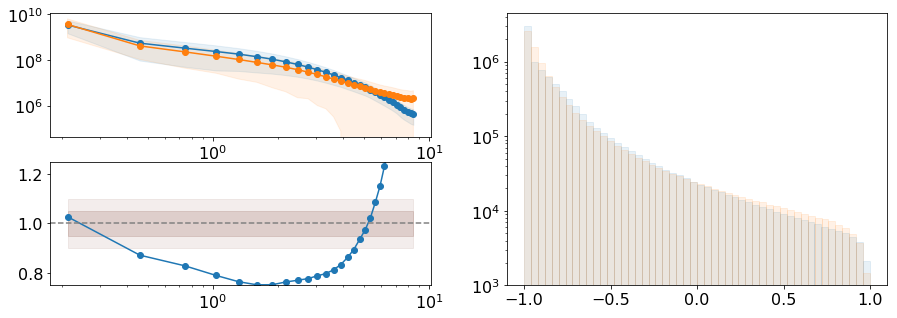

In [40]:
mi = 0
model = km.load_model(model_list2[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

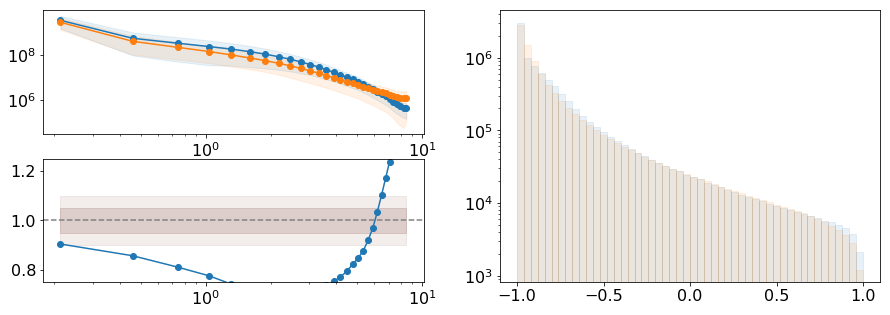

In [46]:
mi = 3
model = km.load_model(model_list2[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

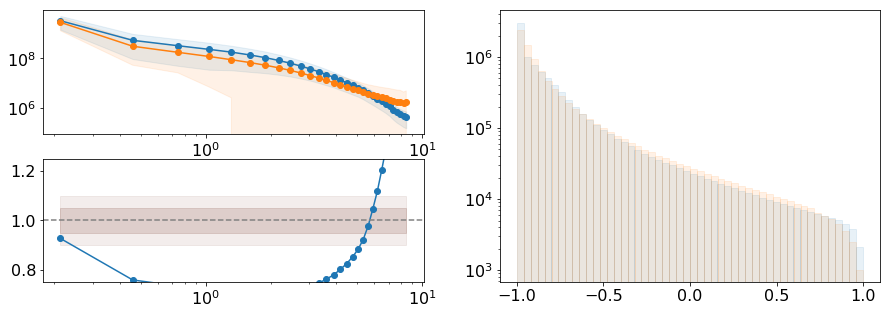

In [47]:
mi = 4
model = km.load_model(model_list2[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

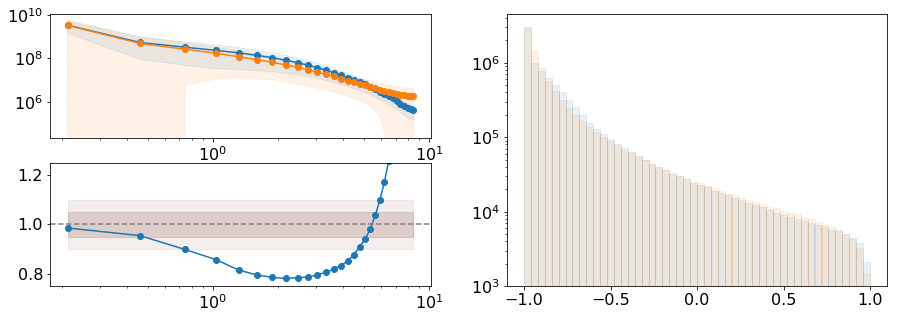

In [48]:
mi = 5
model = km.load_model(model_list2[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

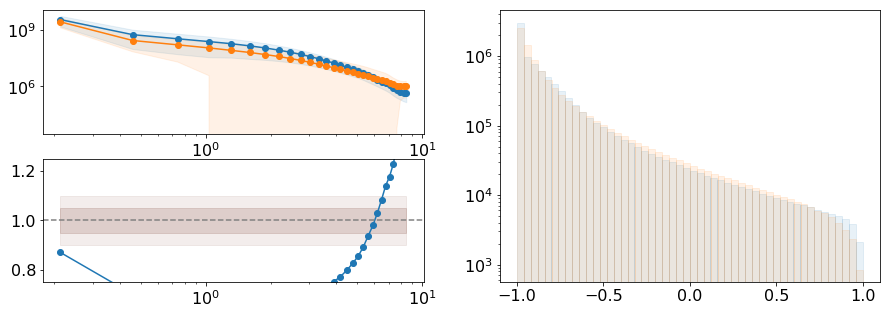

In [49]:
mi = 6
model = km.load_model(model_list2[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

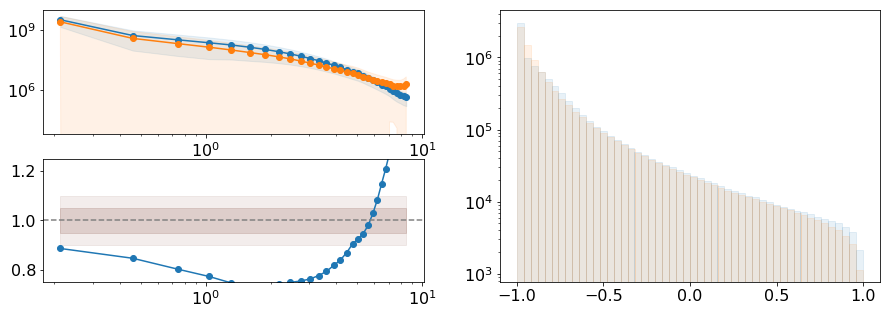

In [50]:
mi = 9
model = km.load_model(model_list2[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

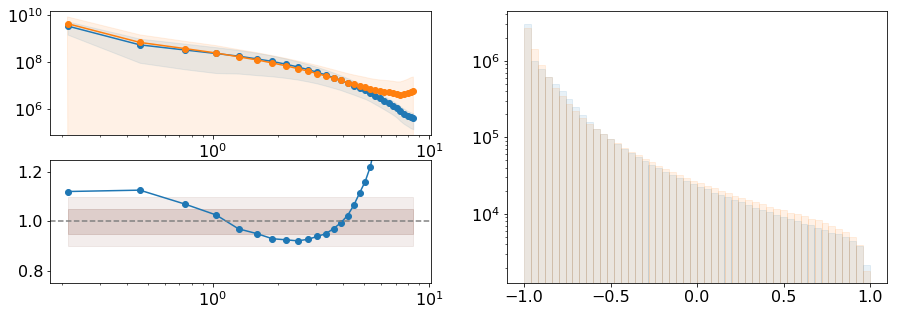

In [51]:
mi = 11
model = km.load_model(model_list2[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

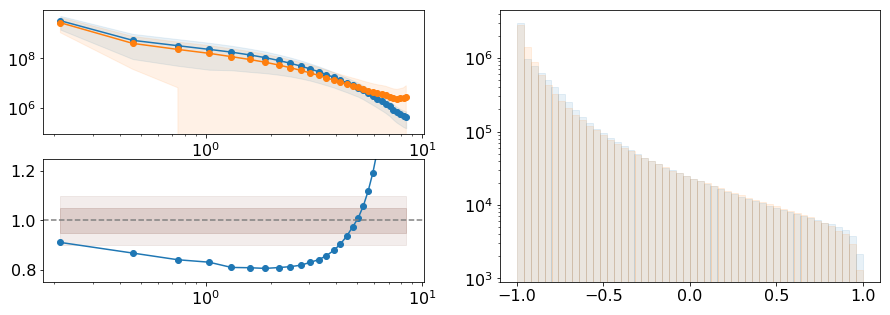

In [52]:
mi = 15
model = km.load_model(model_list2[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

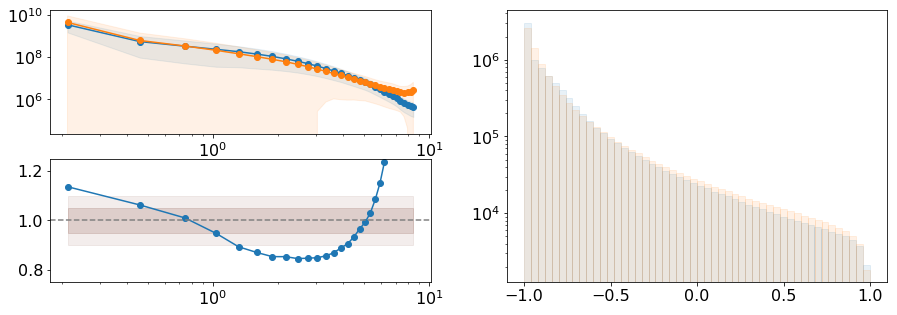

In [56]:
mi = 16
model = km.load_model(model_list2[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

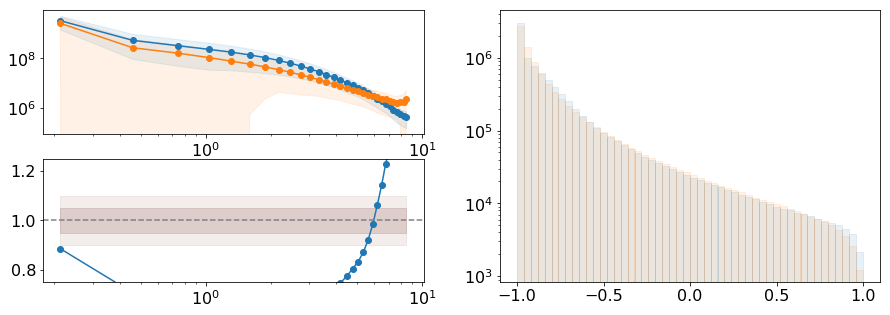

In [53]:
mi = 17
model = km.load_model(model_list2[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

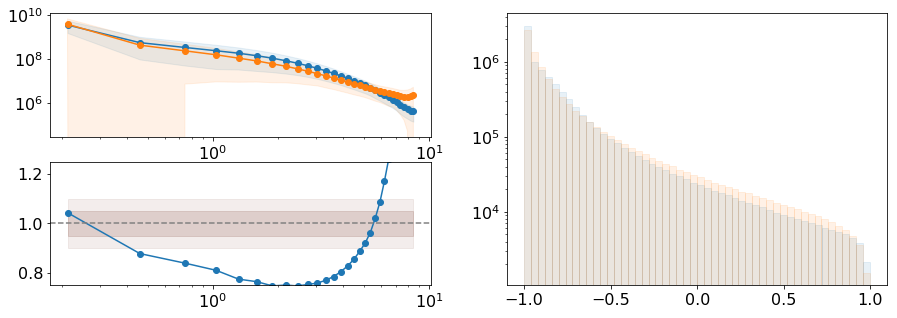

In [54]:
mi = 18
model = km.load_model(model_list2[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

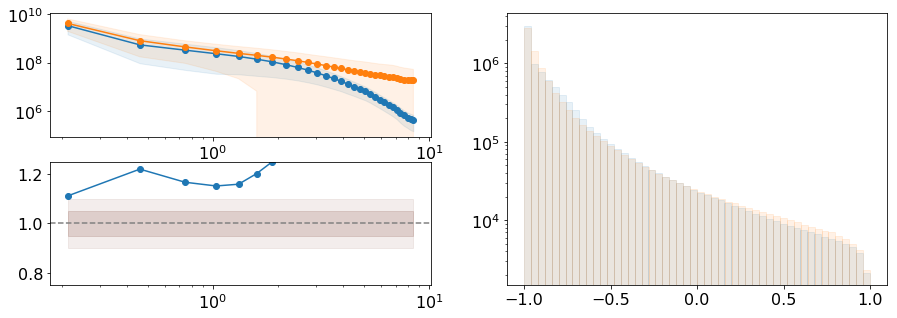

In [60]:
mi = 3
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

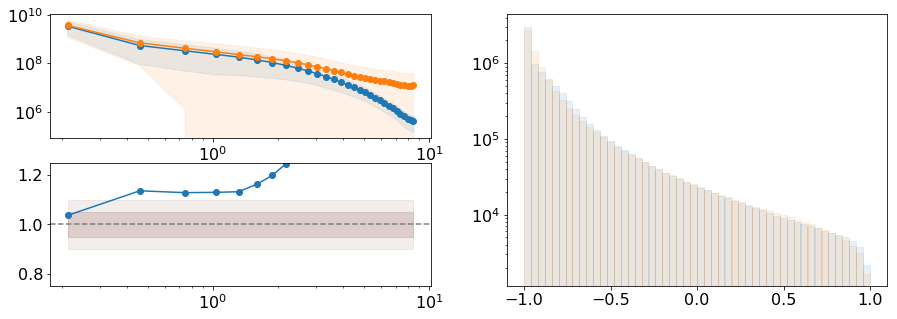

In [61]:
mi = 5
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

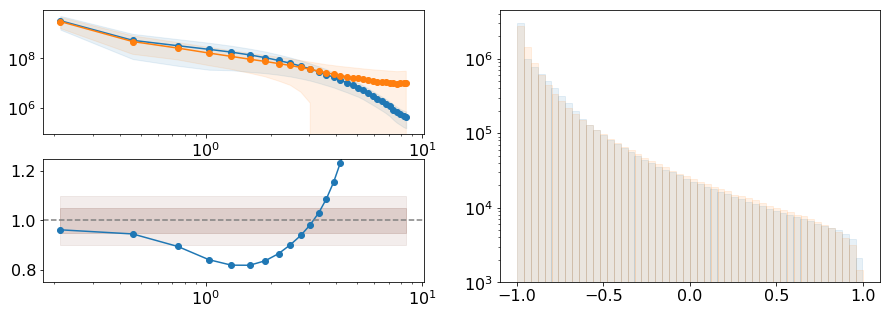

In [62]:
mi = 7
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

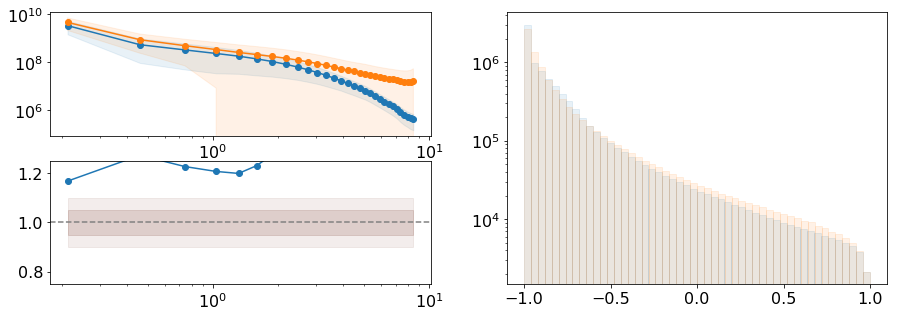

In [63]:
mi = 9
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

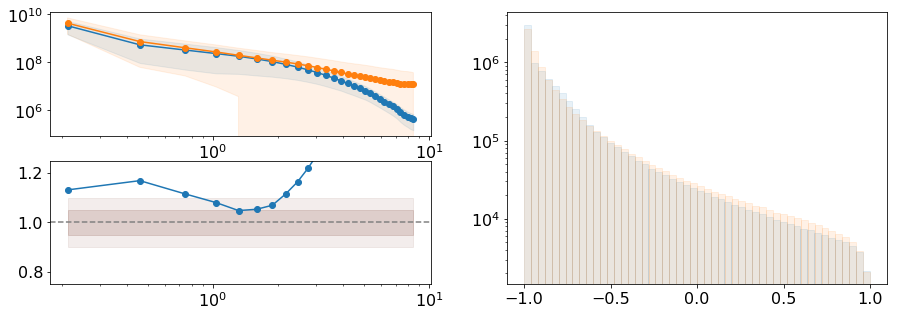

In [64]:
mi = 11
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

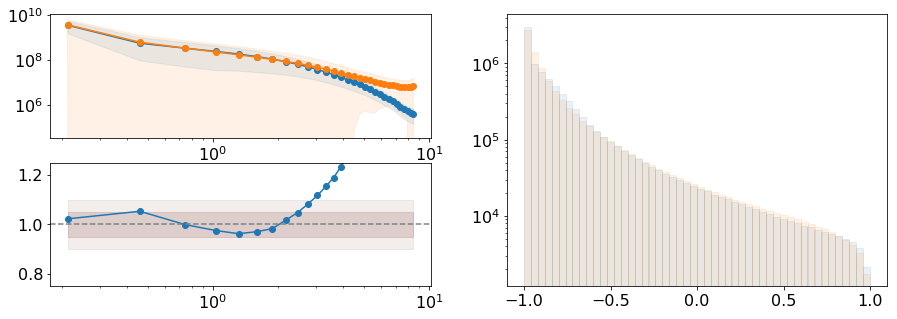

In [69]:
mi = 12
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

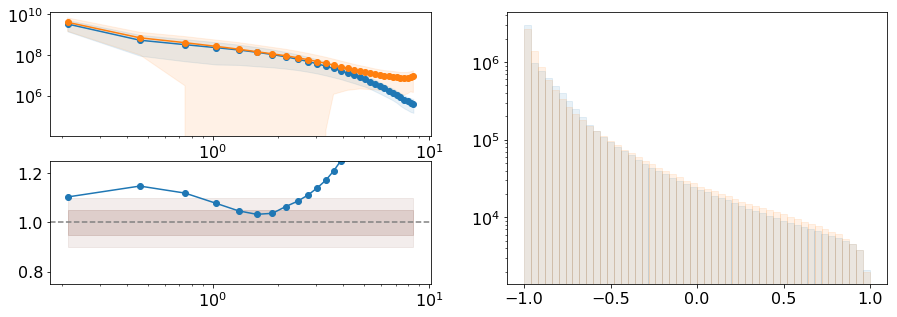

In [65]:
mi = 13
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

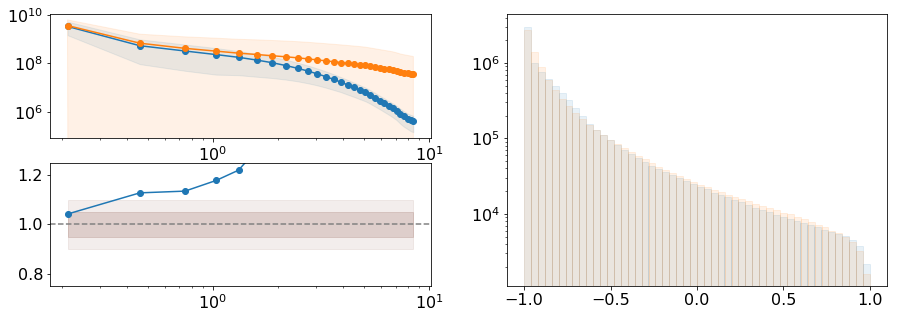

In [66]:
mi = 14
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

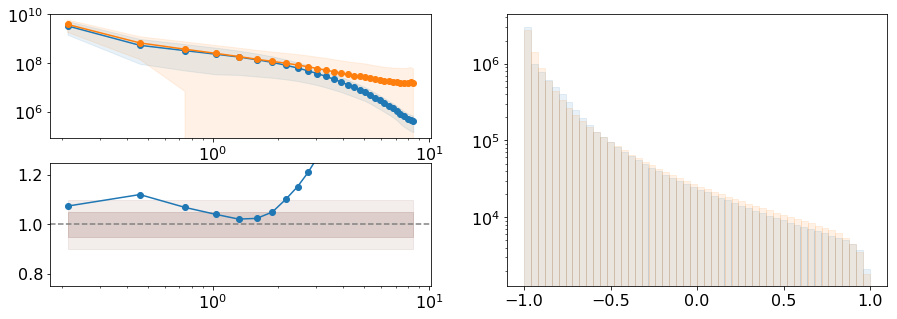

In [67]:
mi = 17
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

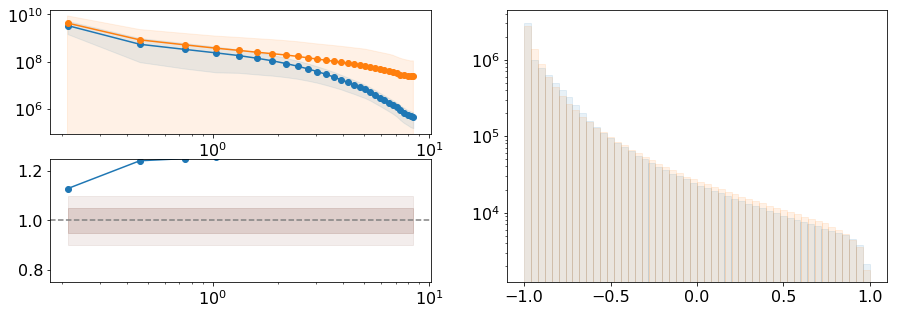

In [68]:
mi = 18
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [71]:
hist_list = glob.glob("/work/06147/pberger/maverick2/saved_models/*_21*.history5")
#hist_list.pop(3)
hist_list = np.sort(hist_list)
hist_list

array(['/work/06147/pberger/maverick2/saved_models/gen_resnet3d_21-2.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_21.history5'],
      dtype='|S69')

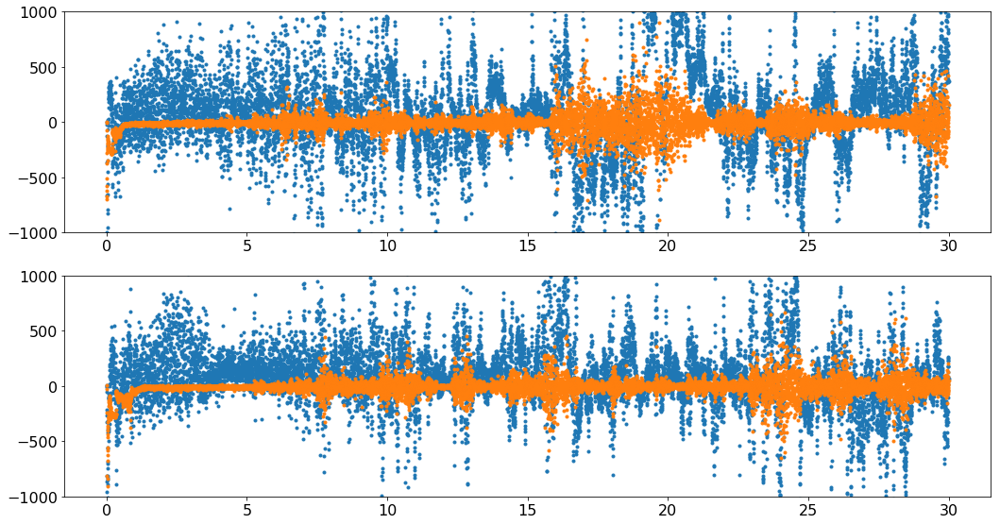

In [42]:
fig = figure(figsize = (15, 8))

#titles=['decay=1.5e-4', 'decay=1.5e-4,latent_dim=192', 'decay=1e.5e-4,base_features=48', 'all of the above']

for mi in range(2):
    
    #spis = [0, 1, 2, 4, 5]
    #spi = spis[mi]
    
    #subplot(3,2,1+spi)
    subplot(2,1,1+mi)
    with h5py.File(hist_list[mi], 'r') as hfile:

        epoch = np.arange(hfile['g_loss'][:].shape[0])*30./hfile['g_loss'][:].shape[0]
        plot(epoch, hfile['d_loss'][:], '.')
        plot(epoch, hfile['g_loss'][:], '.')
        
        #title(titles[mi])

    ylim(-1000, 1000)
    
tight_layout()

In [72]:
hist_list = glob.glob("/work/06147/pberger/maverick2/saved_models/*_22*.history5")
#hist_list.pop(3)
hist_list = np.sort(hist_list)
hist_list

array(['/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22s.history5'],
      dtype='|S68')

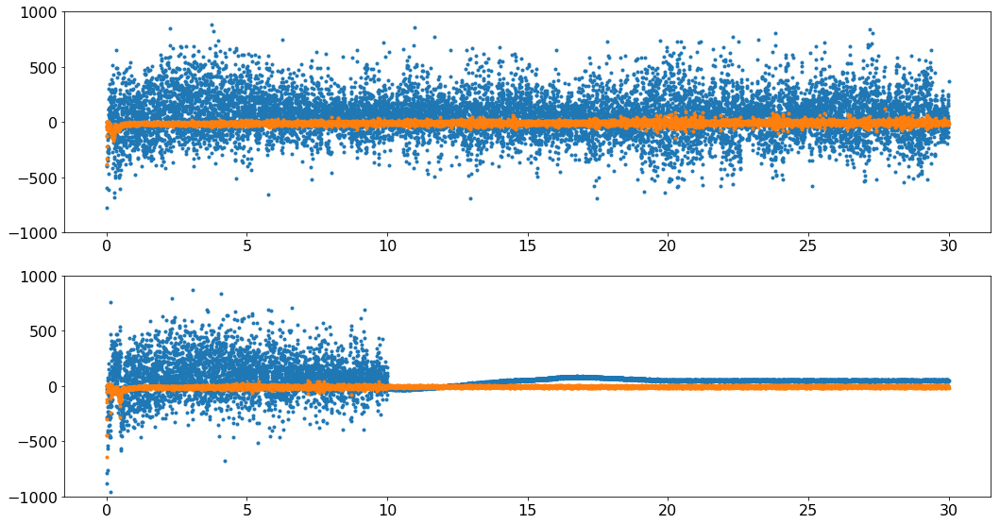

In [44]:
fig = figure(figsize = (15, 8))

#titles=['decay=1.5e-4', 'decay=1.5e-4,latent_dim=192', 'decay=1e.5e-4,base_features=48', 'all of the above']

for mi in range(2):
    
    #spis = [0, 1, 2, 4, 5]
    #spi = spis[mi]
    
    #subplot(3,2,1+spi)
    subplot(2,1,1+mi)
    with h5py.File(hist_list[mi], 'r') as hfile:

        epoch = np.arange(hfile['g_loss'][:].shape[0])*30./hfile['g_loss'][:].shape[0]
        plot(epoch, hfile['d_loss'][:], '.')
        plot(epoch, hfile['g_loss'][:], '.')
        
        #title(titles[mi])

    ylim(-1000, 1000)
    
tight_layout()

In [75]:
model_list3 = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*_22s.keras*"))

In [76]:
model_list3

array(['/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22s.keras-005',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22s.keras-007',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22s.keras-009',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22s.keras-011',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22s.keras-013',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22s.keras-015',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22s.keras-017',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22s.keras-018',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22s.keras-019',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22s.keras-020',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22s.keras-021',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22s.keras-022',
       '/work/06147/pberger/maverick2/sa

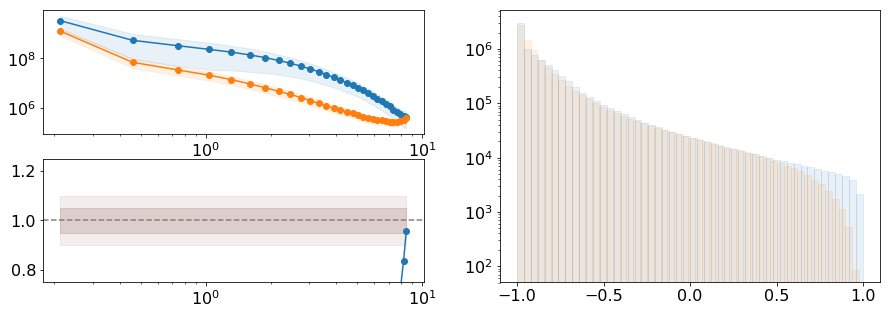

In [77]:
mi = 0
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

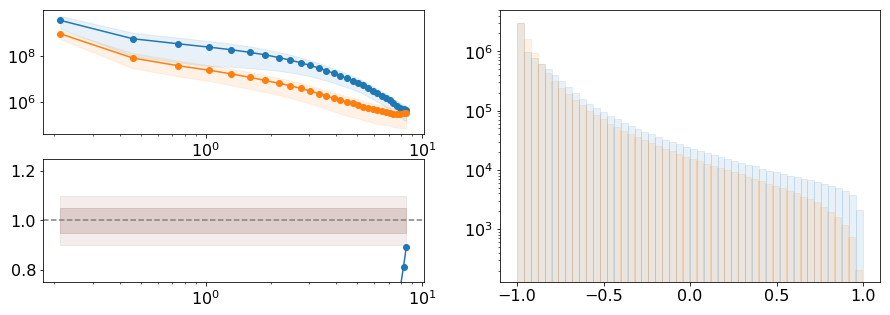

In [78]:
mi = 1
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

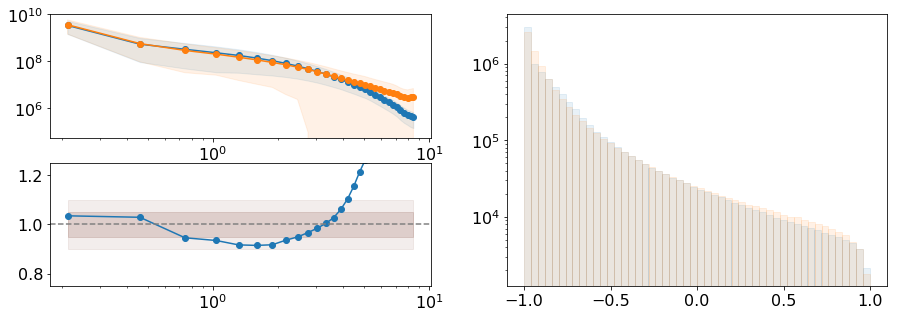

In [79]:
mi = 3
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

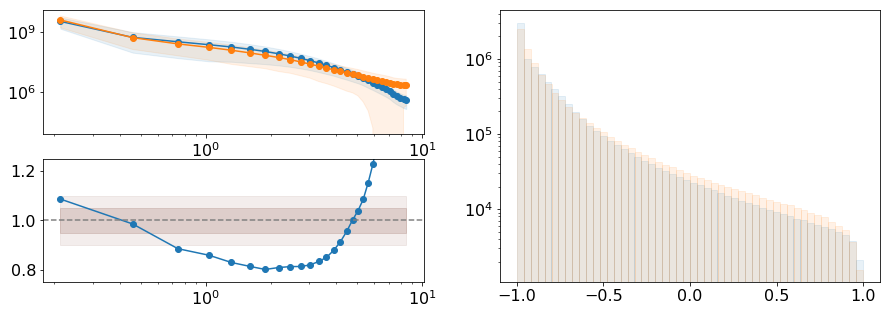

In [81]:
mi = 8
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

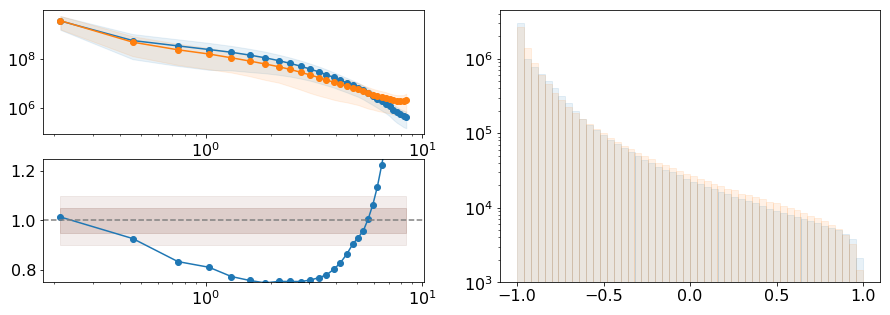

In [80]:
mi = 9
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

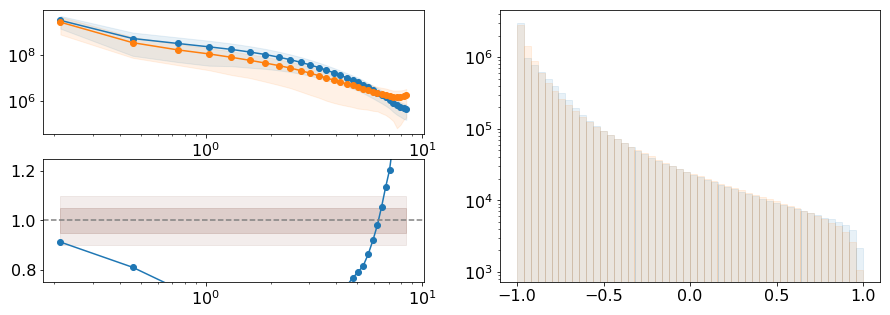

In [82]:
mi = 10
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

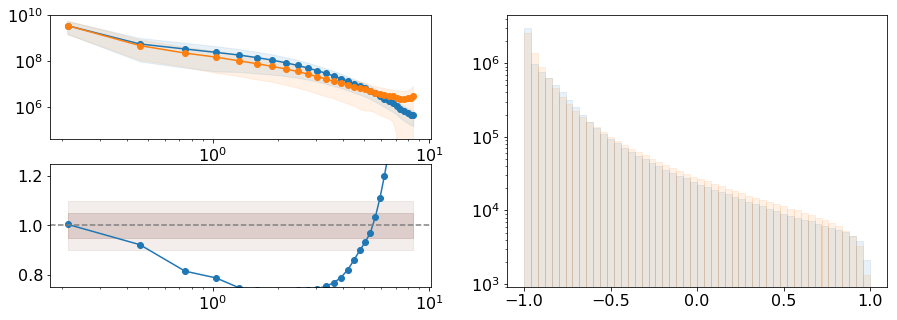

In [83]:
mi = 11
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

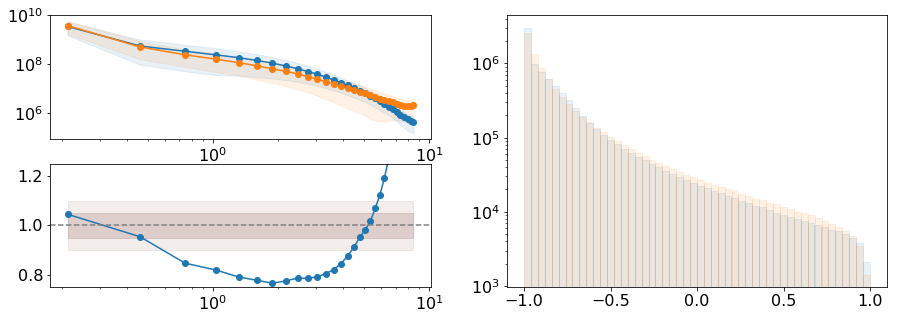

In [84]:
mi = 12
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

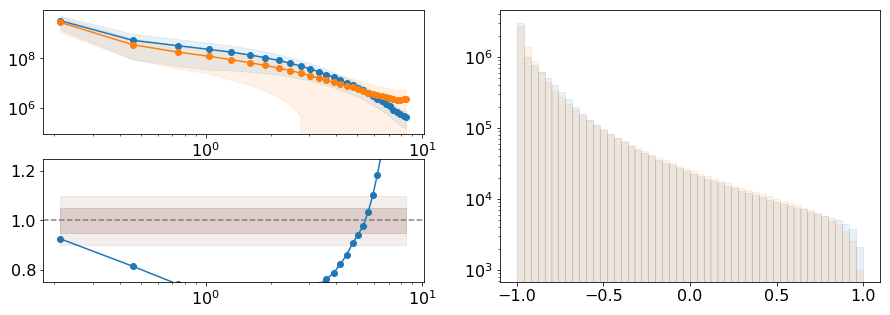

In [85]:
mi = 13
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

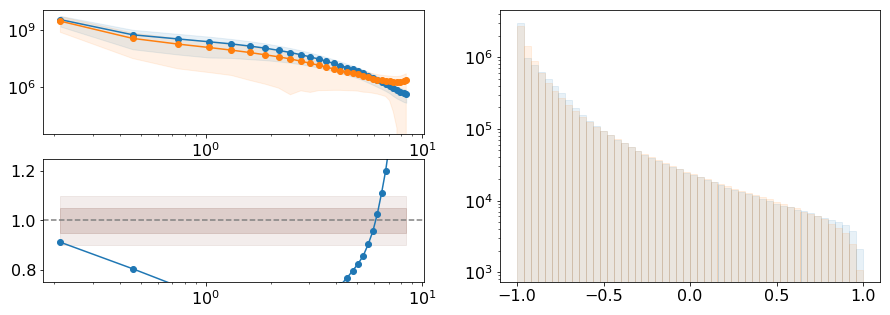

In [86]:
mi = 14
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

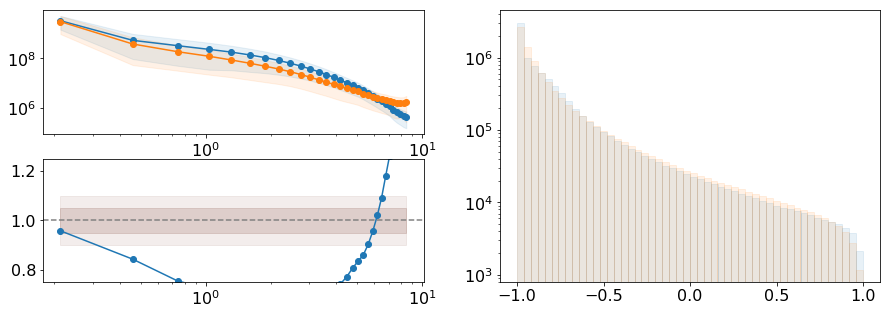

In [87]:
mi = 15
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

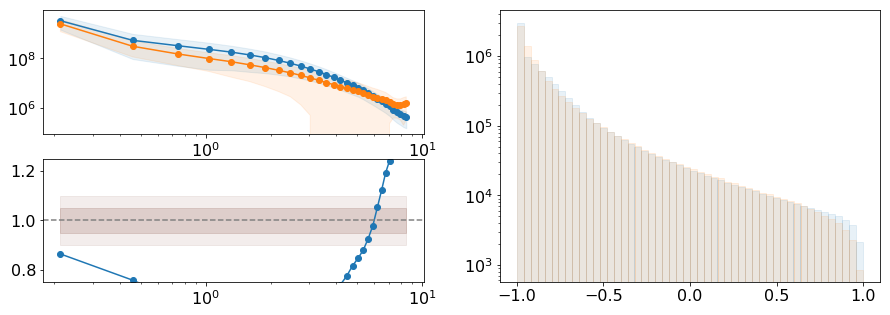

In [88]:
mi = 16
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

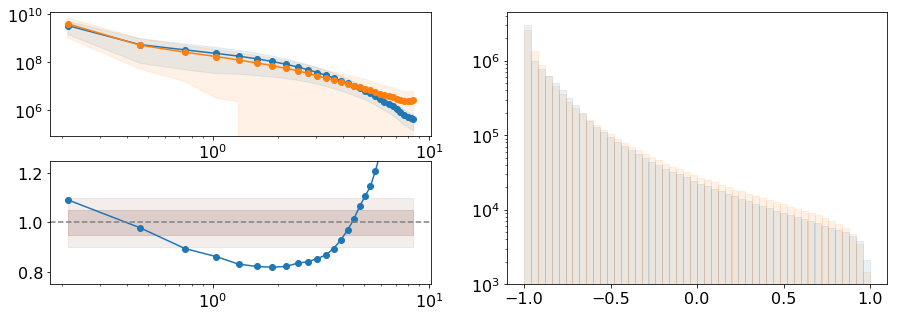

In [89]:
mi = 17
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

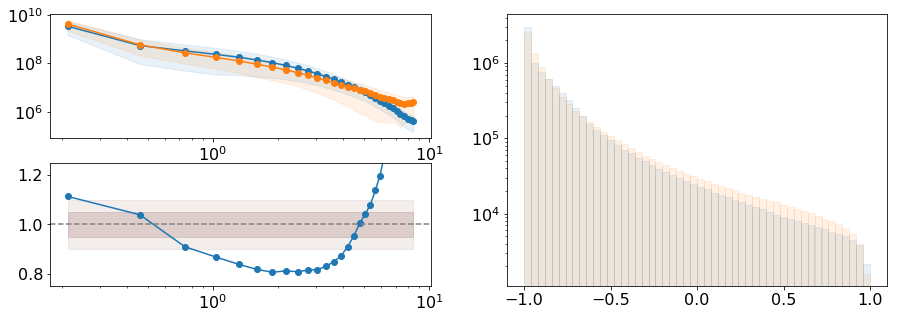

In [90]:
mi = 18
model = km.load_model(model_list3[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

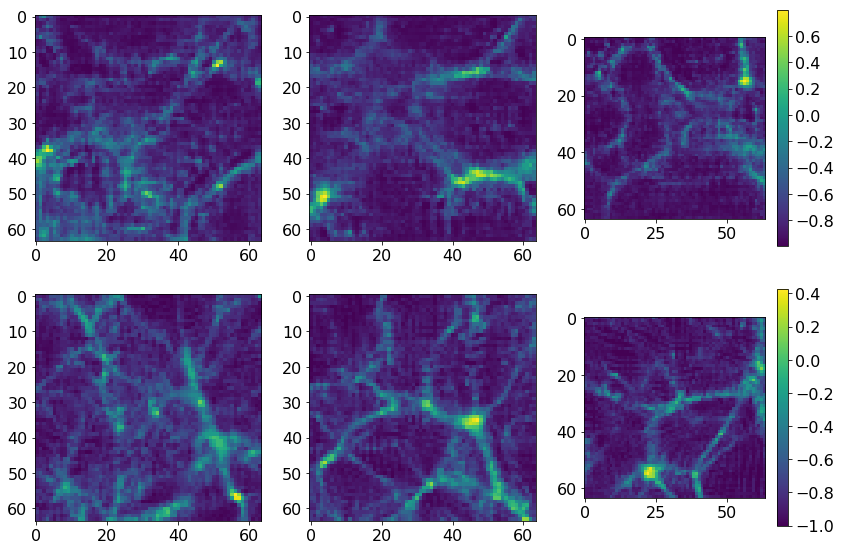

In [112]:
fig = figure(figsize = (12, 8))
imi=5
subplot(2,3,1)
imshow(np.mean(test_imgs[imi, 32-5:32+5], axis=0))
subplot(2,3,2)
imshow(np.mean(test_imgs[imi, :, 32-5:32+5], axis=1))
subplot(2,3,3)
imshow(np.mean(test_imgs[imi, :, :, 32-5:32+5], axis=2))
colorbar()


imi=5
subplot(2,3,4)
imshow(np.mean(real_imgs[imi, 32-5:32+5], axis=0))
subplot(2,3,5)
imshow(np.mean(real_imgs[imi, :, 32-5:32+5], axis=1))
subplot(2,3,6)
imshow(np.mean(real_imgs[imi, :, :, 32-5:32+5], axis=2))
colorbar()

tight_layout()

In [16]:
hist_list = glob.glob("/work/06147/pberger/maverick2/saved_models/*-3.history5")
#hist_list.pop(3)
hist_list = np.sort(hist_list)
hist_list

array(['/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-3.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_21s-3.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22s-3.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_23s-3.history5'],
      dtype='|S70')

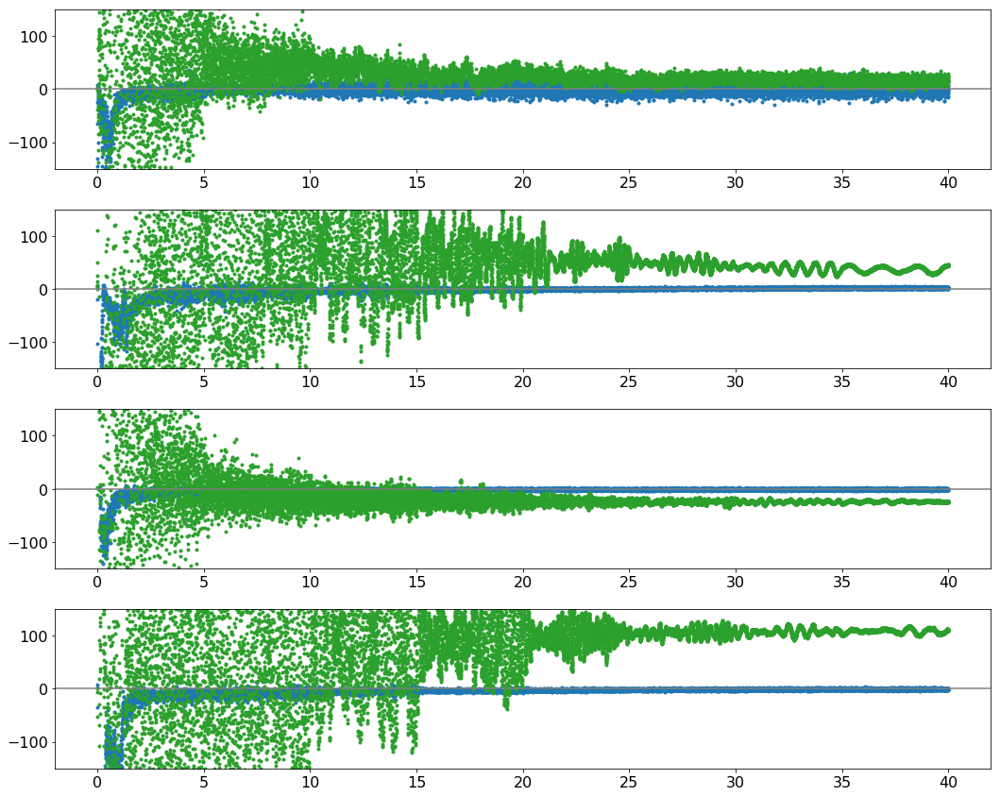

In [26]:
fig = figure(figsize = (15, 12))

#titles=['decay=1.5e-4', 'decay=1.5e-4,latent_dim=192', 'decay=1e.5e-4,base_features=48', 'all of the above']

for mi in range(4):
    
    #spis = [0, 1, 2, 4, 5]
    #spi = spis[mi]
    
    #subplot(3,2,1+spi)
    subplot(4,1,1+mi)
    with h5py.File(hist_list[mi], 'r') as hfile:

        epoch = np.arange(hfile['g_loss'][:].shape[0])*40./hfile['g_loss'][:].shape[0]
        plot(epoch, hfile['g_loss'][:], '.')
        plot(epoch, hfile['d_loss'][:], '.', c='C2')
        
        #title(titles[mi])

    ylim(-150, 150)
    axhline(0.0, c='grey')
    
tight_layout()

In [104]:
model_list = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*20s-3.keras*"))

In [105]:
model_list

array(['/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-3.keras-005',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-3.keras-009',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-3.keras-011',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-3.keras-015',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-3.keras-017',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-3.keras-019',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-3.keras-021',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-3.keras-023',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-3.keras-025',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-3.keras-026',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-3.keras-027',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-3.keras-028',
       '/work/06

In [32]:
latent_dim=192

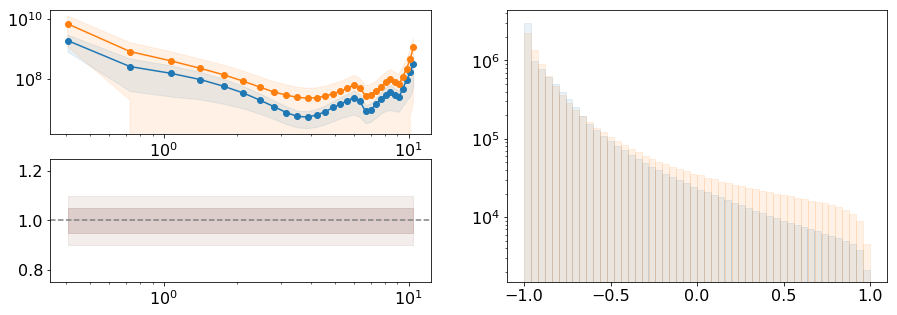

In [106]:
mi = 0
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

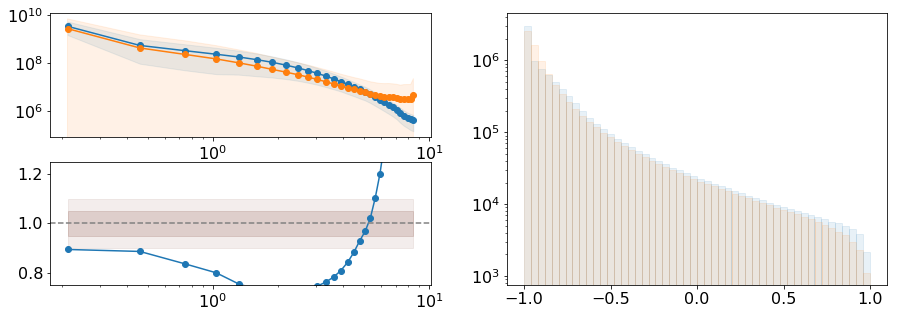

In [34]:
mi = 1
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [ ]:
mi = 15
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

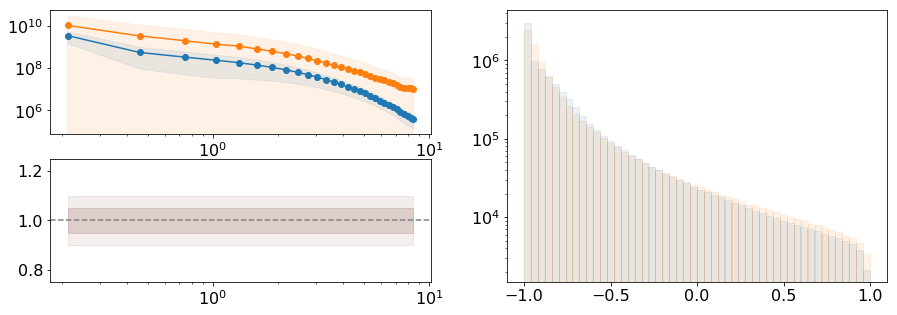

In [47]:
mi = 20
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

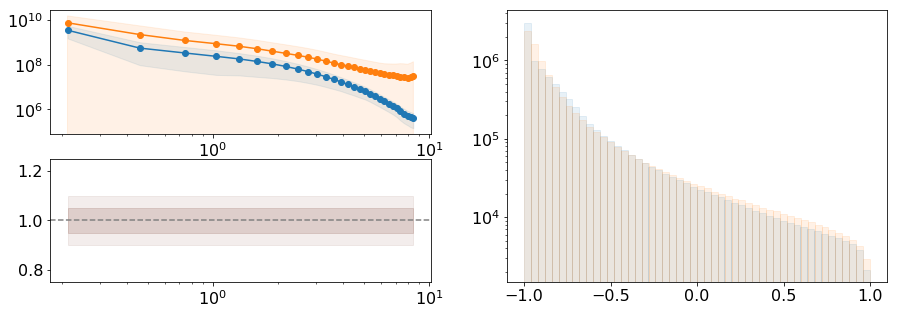

In [51]:
mi = 19
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

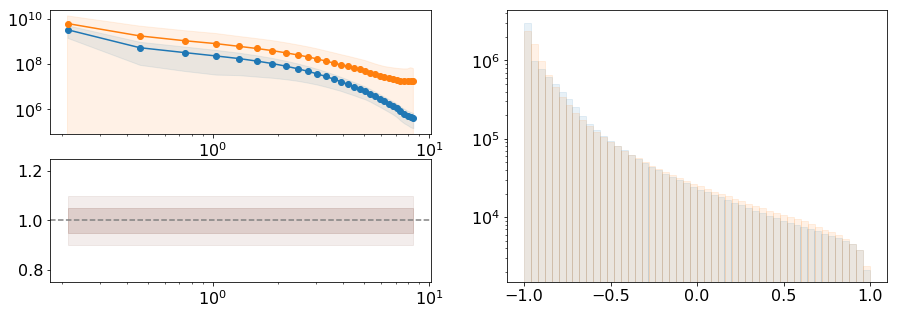

In [50]:
mi = 21
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

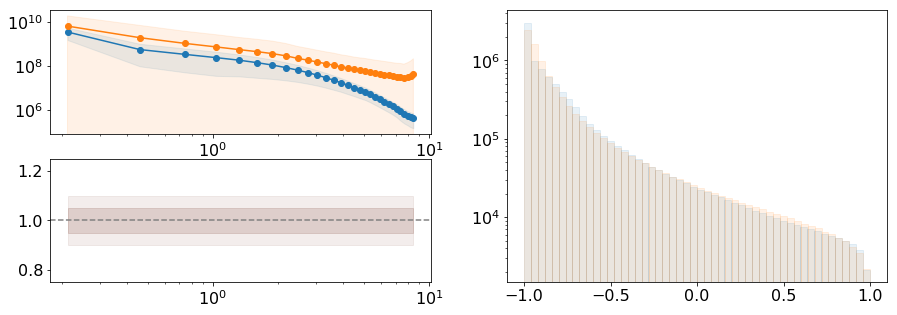

In [49]:
mi = 22
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [16]:
latent_dim=192

In [14]:
model_list = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*21s-3.keras*"))

In [38]:
model_list[19]

'/work/06147/pberger/maverick2/saved_models/gen_resnet3d_21s-3.keras-036'

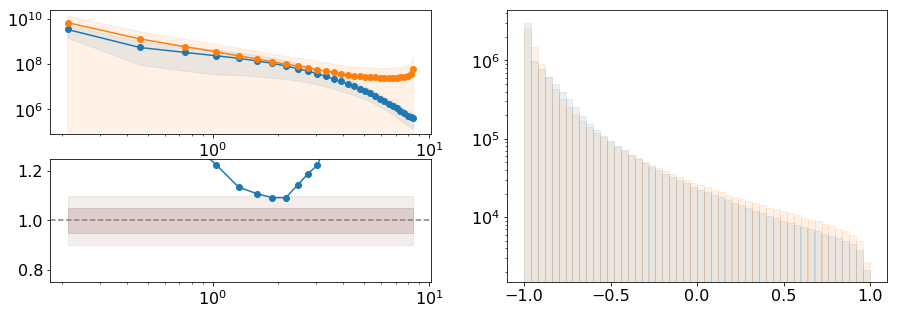

In [21]:
mi = 2
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

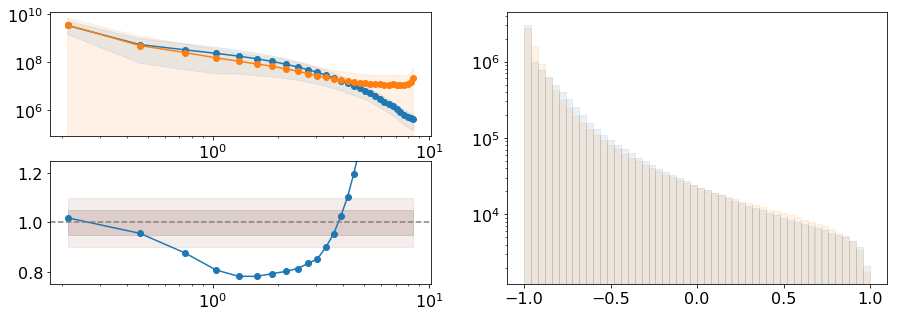

In [23]:
mi = 4
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

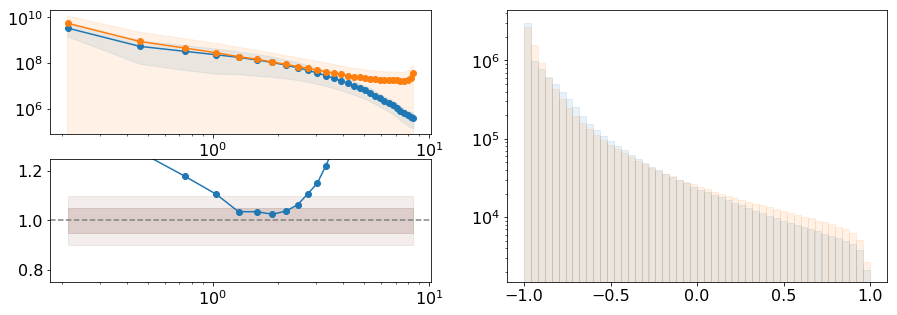

In [26]:
mi = 6
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

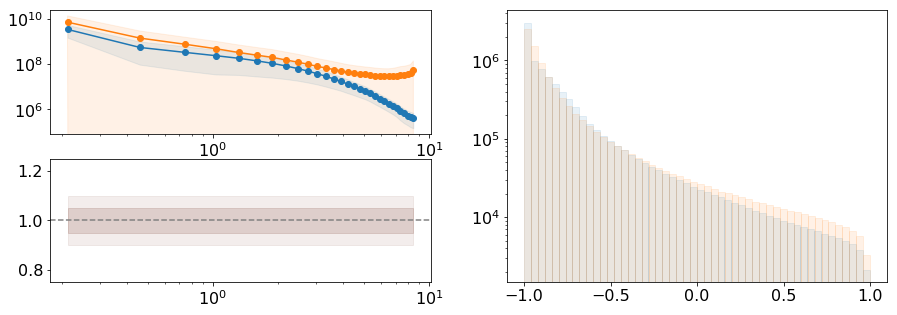

In [29]:
mi = 8
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

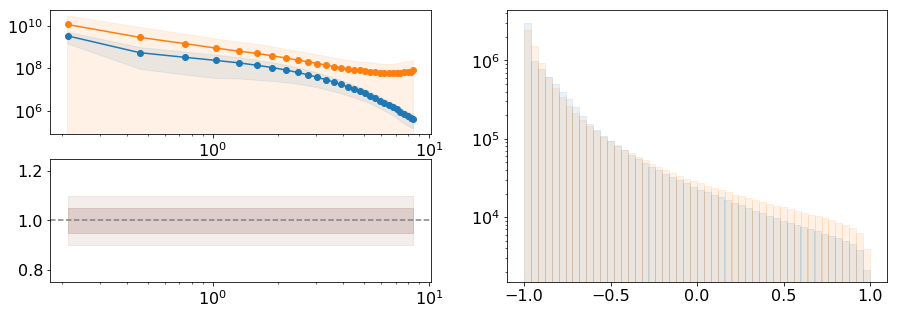

In [30]:
mi = 10
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

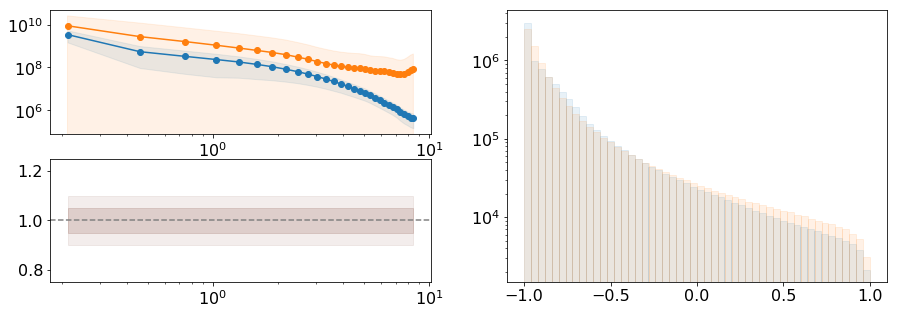

In [32]:
mi = 13
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

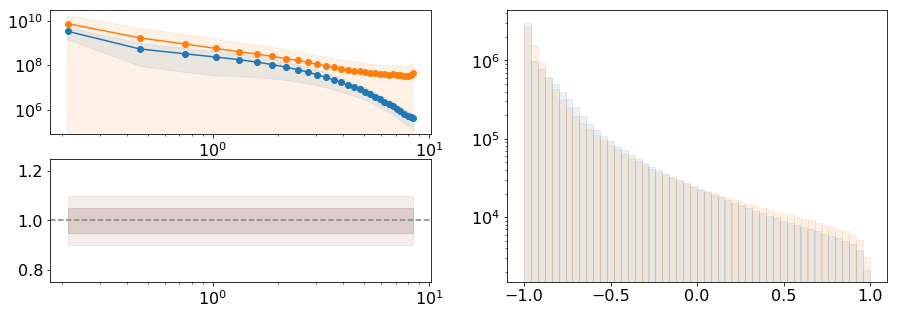

In [35]:
mi = 15
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

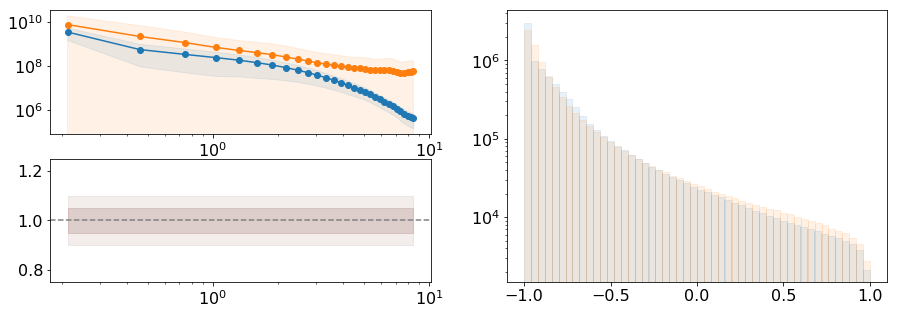

In [39]:
mi = 17
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

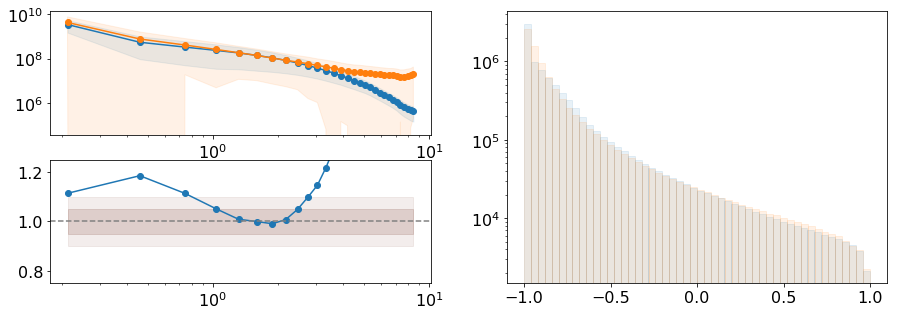

In [36]:
mi = 18
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

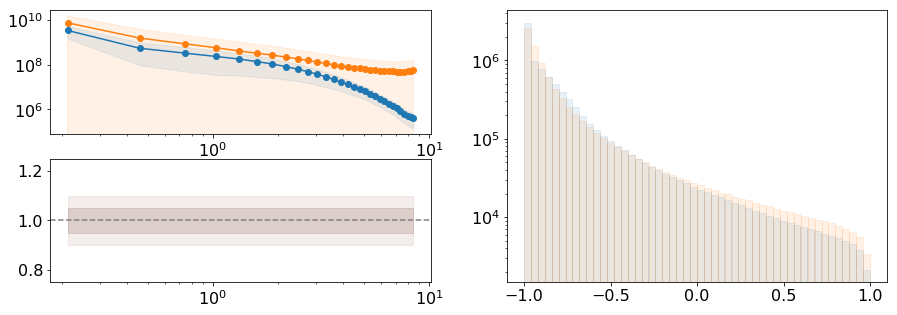

In [37]:
mi = 19
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

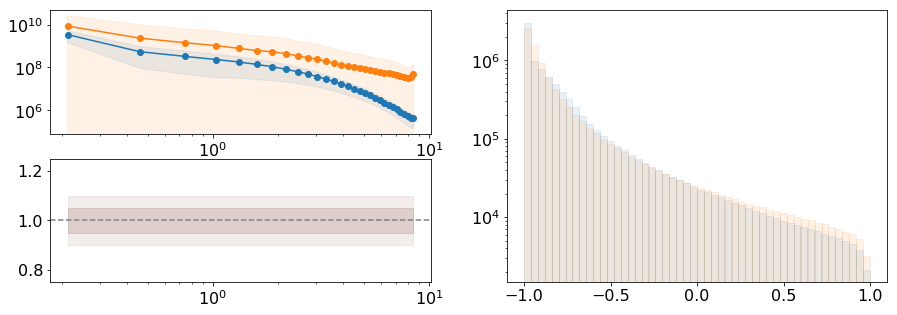

In [40]:
mi = 20
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

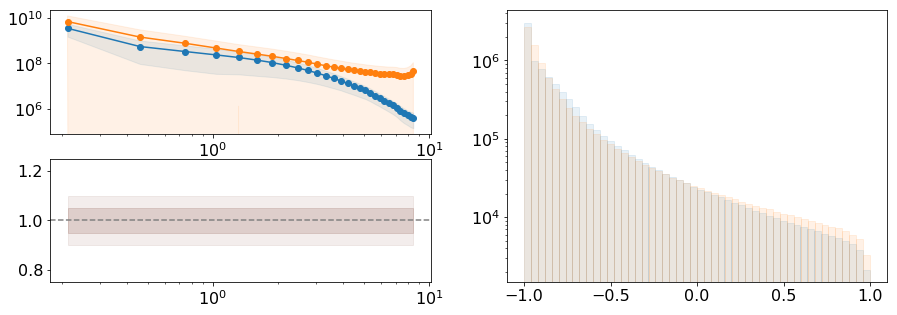

In [41]:
mi = 21
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

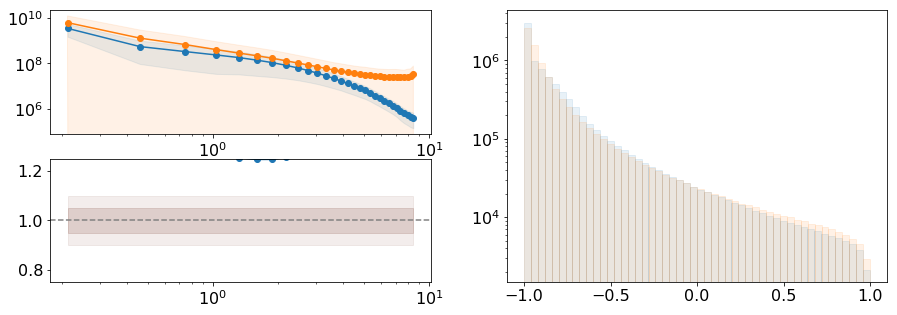

In [42]:
mi = 22
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [44]:
model_list = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*22s-3.keras*"))

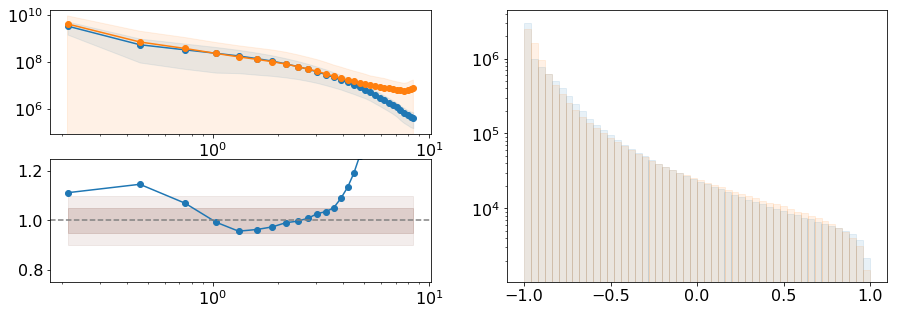

In [47]:
mi = 0
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

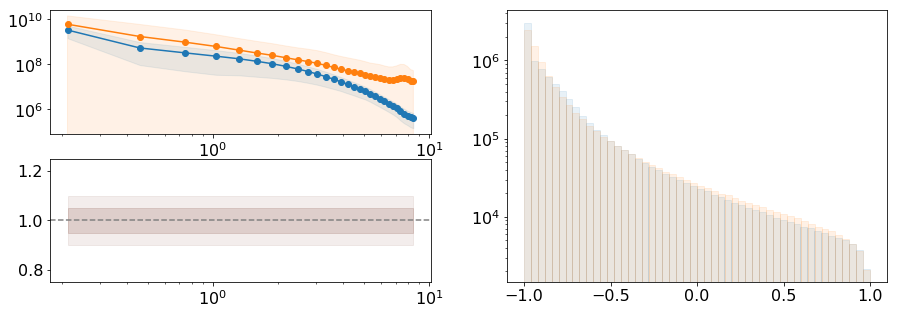

In [48]:
mi = 1
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

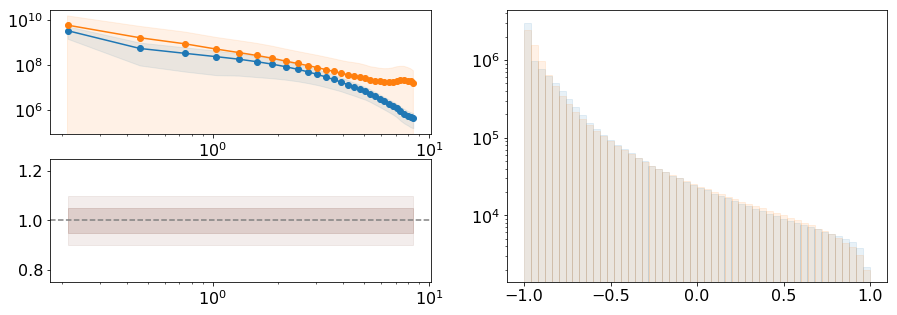

In [49]:
mi = 2
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

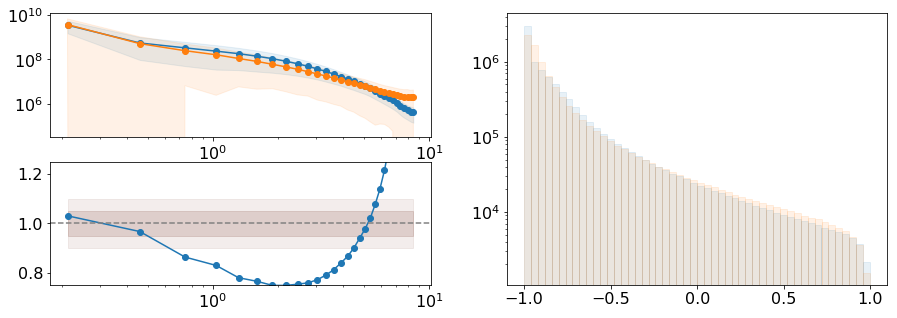

In [50]:
mi = 3
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

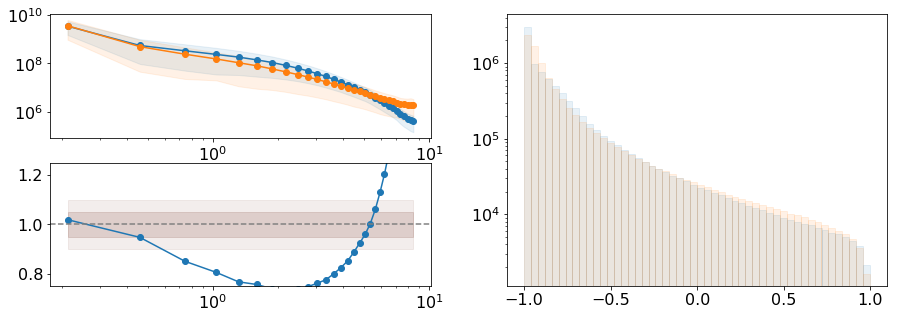

In [51]:
mi = 4
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

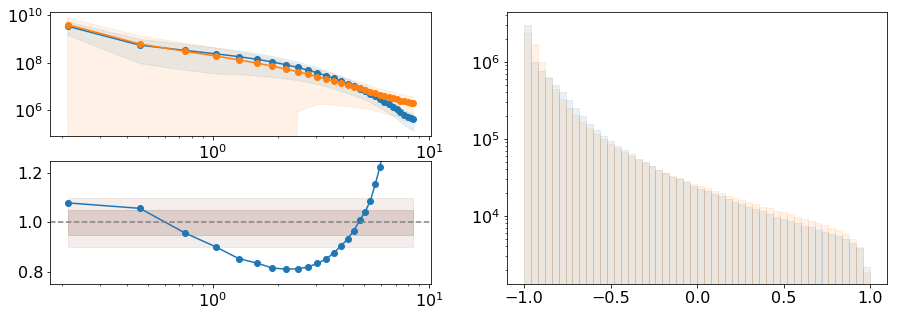

In [52]:
mi = 5
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

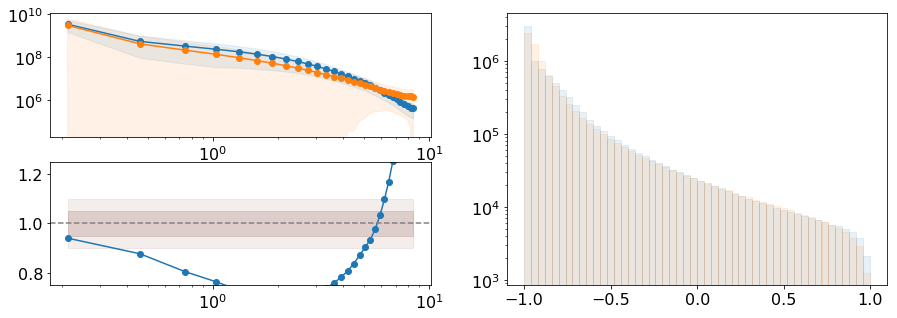

In [53]:
mi = 6
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

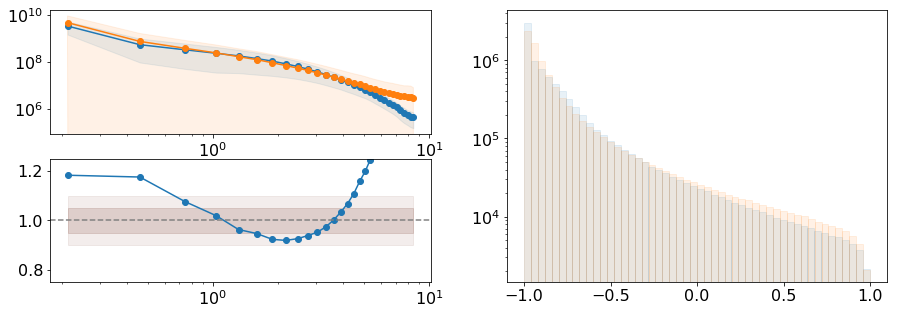

In [54]:
mi = 7
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

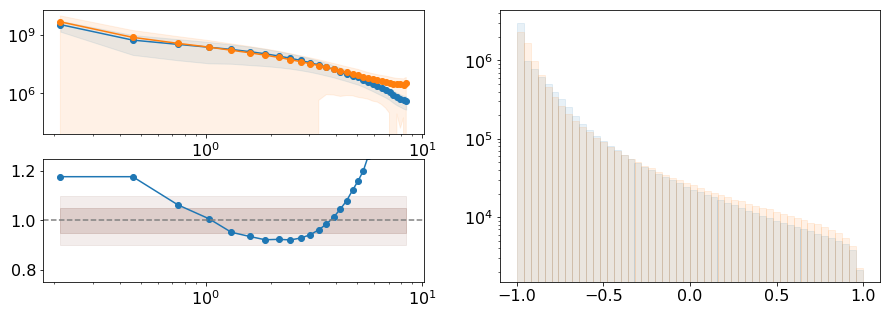

In [55]:
mi = 8
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

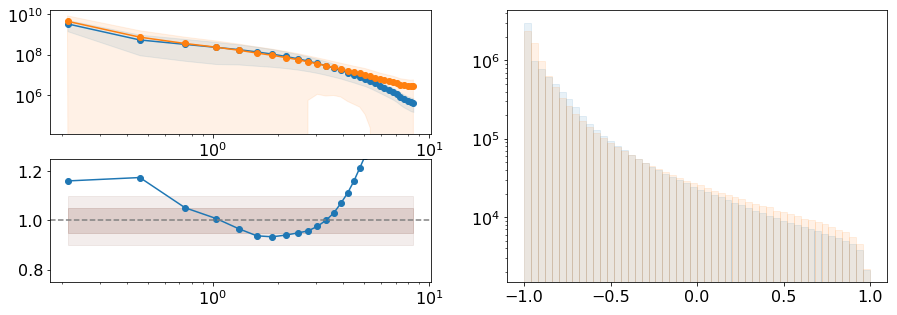

In [56]:
mi = 9
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

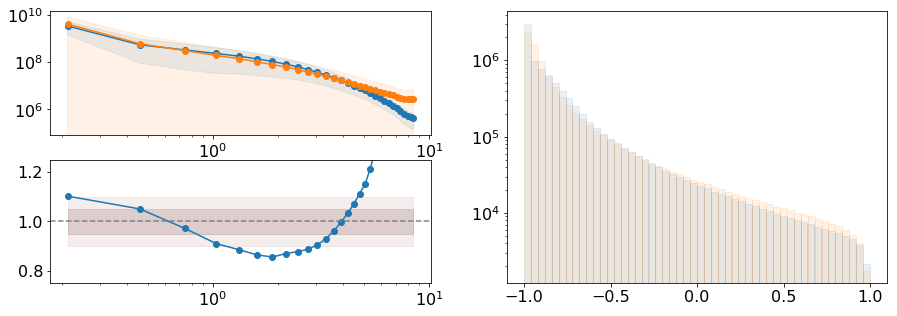

In [57]:
mi = 10
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

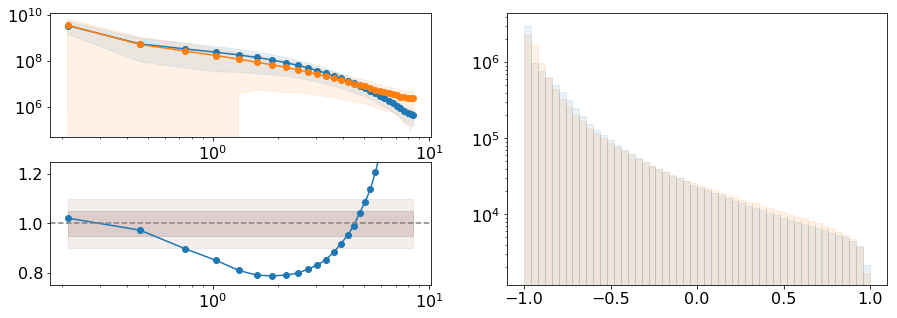

In [58]:
mi = 11
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

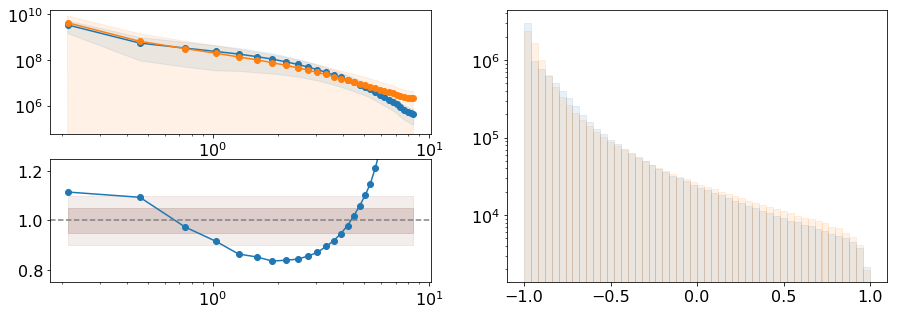

In [60]:
mi = 13
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

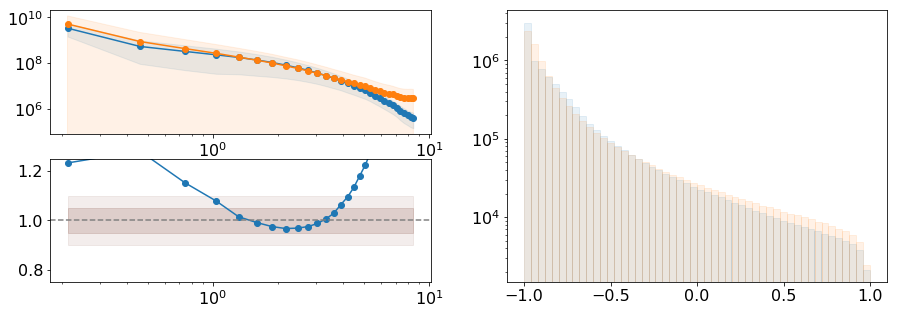

In [61]:
mi = 15
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

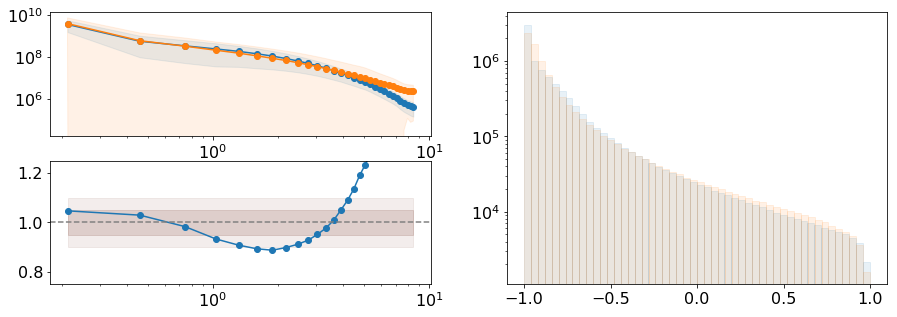

In [64]:
mi = 18
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

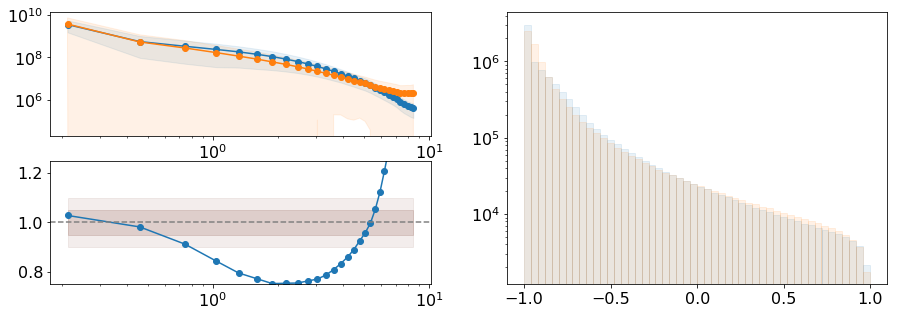

In [65]:
mi = 19
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

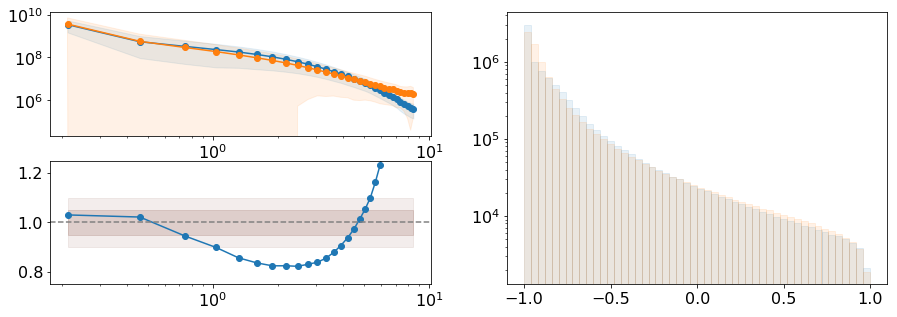

In [66]:
mi = 20
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

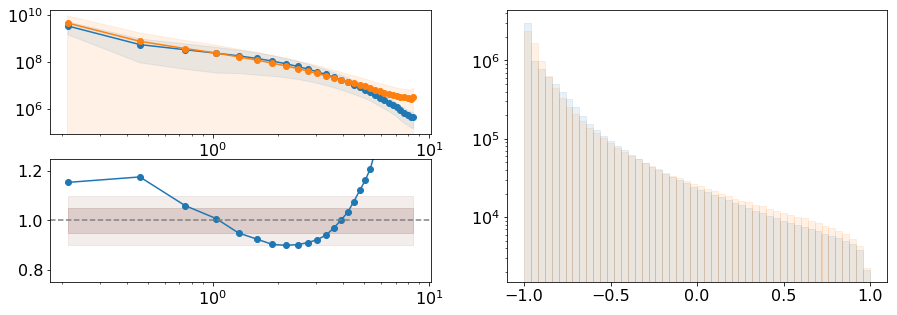

In [67]:
mi = 21
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

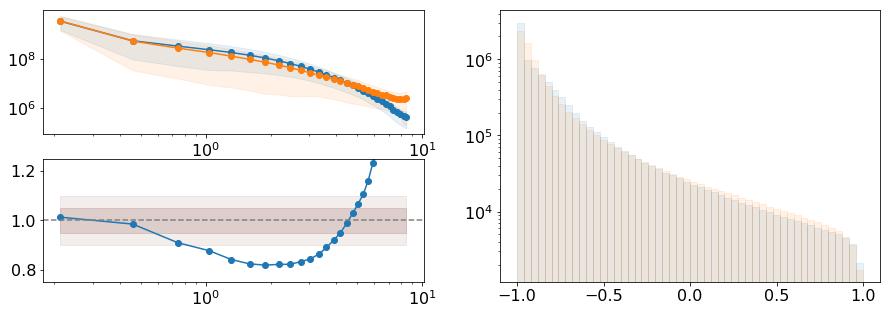

In [68]:
mi = 22
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [74]:
model_list = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*23s-3.keras*"))

In [75]:
model_list[0]

'/work/06147/pberger/maverick2/saved_models/gen_resnet3d_23s-3.keras-005'

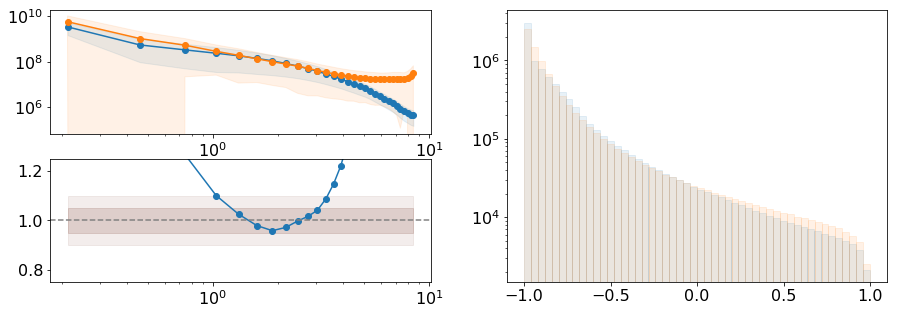

In [77]:
mi = 0
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

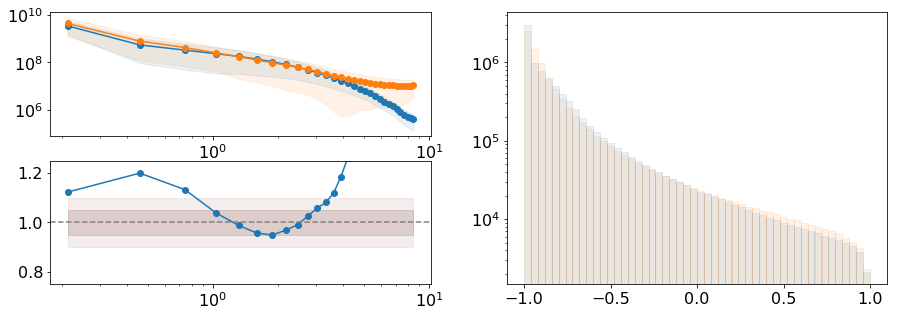

In [82]:
mi = 1
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

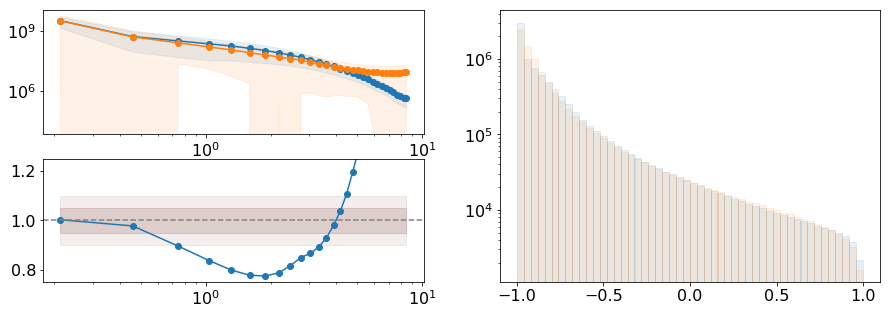

In [83]:
mi = 2
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

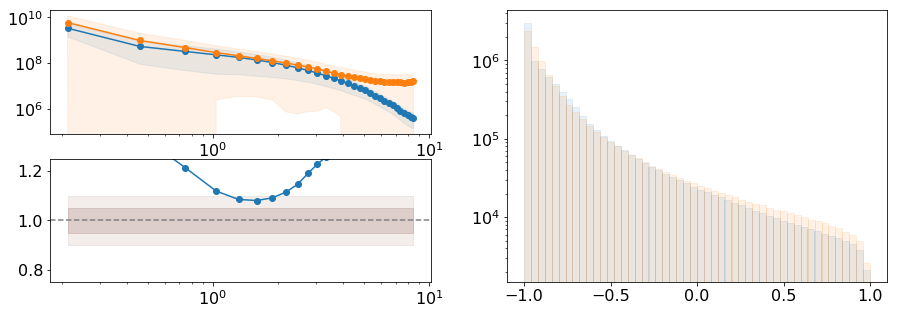

In [84]:
mi = 3
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

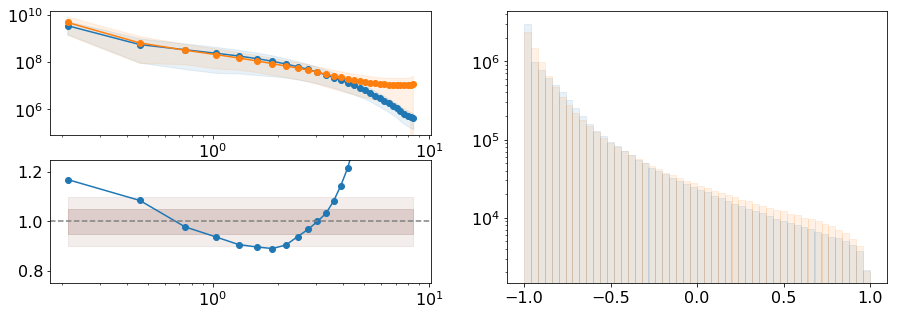

In [85]:
mi = 4
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

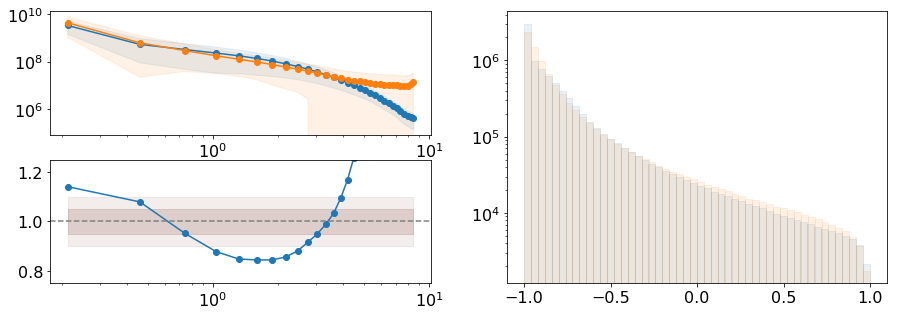

In [86]:
mi = 5
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

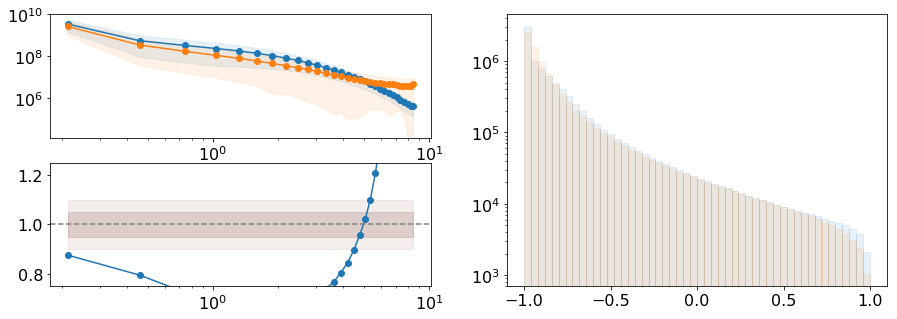

In [87]:
mi = 6
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

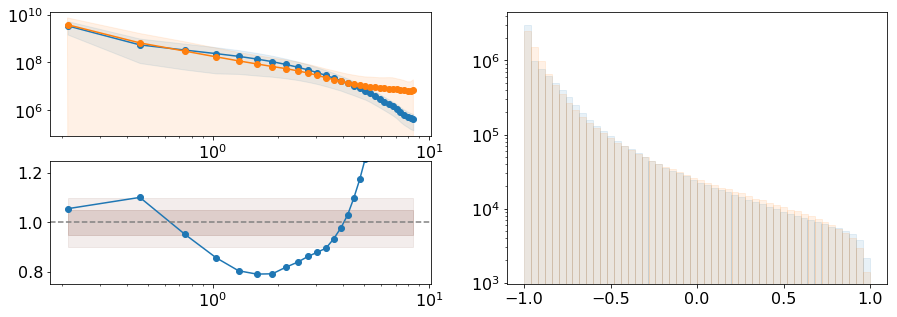

In [88]:
mi = 7
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

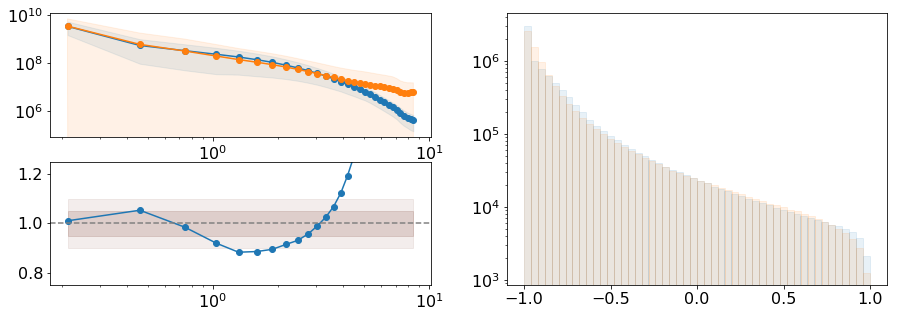

In [89]:
mi = 8
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

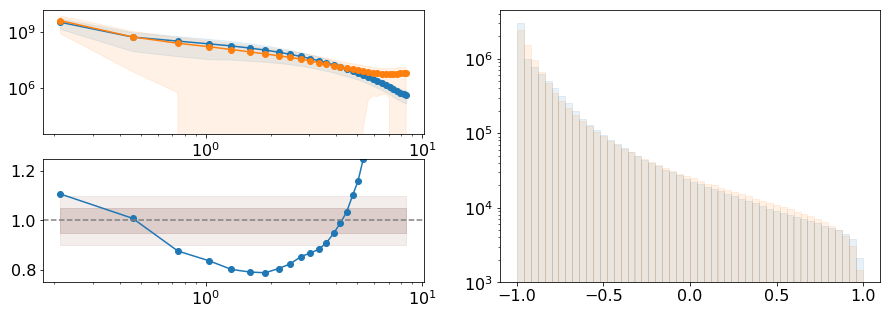

In [90]:
mi = 9
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

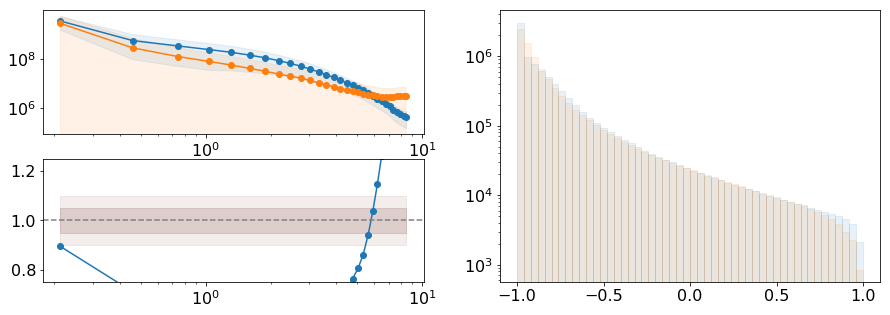

In [81]:
mi = 18
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

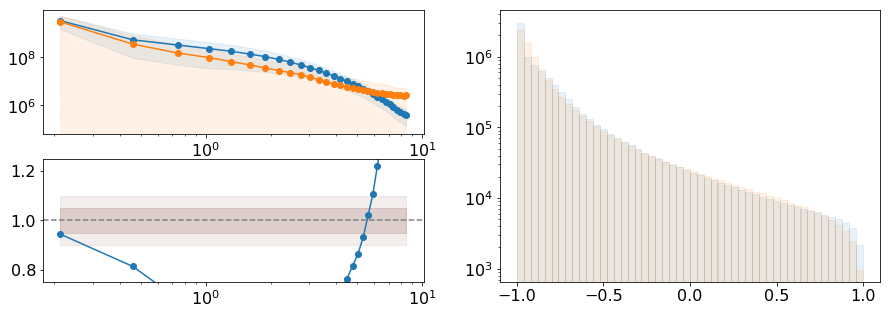

In [80]:
mi = 19
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

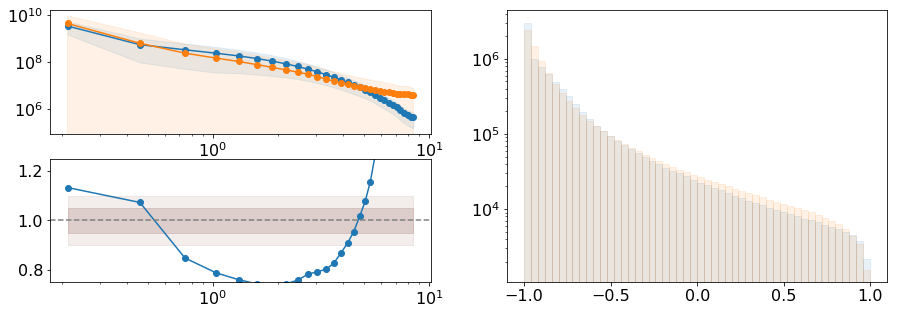

In [79]:
mi = 20
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

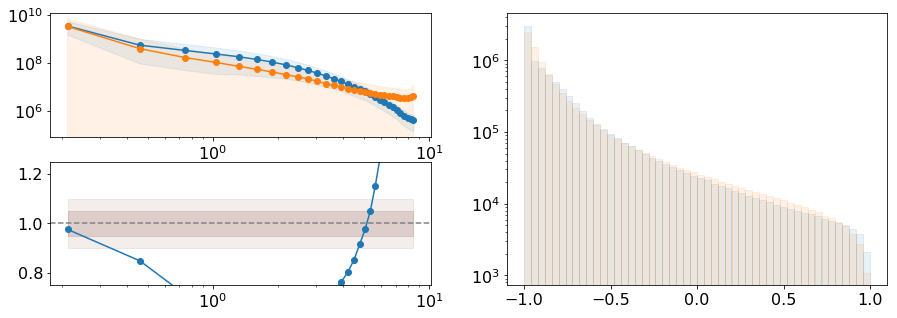

In [78]:
mi = 21
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

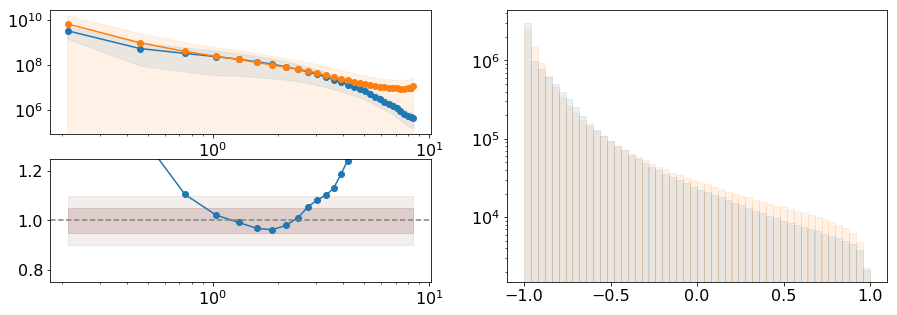

In [76]:
mi = 22
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [95]:
model_list = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*_23.keras*"))

/home1/06147/pberger/source/gan-work/kgan/kgan/tools/delta.py:21: RuntimeWarning: divide by zero encountered in divide
  return -a*(y+1)/(y-1)


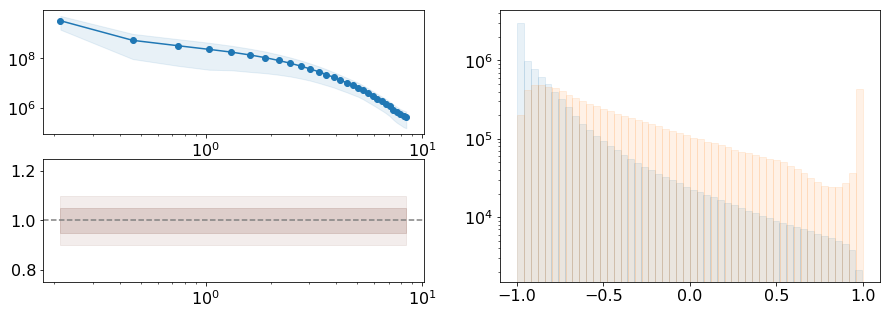

In [96]:
mi = 0
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

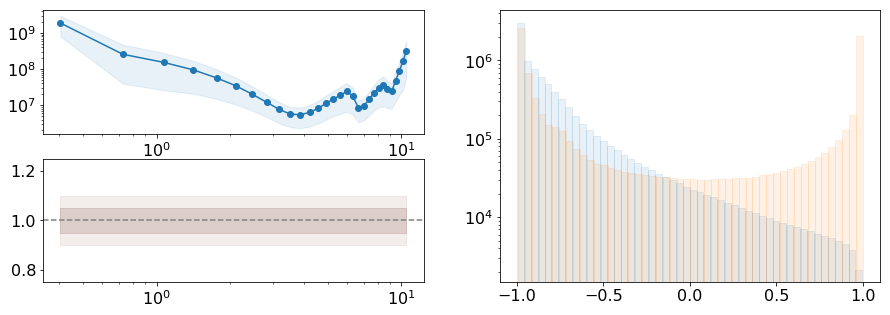

In [103]:
mi = 1
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [19]:
hist_list = glob.glob("/work/06147/pberger/maverick2/saved_models/*-4.history5")
#hist_list.pop(3)
hist_list = np.sort(hist_list)
hist_list

array(['/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-4.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_21s-4.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22s-4.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_23s-4.history5'],
      dtype='|S70')

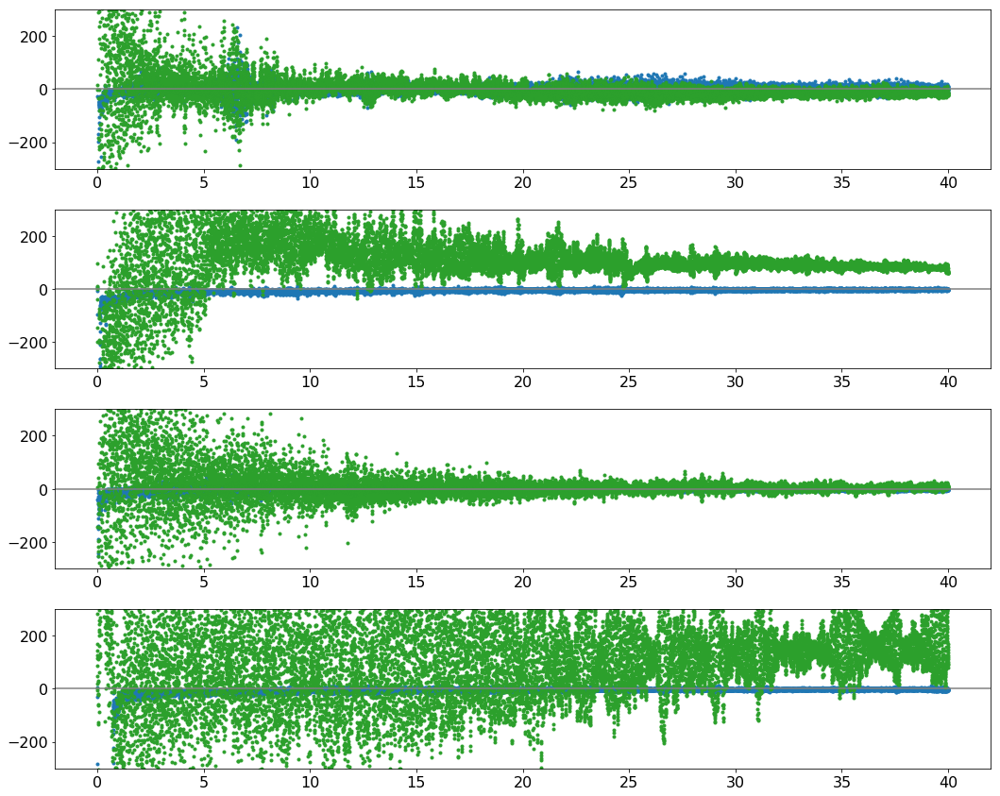

In [21]:
fig = figure(figsize = (15, 12))

#titles=['decay=1.5e-4', 'decay=1.5e-4,latent_dim=192', 'decay=1e.5e-4,base_features=48', 'all of the above']

for mi in range(4):
    
    #spis = [0, 1, 2, 4, 5]
    #spi = spis[mi]
    
    #subplot(3,2,1+spi)
    subplot(4,1,1+mi)
    with h5py.File(hist_list[mi], 'r') as hfile:

        epoch = np.arange(hfile['g_loss'][:].shape[0])*40./hfile['g_loss'][:].shape[0]
        plot(epoch, hfile['g_loss'][:], '.')
        plot(epoch, hfile['d_loss'][:], '.', c='C2')
        
        #title(titles[mi])

    ylim(-300, 300)
    axhline(0.0, c='grey')
    
tight_layout()

In [101]:
model_list = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*_20s-4.keras*"))

In [25]:
latent_dim = 192

In [36]:
model_list[19]

'/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-4.keras-036'

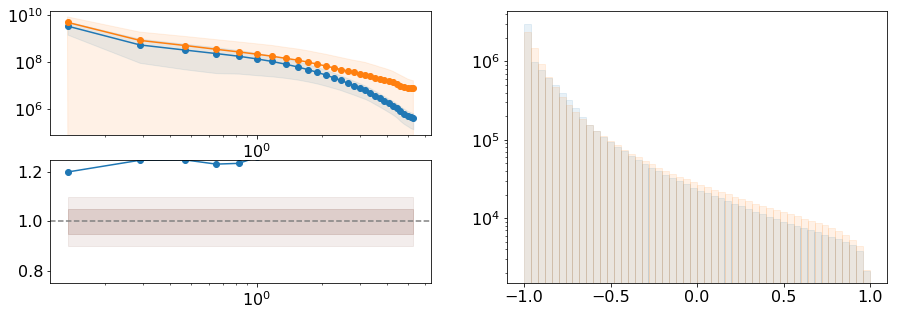

In [26]:
mi = 0
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

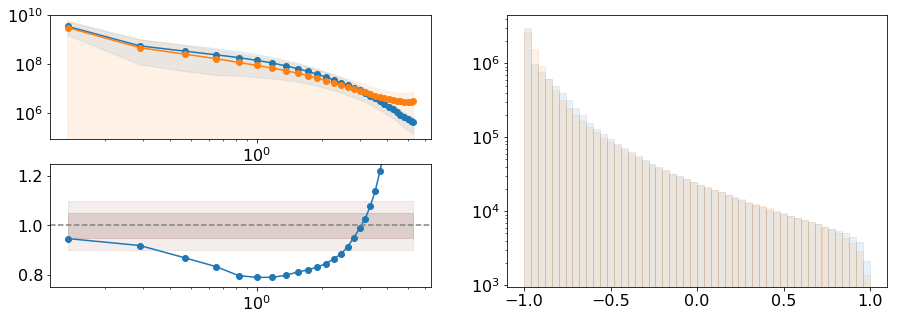

In [27]:
mi = 3
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

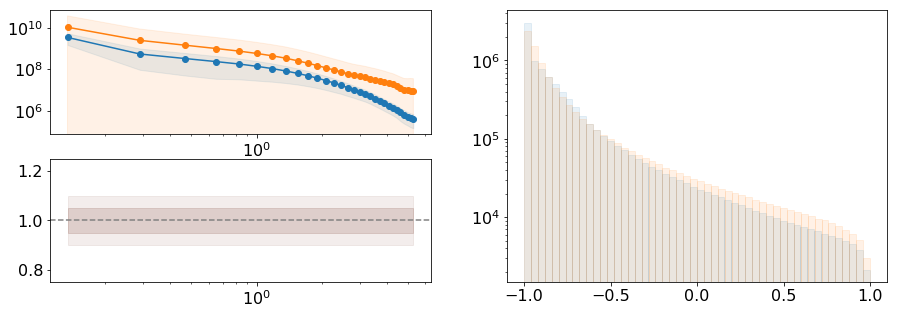

In [32]:
mi = 9
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

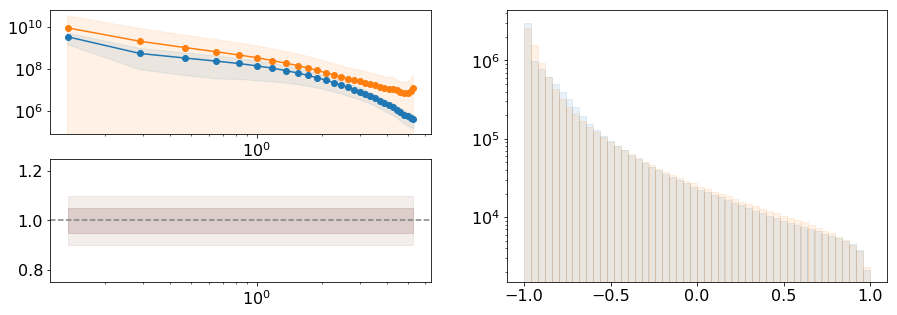

In [31]:
mi = 10
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

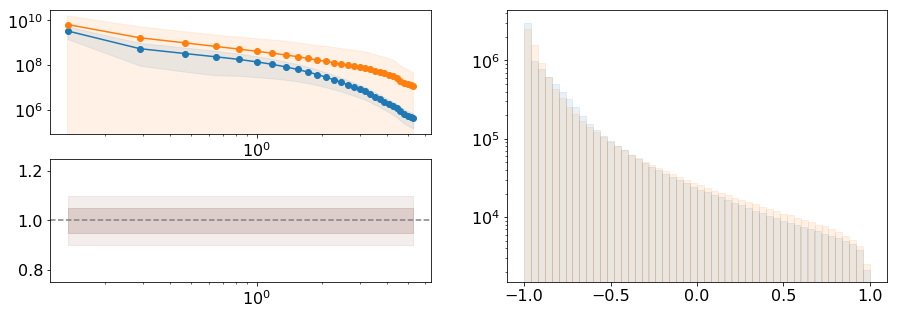

In [33]:
mi = 11
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

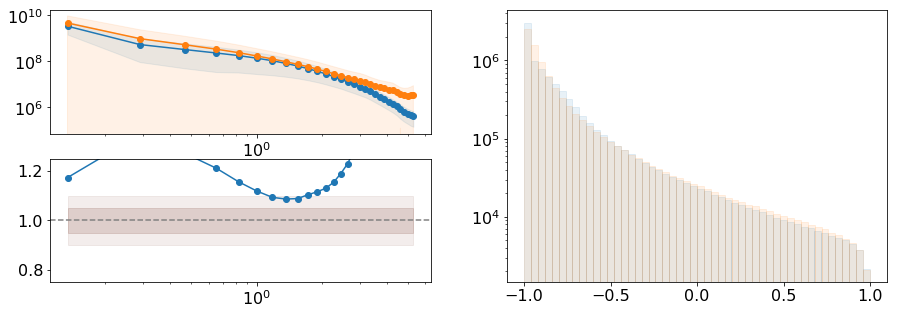

In [39]:
mi = 15
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

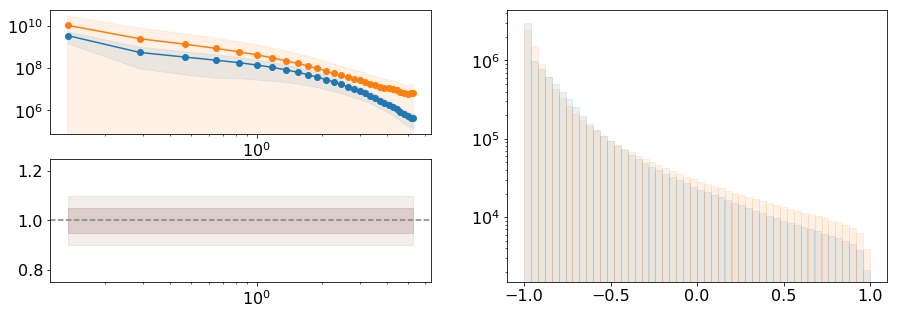

In [40]:
mi = 16
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

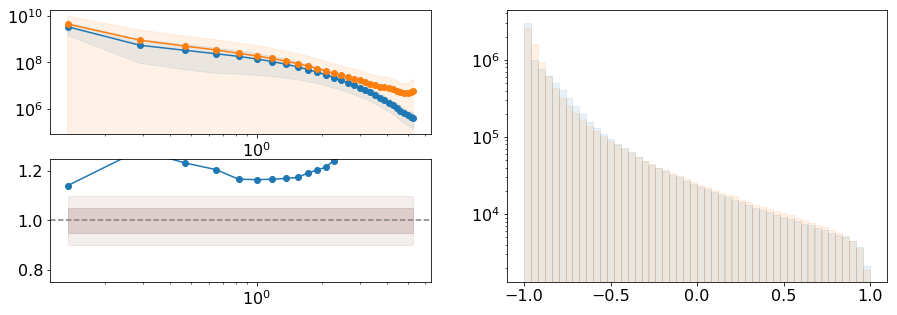

In [41]:
mi = 17
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

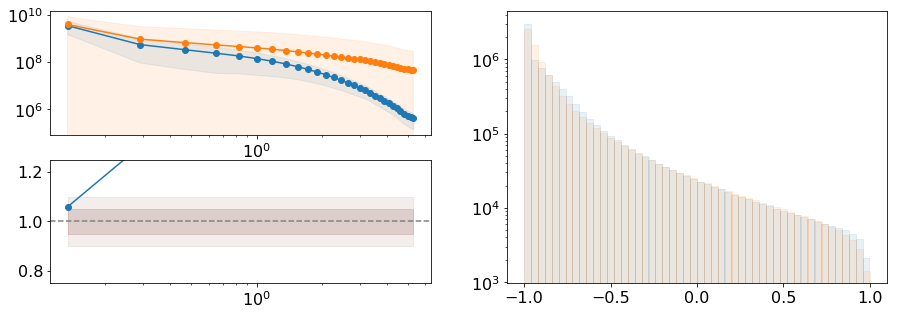

In [37]:
mi = 18
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

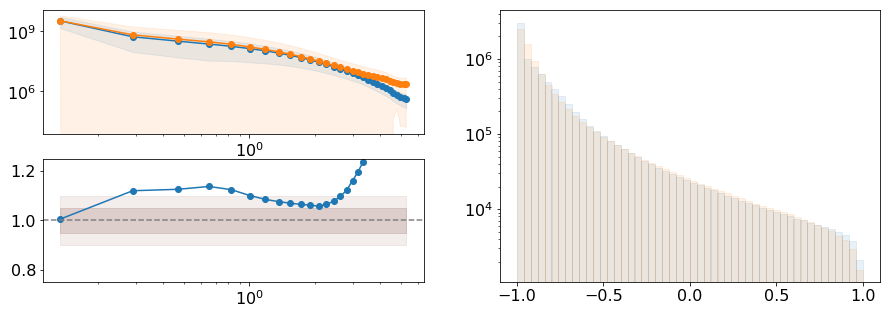

In [38]:
mi = 19
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

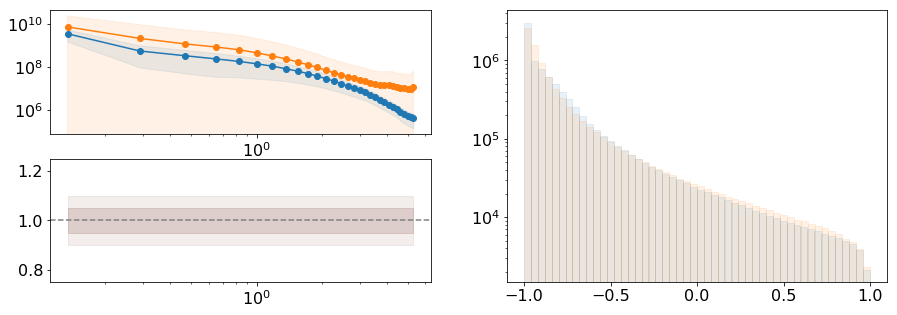

In [102]:
mi = 20
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

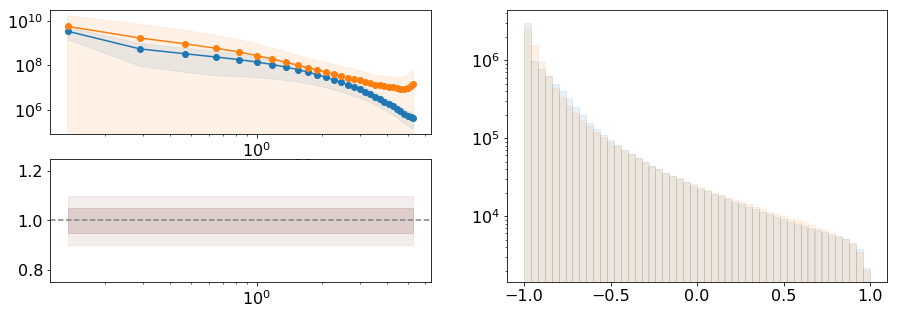

In [103]:
mi = 21
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

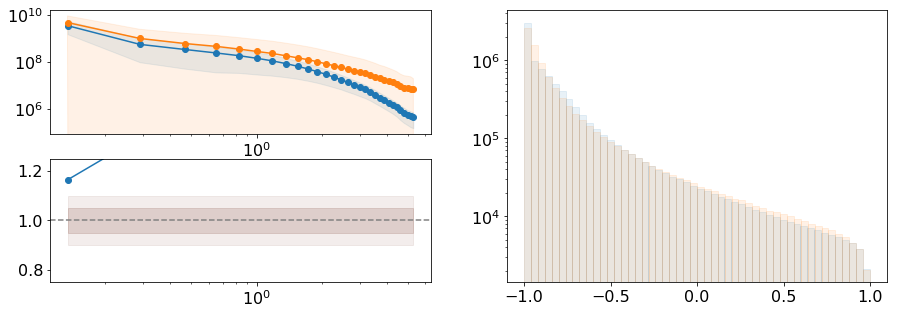

In [50]:
mi = 22
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [42]:
model_list = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*_21s-4.keras*"))

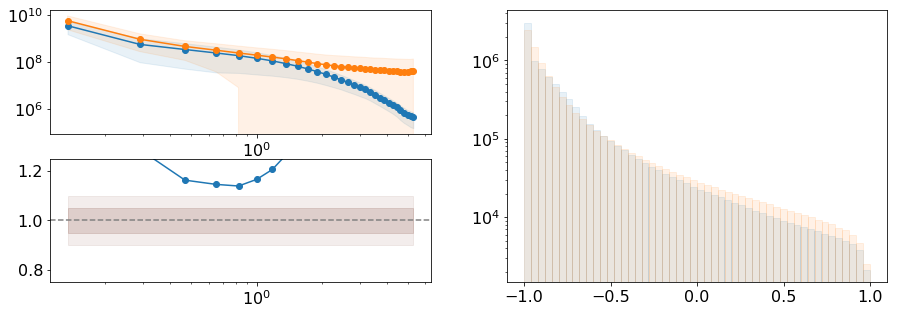

In [43]:
mi = 0
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

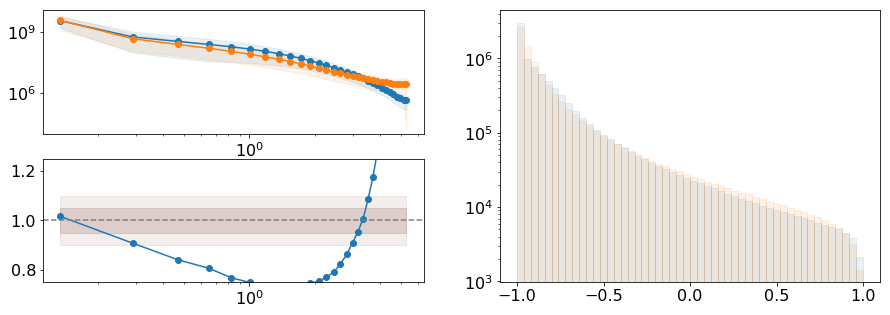

In [44]:
mi = 3
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

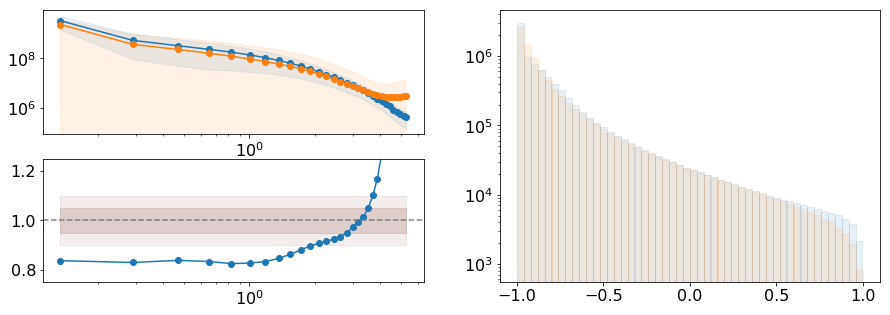

In [45]:
mi = 10
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

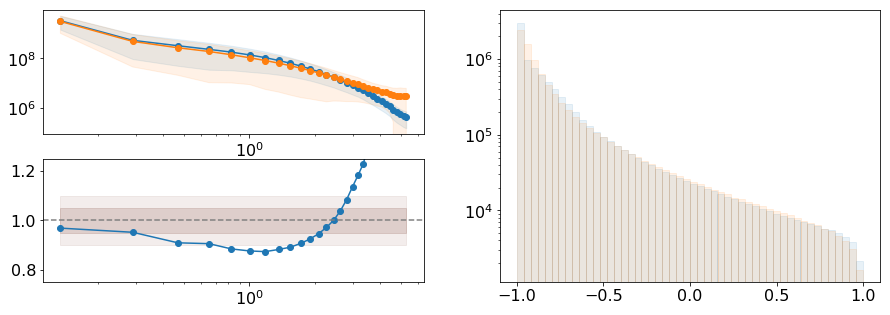

In [51]:
mi = 15
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

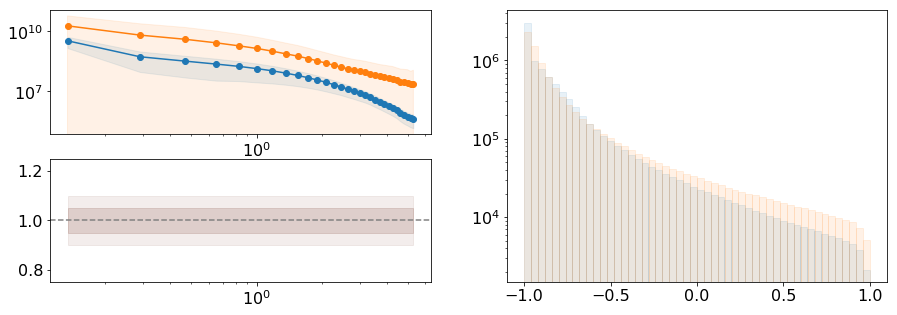

In [52]:
mi = 16
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

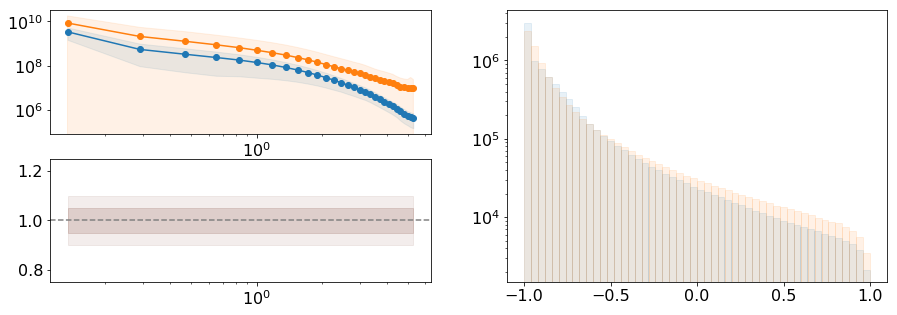

In [53]:
mi = 17
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

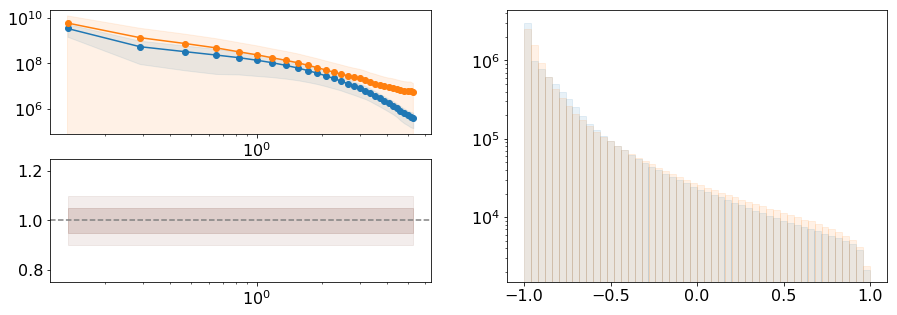

In [54]:
mi = 20
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

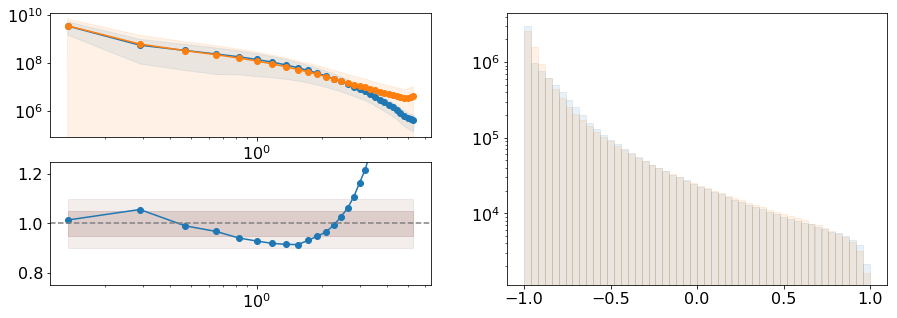

In [55]:
mi = 21
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

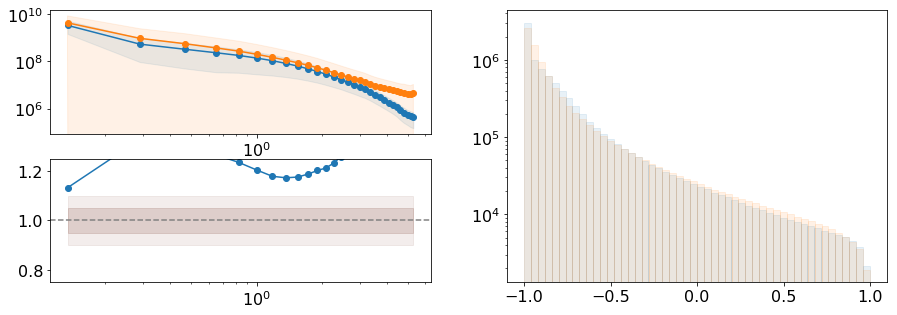

In [56]:
mi = 22
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [58]:
model_list = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*_22s-4.keras*"))

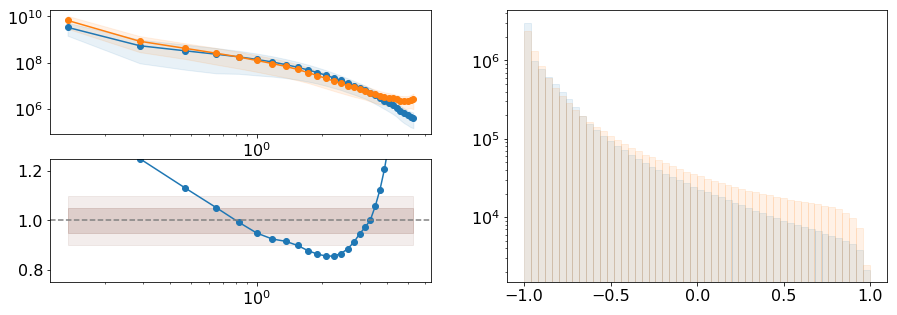

In [59]:
mi = 0
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

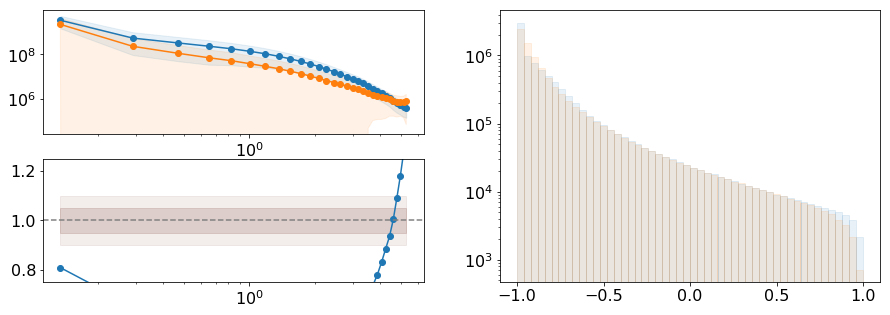

In [61]:
mi = 1
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

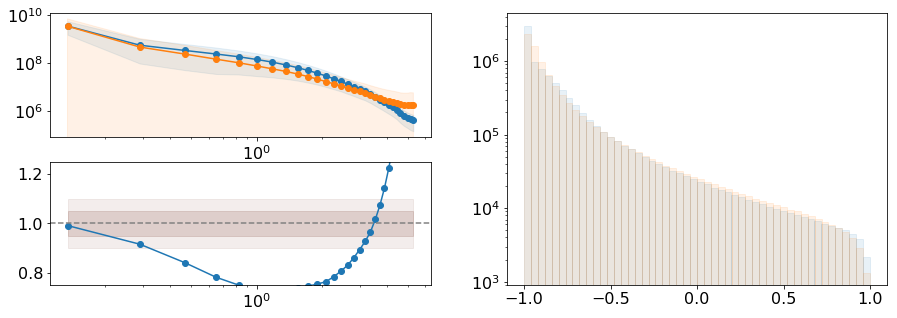

In [60]:
mi = 5
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

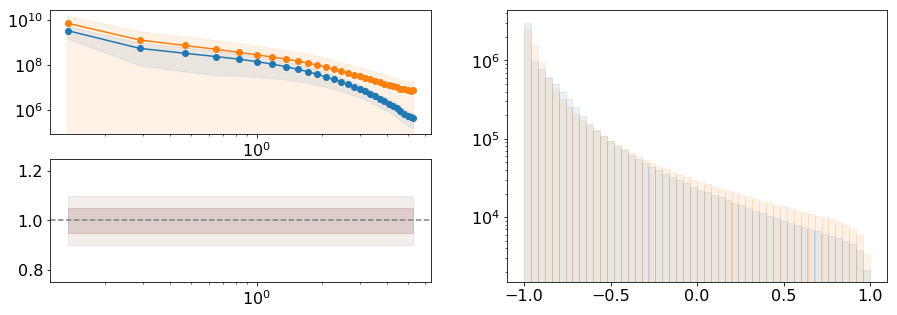

In [62]:
mi = 11
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

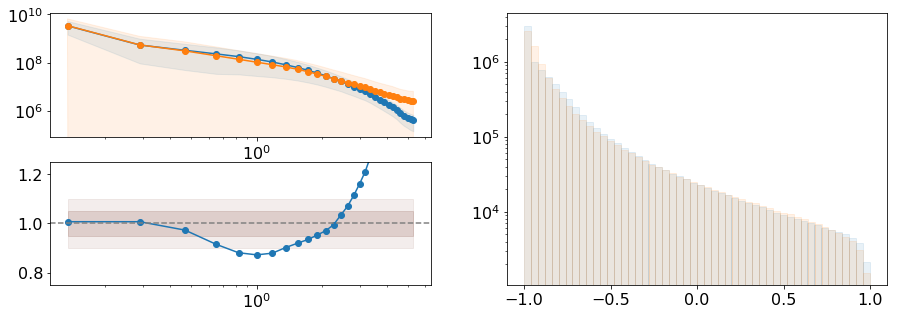

In [63]:
mi = 15
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

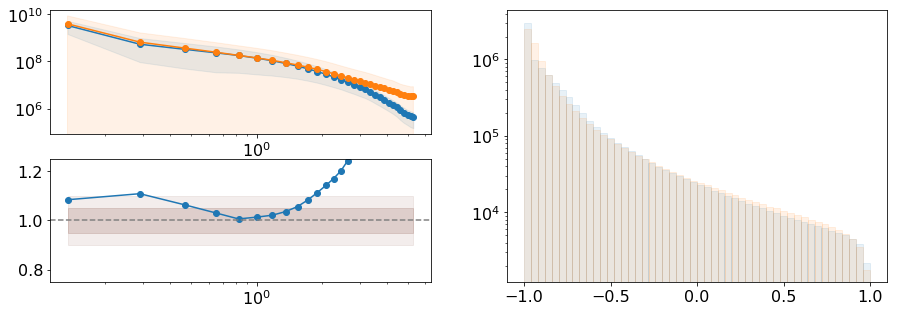

In [64]:
mi = 16
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

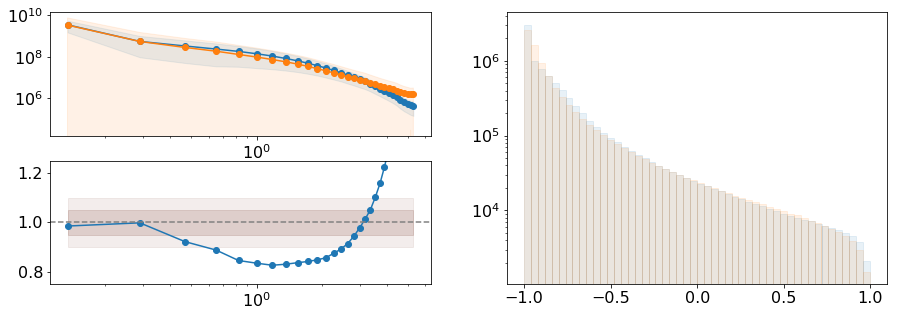

In [65]:
mi = 20
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

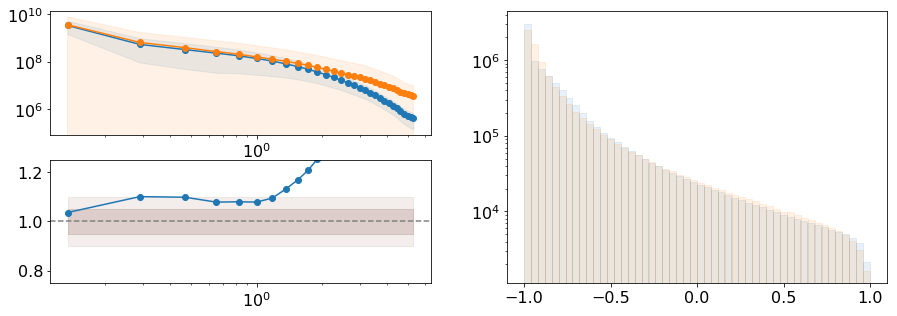

In [66]:
mi = 21
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

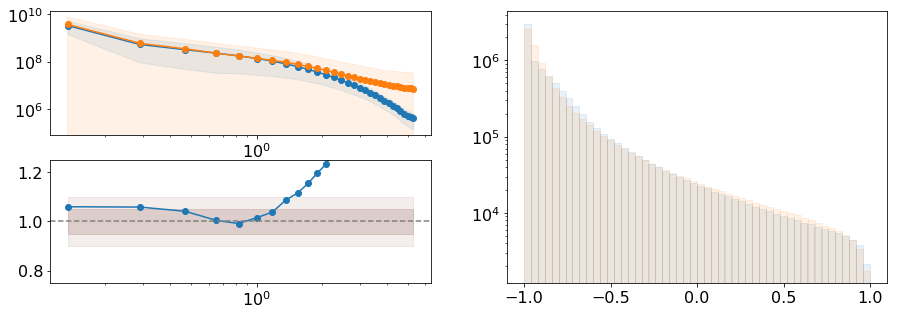

In [67]:
mi = 22
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [68]:
model_list = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*_23s-4.keras*"))

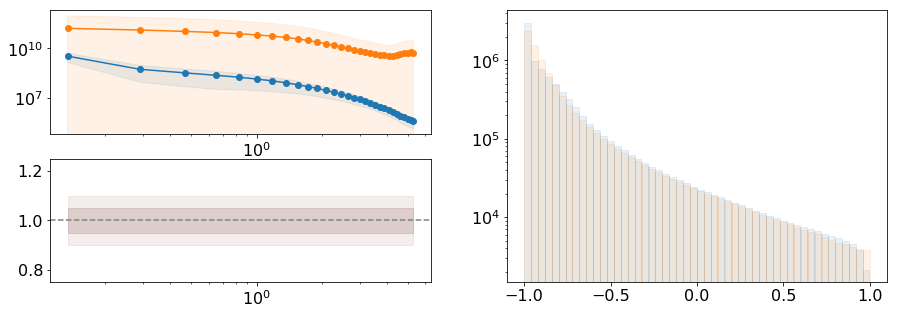

In [69]:
mi = 0
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [73]:
reset_keras(model)

2945683


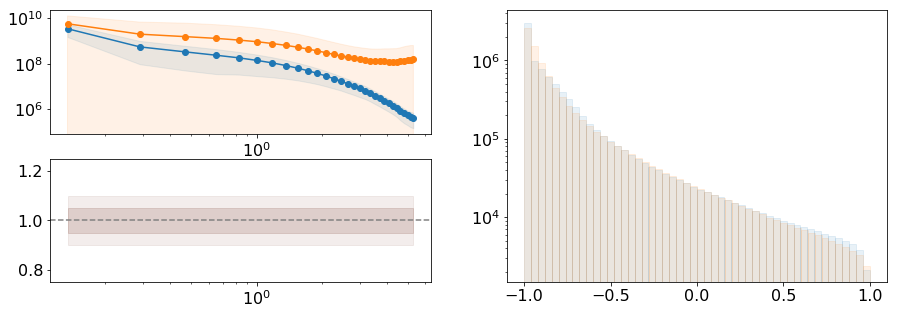

In [74]:
mi = 1
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

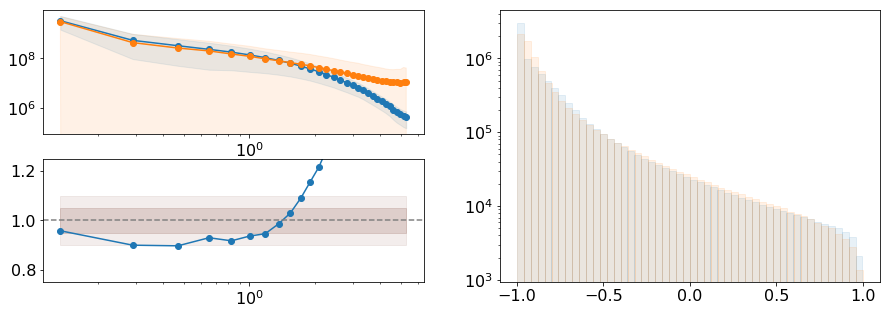

In [75]:
mi = 5
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

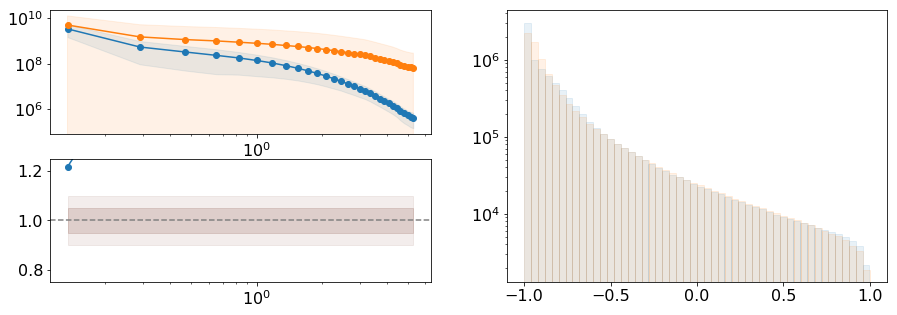

In [76]:
mi = 11
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

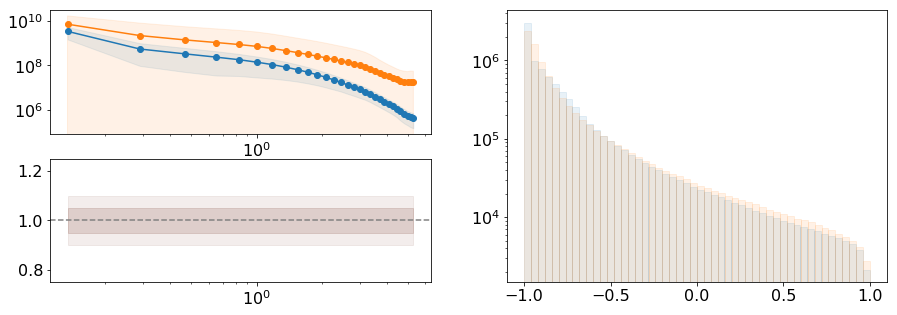

In [77]:
mi = 15
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

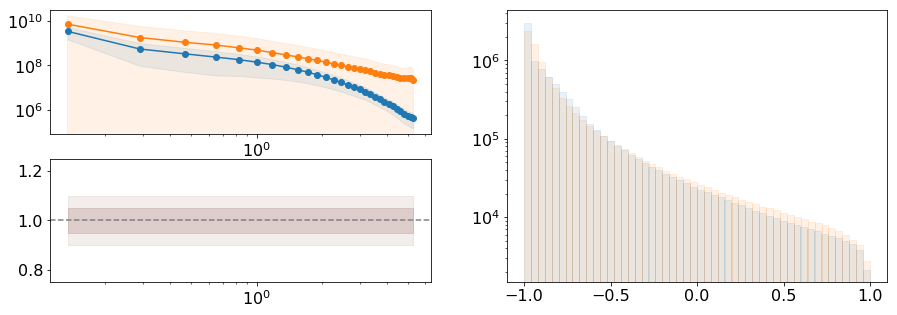

In [78]:
mi = 20
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

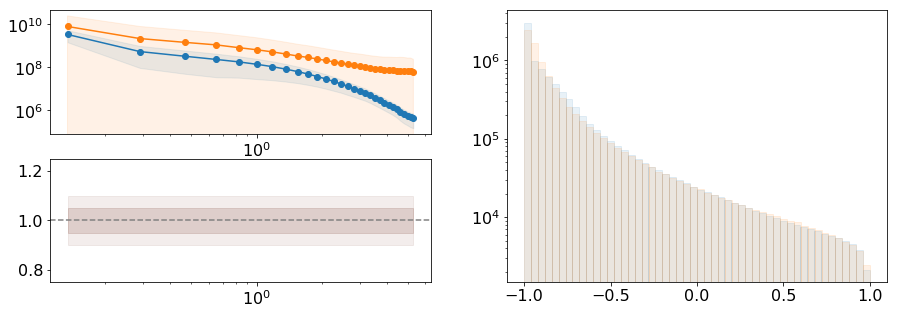

In [79]:
mi = 21
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

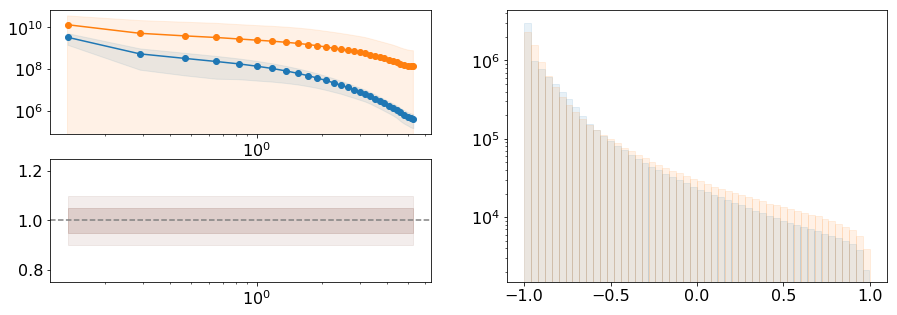

In [80]:
mi = 22
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)
mi = 22
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)
quick_check_plot(real_imgs, test_imgs)

In [81]:
hist_list = glob.glob("/work/06147/pberger/maverick2/saved_models/*-5.history5")
#hist_list.pop(3)
hist_list = np.sort(hist_list)
hist_list

array(['/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-5.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_21s-5.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_22s-5.history5'],
      dtype='|S70')

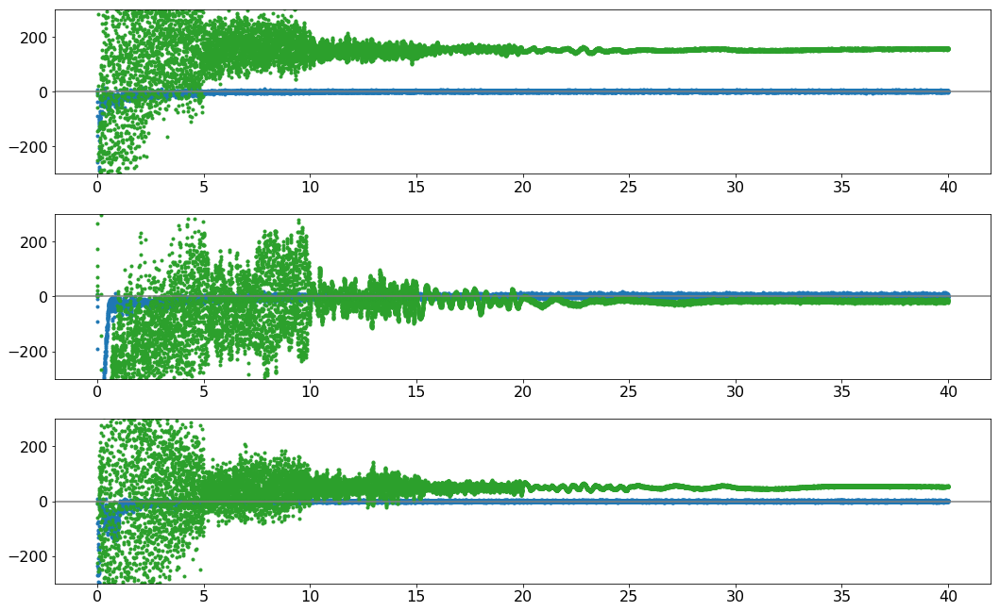

In [82]:
fig = figure(figsize = (15, 12))

#titles=['decay=1.5e-4', 'decay=1.5e-4,latent_dim=192', 'decay=1e.5e-4,base_features=48', 'all of the above']

for mi in range(3):
    
    #spis = [0, 1, 2, 4, 5]
    #spi = spis[mi]
    
    #subplot(3,2,1+spi)
    subplot(4,1,1+mi)
    with h5py.File(hist_list[mi], 'r') as hfile:

        epoch = np.arange(hfile['g_loss'][:].shape[0])*40./hfile['g_loss'][:].shape[0]
        plot(epoch, hfile['g_loss'][:], '.')
        plot(epoch, hfile['d_loss'][:], '.', c='C2')
        
        #title(titles[mi])

    ylim(-300, 300)
    axhline(0.0, c='grey')
    
tight_layout()

In [84]:
model_list = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*_20s-5.keras*"))

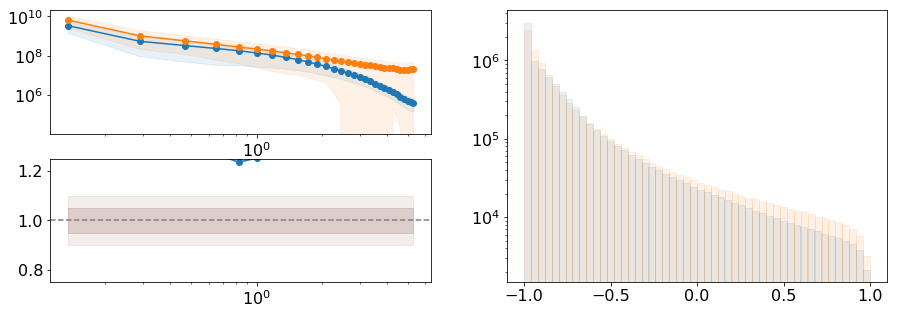

In [85]:
mi = 0
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

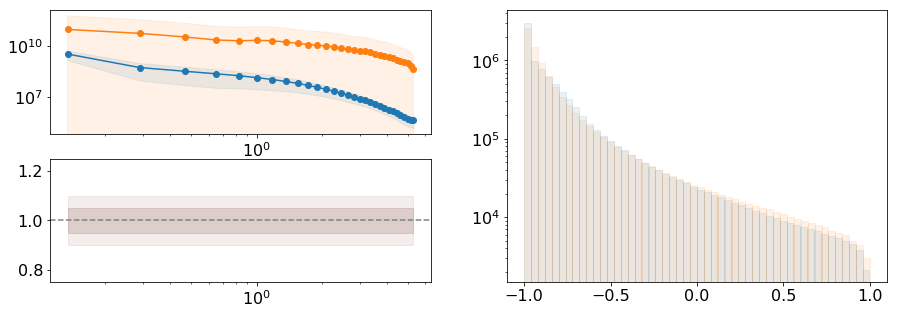

In [86]:
mi = 3
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

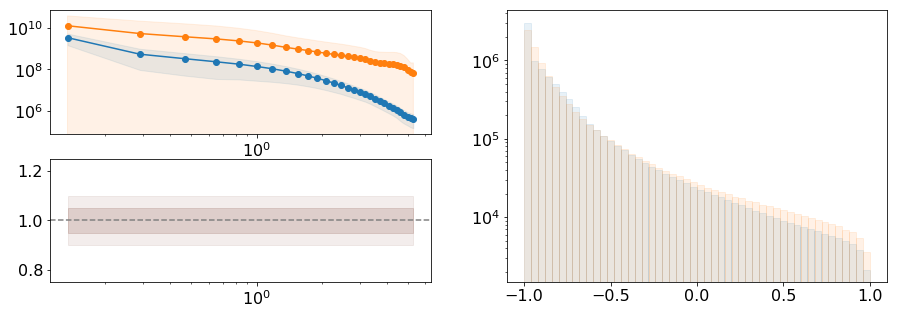

In [87]:
mi = 5
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

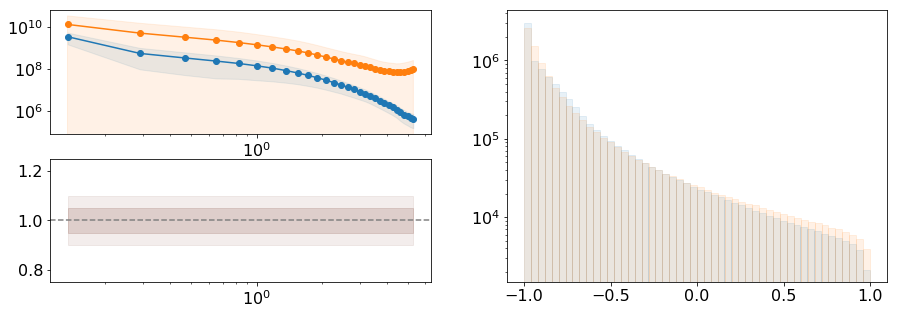

In [88]:
mi = 7
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

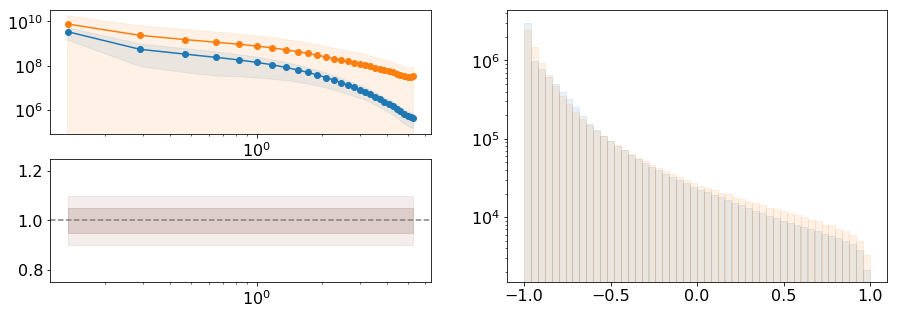

In [89]:
mi = 11
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

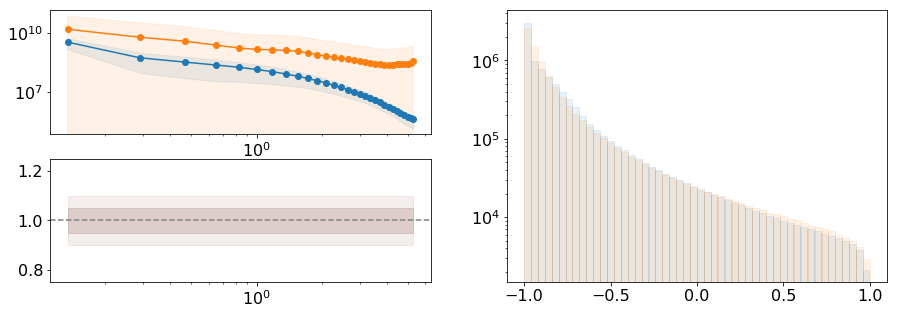

In [90]:
mi = 15
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

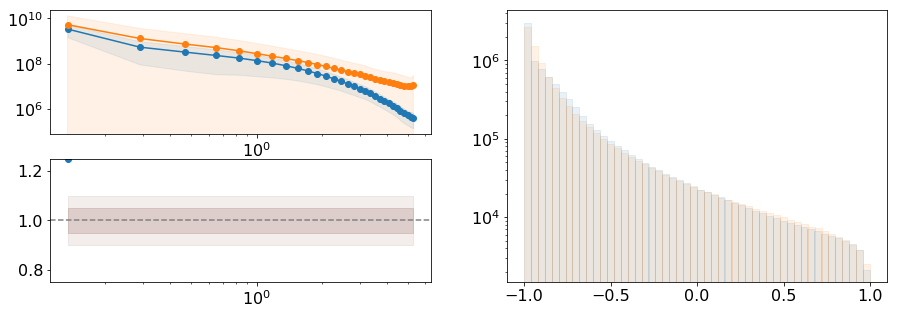

In [91]:
mi = 21
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

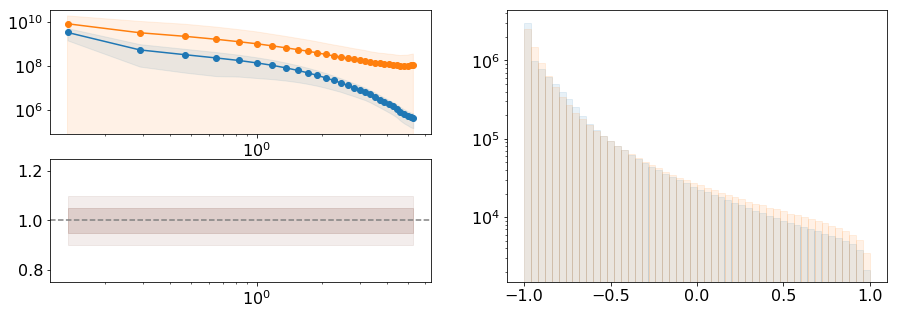

In [92]:
mi = 22
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [93]:
model_list = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*_21s-5.keras*"))

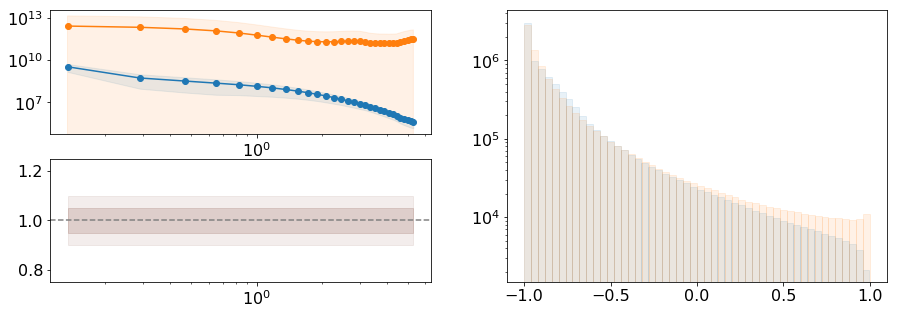

In [94]:
mi = 0
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

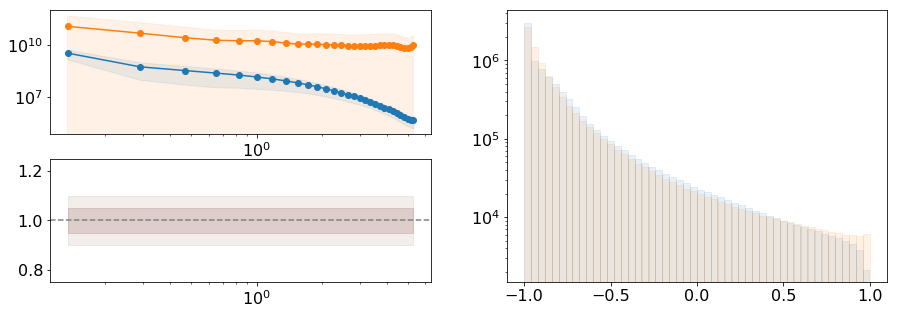

In [95]:
mi = 1
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

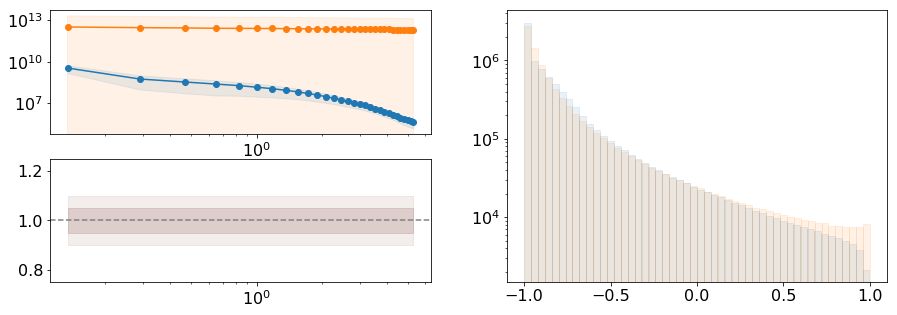

In [96]:
mi = 5
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

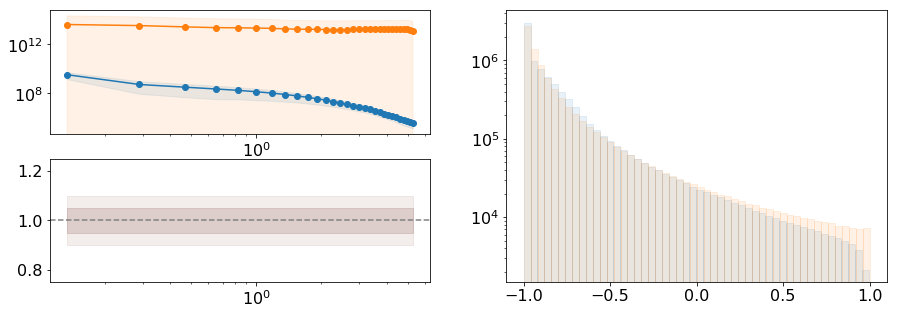

In [97]:
mi = 11
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

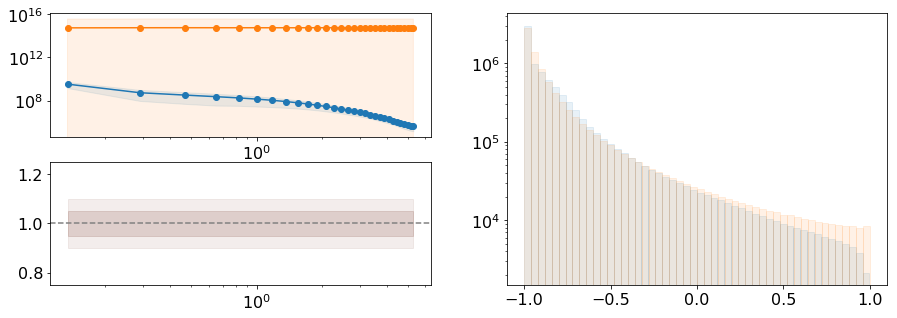

In [98]:
mi = 20
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

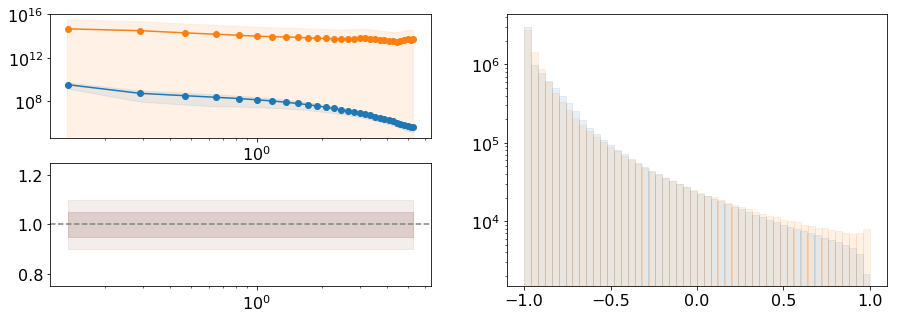

In [99]:
mi = 21
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

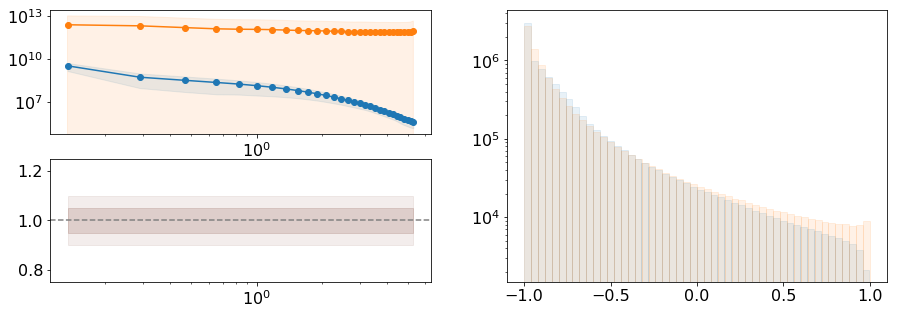

In [100]:
mi = 22
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [24]:
!cat ../scripts/config_20s-40.yaml

save_model : '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.keras'
save_history : '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.history5'

paths_to_data :
    'z0' : "/work/06147/pberger/maverick2/gadget_runs/cosmo1/n512_512Mpc_cosmo1_z0_gridpart.h5"

train_config :
    train_batch_size : 8
    image_shape      : (64, 64, 64)
    nepochs          : 60
    latent_dim       : 192

net_config :
    generator :
        module : kgan.net.generator_resnet3d
        args : 
            nlevels            : 3
            base_features      : 32
            nconvl             : 1
            conv_kernel_size   : (5, 5, 5)
            updown_kernel_size : (2, 2, 2)
            updown_method      : 'conv'
    critic : 
        module : kgan.net.critic_simple
        args :
            base_features : 32

optimizer_config :
    name     : Adam
    lr_gamma : 0.8
    args     : 
        beta_1 : 0.0
        beta_2 : 0.9
        lr     : 2e-4
        decay  : 1e-4


In [17]:
hist_list = glob.glob("/work/06147/pberger/maverick2/saved_models/*_2[0-1]s-4[0-1].history5")
#hist_list.pop(3)
hist_list = np.sort(hist_list)
hist_list

array(['/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-41.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_21s-40.history5',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_21s-41.history5'],
      dtype='|S71')

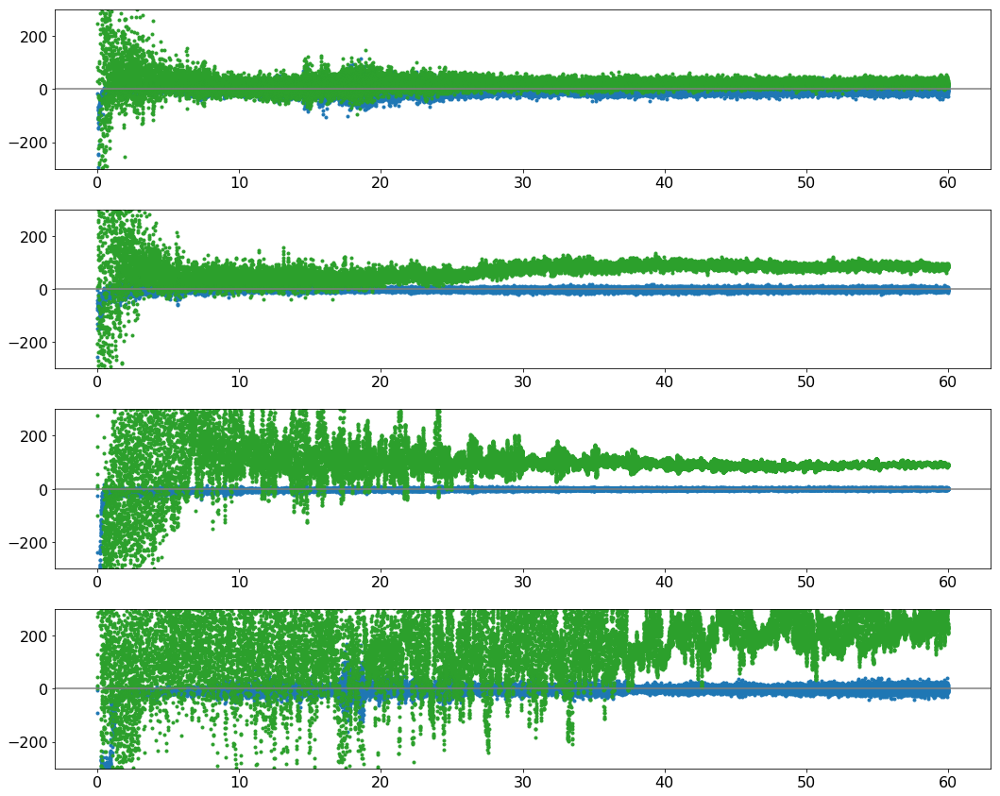

In [25]:
fig = figure(figsize = (15, 12))

#titles=['decay=1.5e-4', 'decay=1.5e-4,latent_dim=192', 'decay=1e.5e-4,base_features=48', 'all of the above']

for mi in range(4):
    
    #spis = [0, 1, 2, 4, 5]
    #spi = spis[mi]
    
    #subplot(3,2,1+spi)
    subplot(4,1,1+mi)
    with h5py.File(hist_list[mi], 'r') as hfile:

        epoch = np.arange(hfile['g_loss'][:].shape[0])*60./hfile['g_loss'][:].shape[0]
        plot(epoch, hfile['g_loss'][:], '.')
        plot(epoch, hfile['d_loss'][:], '.', c='C2')
        
        #title(titles[mi])

    ylim(-300, 300)
    axhline(0.0, c='grey')
    
tight_layout()

In [26]:
model_list = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*_20s-40.keras*"))

In [27]:
len(model_list)

35

In [29]:
latent_dim=192

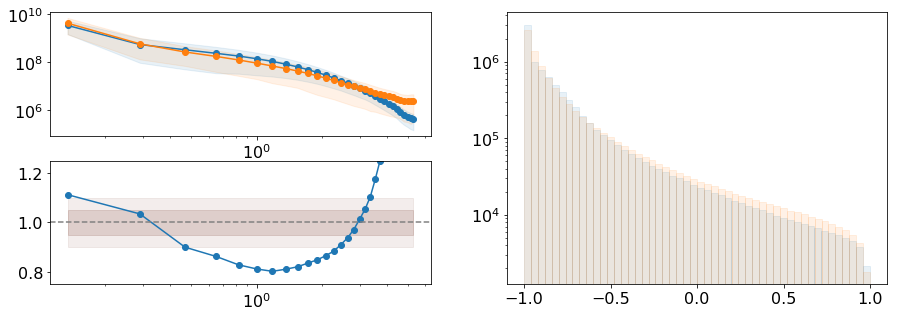

In [30]:
mi = 0
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

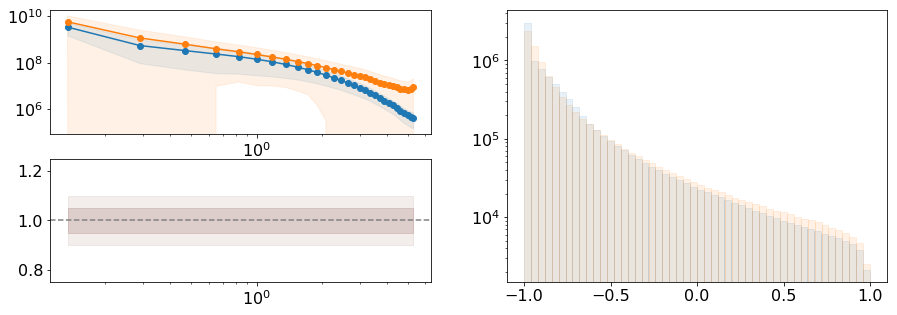

In [34]:
mi = 4
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

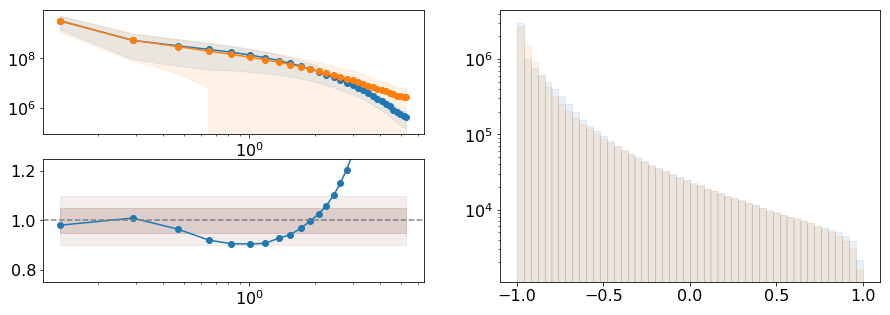

In [31]:
mi = 5
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

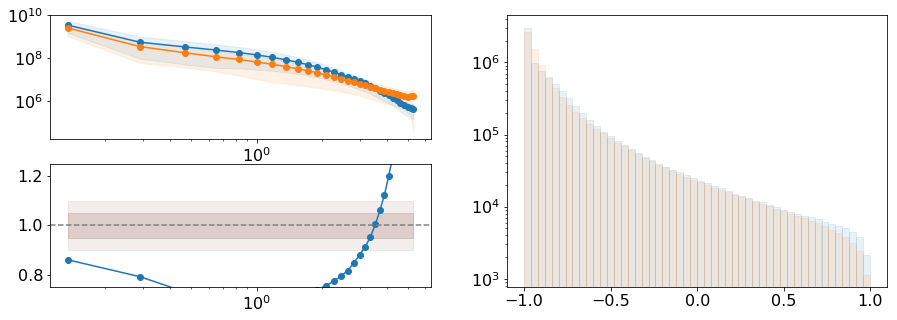

In [32]:
mi = 6
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

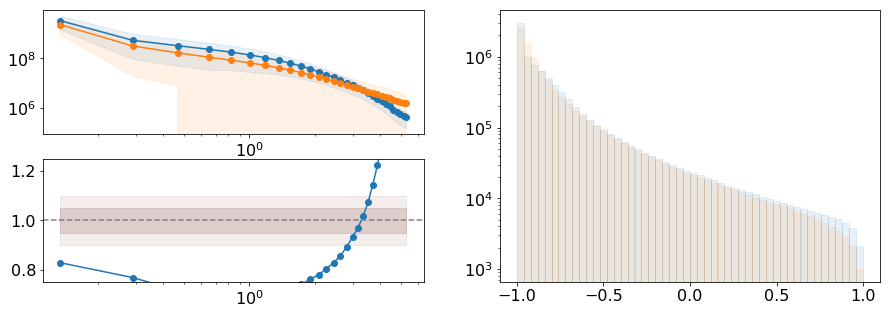

In [33]:
mi = 7
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

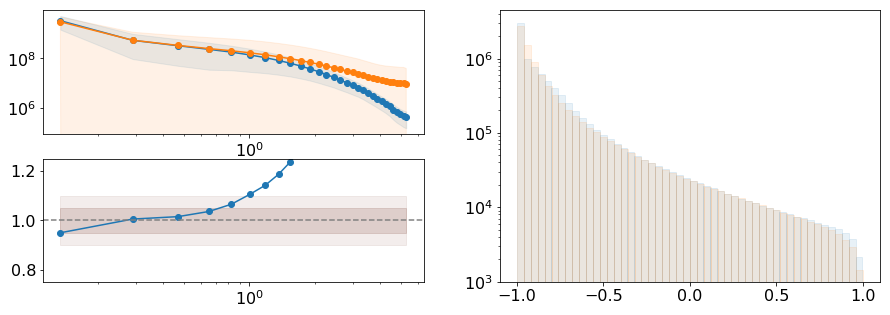

In [35]:
mi = 8
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

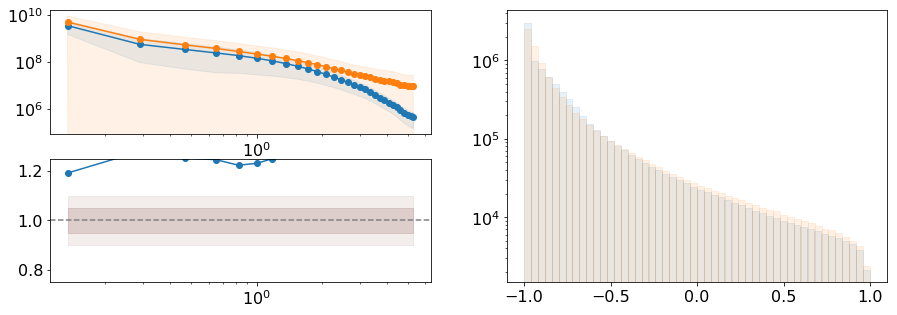

In [36]:
mi = 15
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

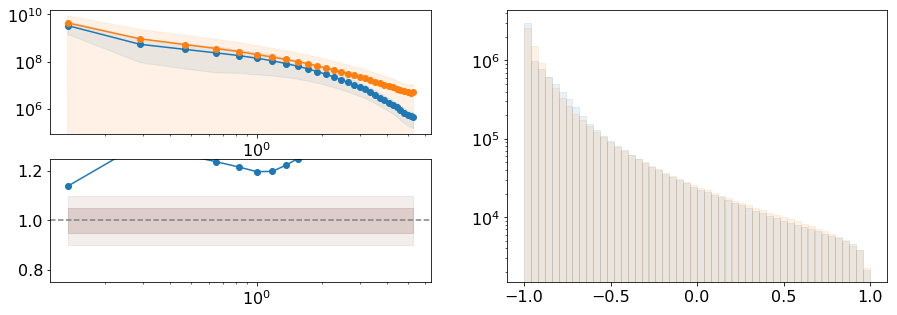

In [37]:
mi = 30
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

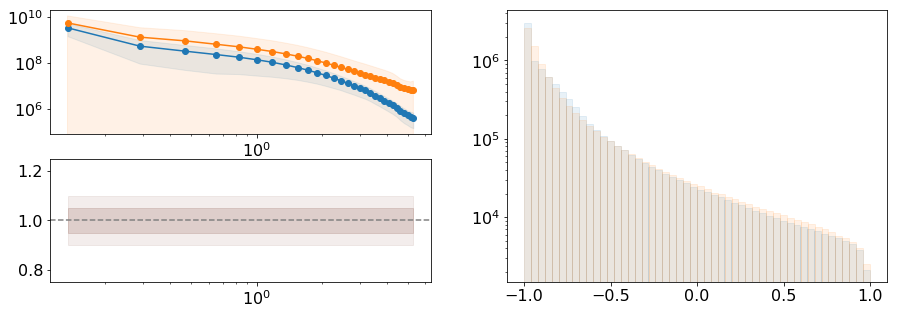

In [39]:
mi = 31
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

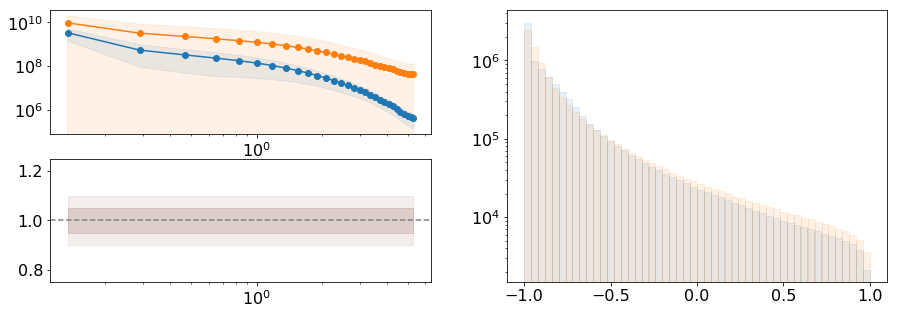

In [38]:
mi = 34
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [16]:
model_list = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*_20s-41.keras*"))

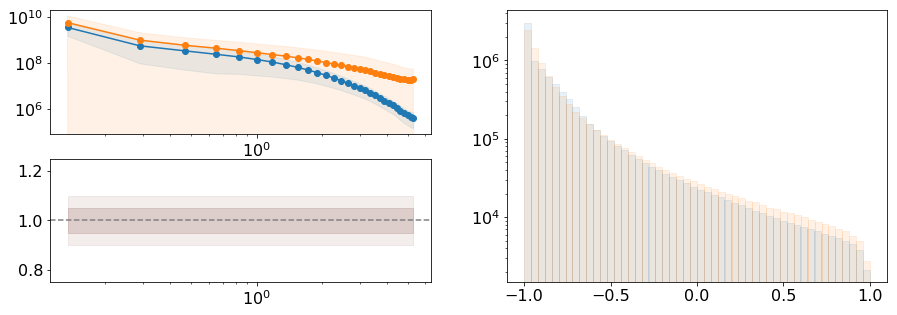

In [43]:
mi = 0
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

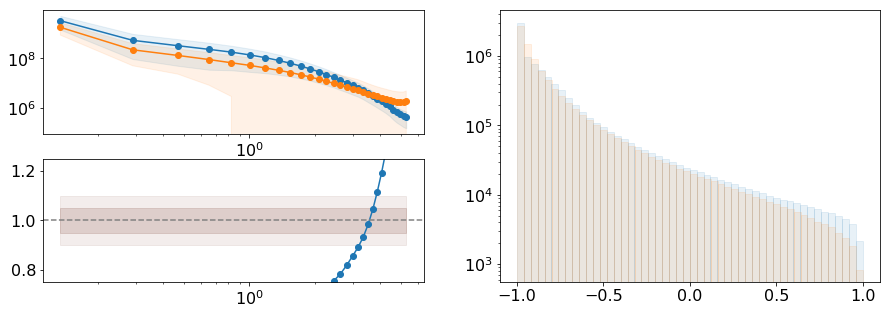

In [44]:
mi = 1
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

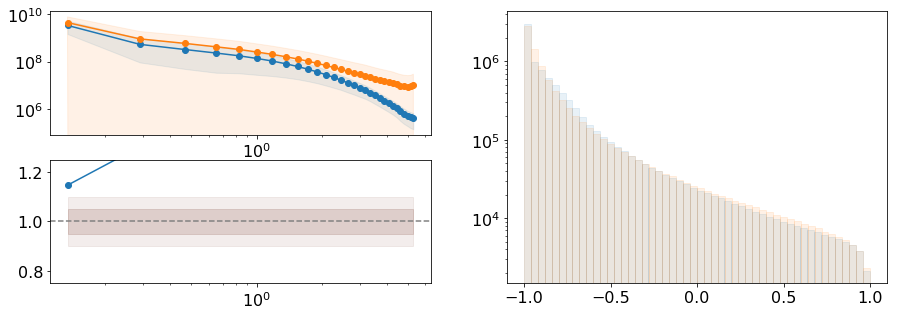

In [45]:
mi = 2
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

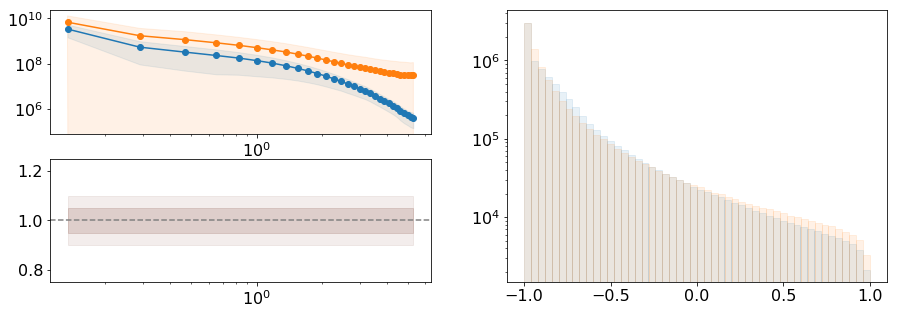

In [46]:
mi = 3
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

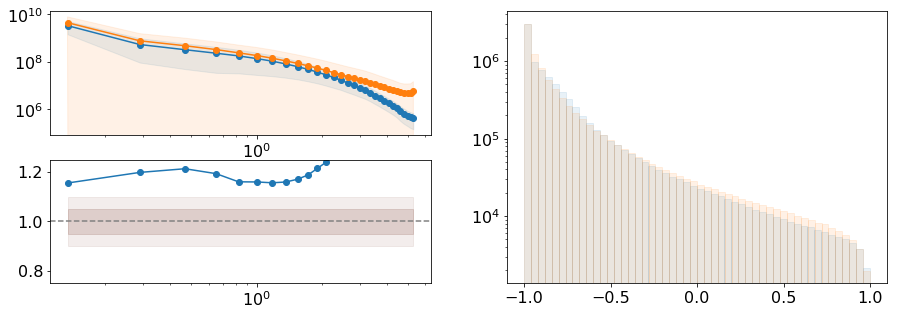

In [47]:
mi = 10
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

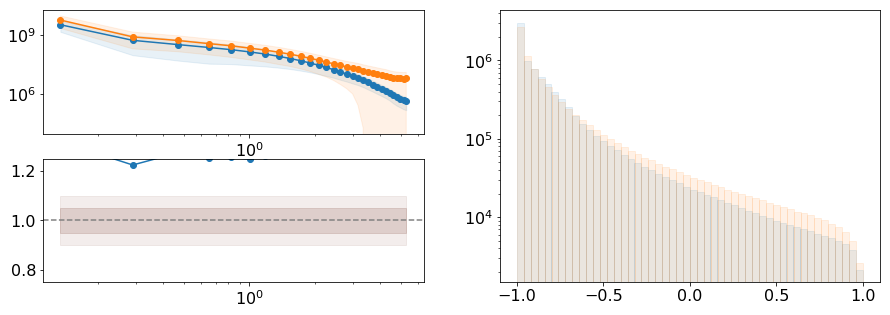

In [48]:
mi = 20
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

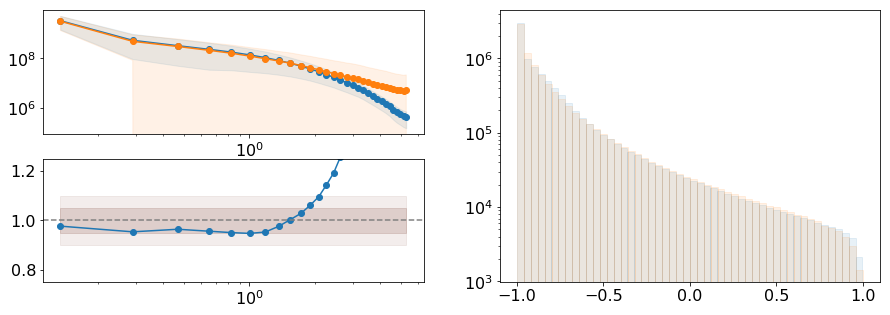

In [49]:
mi = 30
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

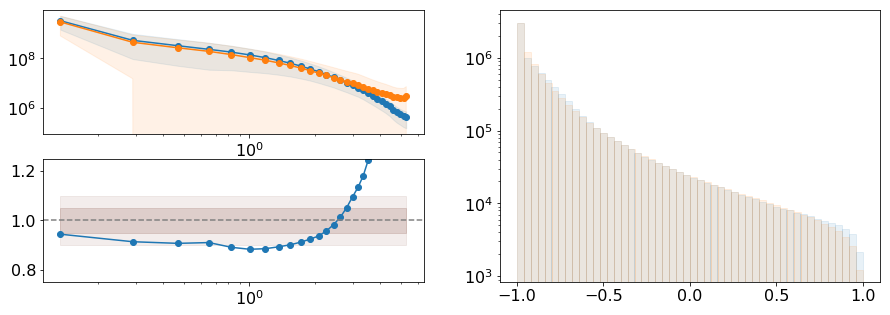

In [55]:
mi = 29
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

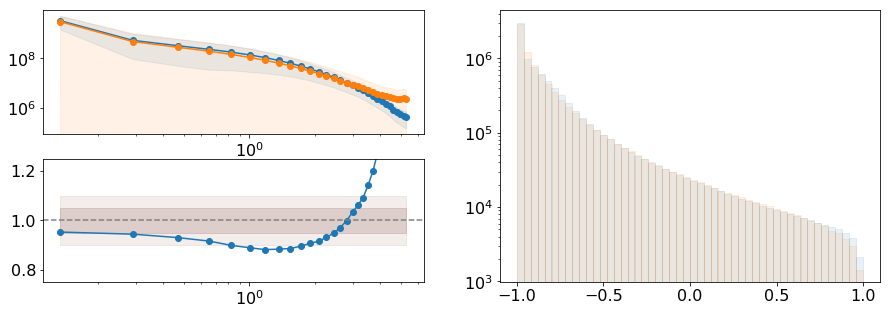

In [54]:
mi = 30
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

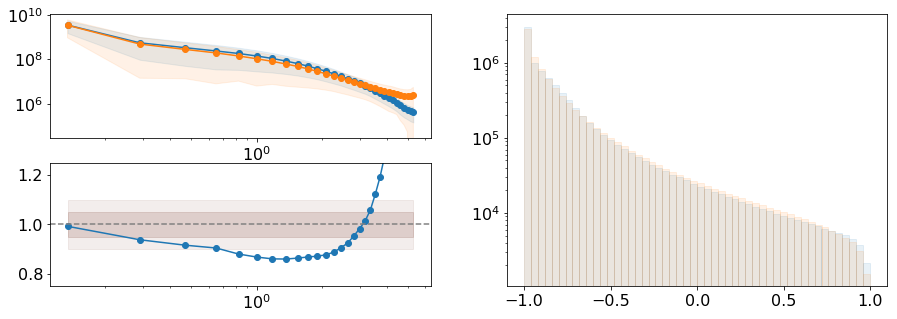

In [50]:
mi = 31
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [71]:
latent_dim = 192

In [72]:
model_list[32]

'/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-41.keras-057'

In [136]:
"%2.1e" % 1000.09

'1.0e+03'

In [73]:
mi = 32
model = km.load_model(model_list[mi])

(1024, 64, 64, 64)


Text(0.5,0.98,'nlevels=3, nconvl=1, lr_gamma=0.8, 1r=2e-4, beta1=0.0, beta2=0.9, decay=1e-5, epoch=57')

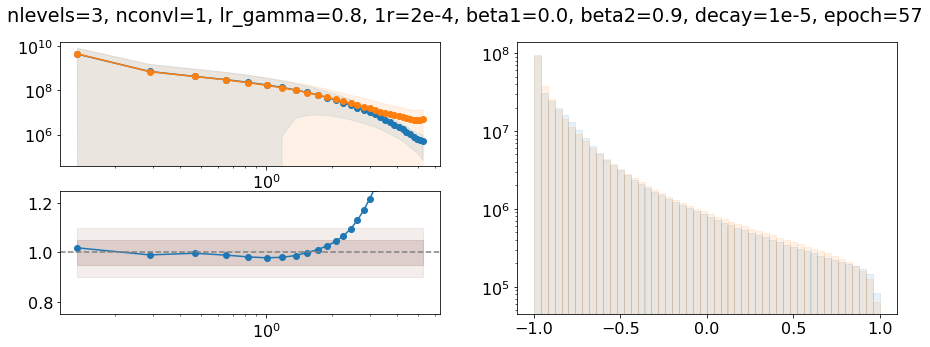

In [20]:
test_imgs = []
for i in range(4):
    test_imgs.extend(model.predict(np.random.normal(0, 1, (256, latent_dim))).reshape(256, 64, 64, 64))
test_imgs=np.array(test_imgs)
print(test_imgs.shape)
real_imgs = delta[:1024]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

suptitle('nlevels=3, nconvl=1, lr_gamma=0.8, 1r=2e-4, beta1=0.0, beta2=0.9, decay=1e-5, epoch=57')

(1024, 64, 64, 64)


Text(0.5,0.98,'nlevels=3, nconvl=1, lr_gamma=0.8, 1r=2e-4, beta1=0.0, beta2=0.9, decay=1e-5, epoch=57')

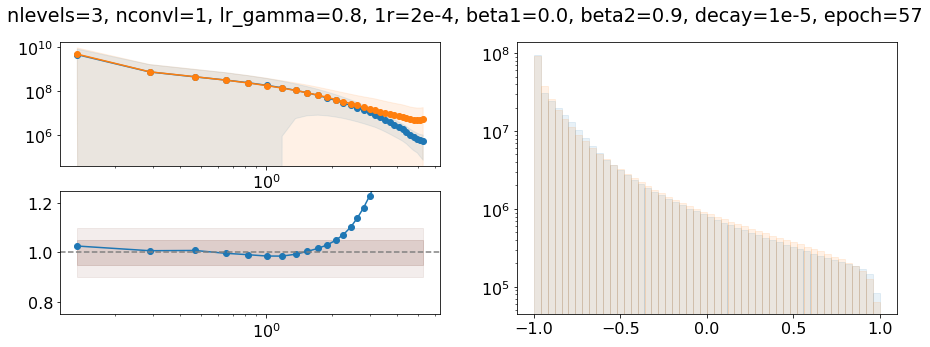

In [21]:
test_imgs = []
for i in range(4):
    test_imgs.extend(model.predict(np.random.normal(0, 1, (256, latent_dim))).reshape(256, 64, 64, 64))
test_imgs=np.array(test_imgs)
print(test_imgs.shape)
real_imgs = delta[:1024]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

suptitle('nlevels=3, nconvl=1, lr_gamma=0.8, 1r=2e-4, beta1=0.0, beta2=0.9, decay=1e-5, epoch=57')

In [98]:
kx = np.fft.fftfreq(64, d=1.0)*2*np.pi
ky = np.fft.fftfreq(64, d=1.0)*2*np.pi
kz = np.fft.fftfreq(64, d=1.0)*2*np.pi
kk = np.sqrt(kx[:, np.newaxis, np.newaxis]**2 
                 + ky[np.newaxis, :, np.newaxis]**2 
                 + kz[np.newaxis, np.newaxis, :]**2)

pk1r = []
pk2f = []
Nim = len(real_imgs)
for i in range(Nim):
    k1, pk1 = estimate_pk(kk, squash_inv(real_imgs[i]), boxsize=64.0)
    k2, pk2 = estimate_pk(kk, squash_inv(test_imgs[i]), boxsize=64.0)

    pk1r.append(pk1)
    pk2f.append(pk2)
pk1r = np.array(pk1r)
pk2f = np.array(pk2f)

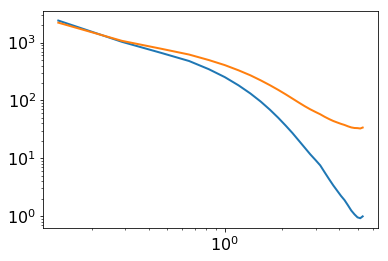

In [108]:
#for i in range(512):
#    loglog(k1, pk1r[i], alpha=0.02, c='C0')
loglog(k1, pk1r.std(0), c='C0', lw=2.0)

#for i in range(512):
#    loglog(k1, pk2f[i], alpha=0.02, c='C1')
loglog(k1, pk2f.std(0), c='C1', lw=2.0)

In [89]:
mi = 33
model = km.load_model(model_list[mi])

(1024, 64, 64, 64)


Text(0.5,0.98,'nlevels=3, nconvl=1, lr_gamma=0.8, 1r=2e-4, beta1=0.0, beta2=0.9, decay=1e-5, epoch=57')

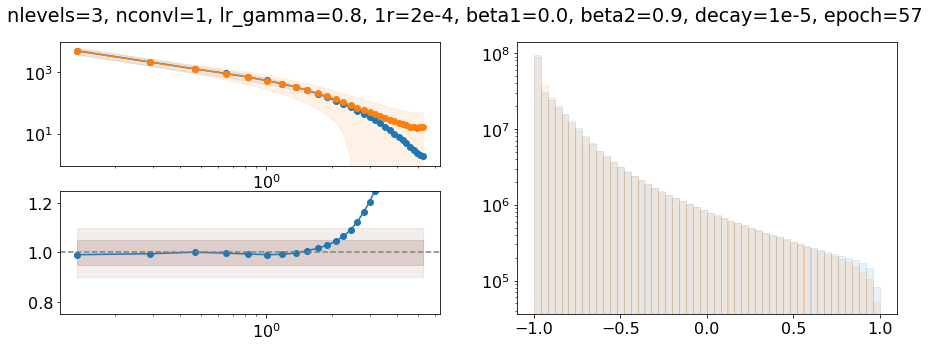

In [104]:
test_imgs = []
for i in range(4):
    test_imgs.extend(model.predict(np.random.normal(0, 1, (256, latent_dim))).reshape(256, 64, 64, 64))
test_imgs=np.array(test_imgs)
print(test_imgs.shape)
real_imgs = delta[:1024]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

suptitle('nlevels=3, nconvl=1, lr_gamma=0.8, 1r=2e-4, beta1=0.0, beta2=0.9, decay=1e-5, epoch=57')

In [24]:
mi = 34
model = km.load_model(model_list[mi])

(1024, 64, 64, 64)


Text(0.5,0.98,'nlevels=3, nconvl=1, lr_gamma=0.8, 1r=2e-4, beta1=0.0, beta2=0.9, decay=1e-5, epoch=57')

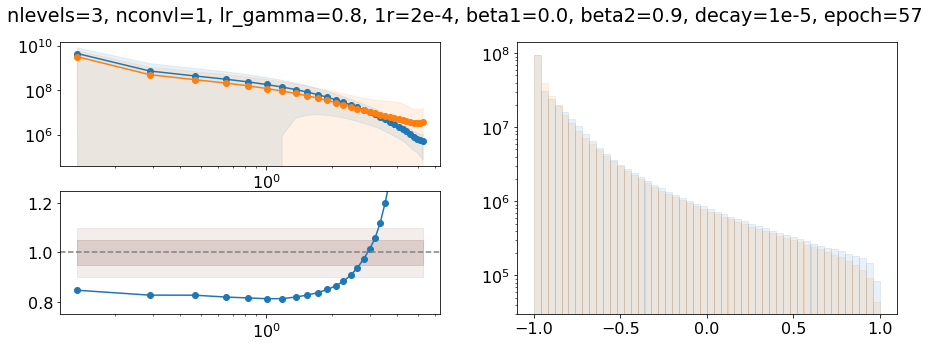

In [25]:
test_imgs = []
for i in range(4):
    test_imgs.extend(model.predict(np.random.normal(0, 1, (256, latent_dim))).reshape(256, 64, 64, 64))
test_imgs=np.array(test_imgs)
print(test_imgs.shape)
real_imgs = delta[:1024]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

suptitle('nlevels=3, nconvl=1, lr_gamma=0.8, 1r=2e-4, beta1=0.0, beta2=0.9, decay=1e-5, epoch=57')

In [153]:
os.path.join('/work/06147/pberger/maverick2/saved_models', 'foo.h5')

'/work/06147/pberger/maverick2/saved_models/foo.h5'

In [146]:
np.sort(glob.glob('/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.keras' + '*'))

array(['/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.keras-005',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.keras-009',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.keras-011',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.keras-015',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.keras-017',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.keras-019',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.keras-021',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.keras-025',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.keras-030',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.keras-033',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.keras-035',
       '/work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.keras-036',
    

In [144]:
work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.keras' + '*'

'work/06147/pberger/maverick2/saved_models/gen_resnet3d_20s-40.keras*'

In [60]:
model_list = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*_21s-40.keras*"))

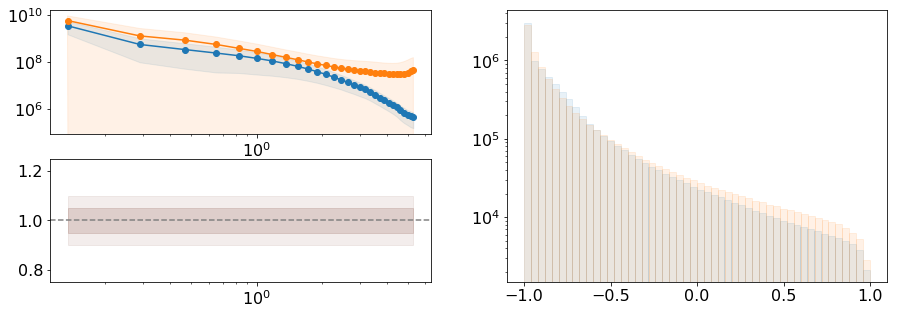

In [58]:
mi = 0
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

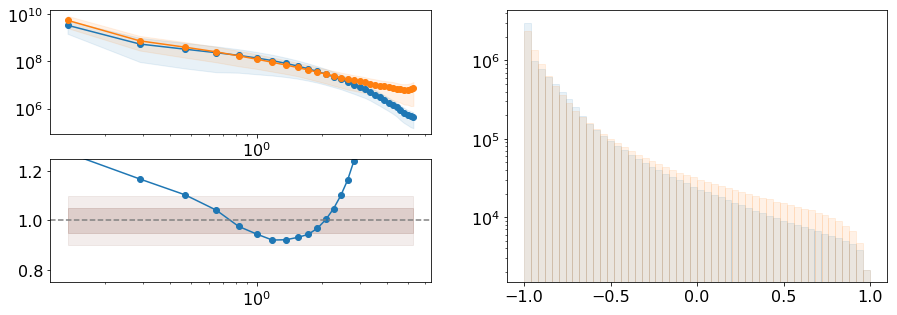

In [59]:
mi = 1
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

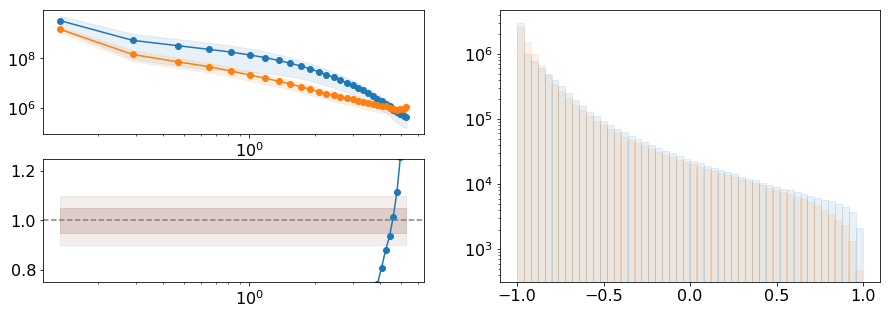

In [61]:
mi = 2
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

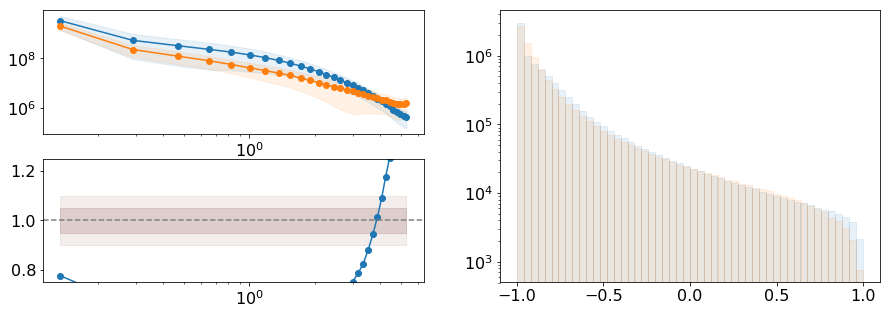

In [62]:
mi = 3
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

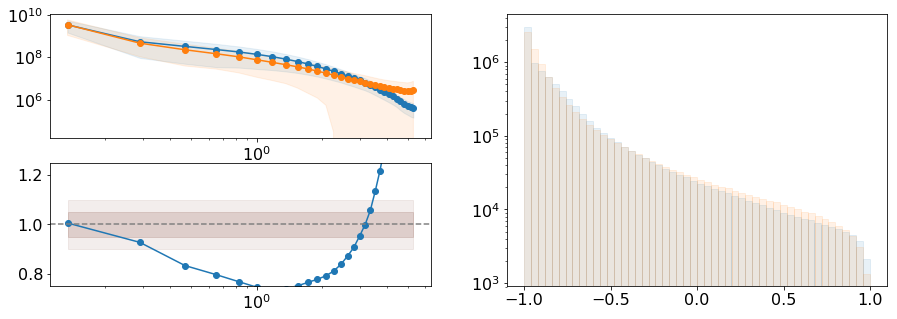

In [63]:
mi = 10
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

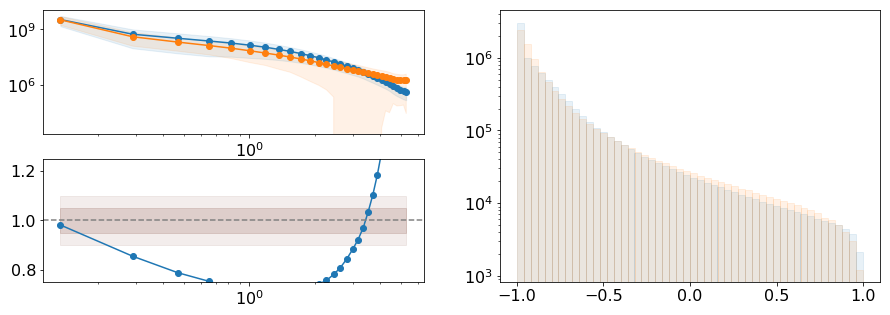

In [64]:
mi = 15
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [76]:
reset_keras(model)

94


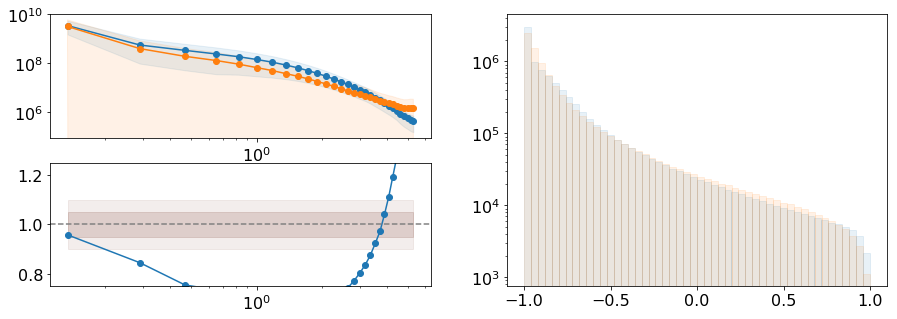

In [77]:
mi = 30
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

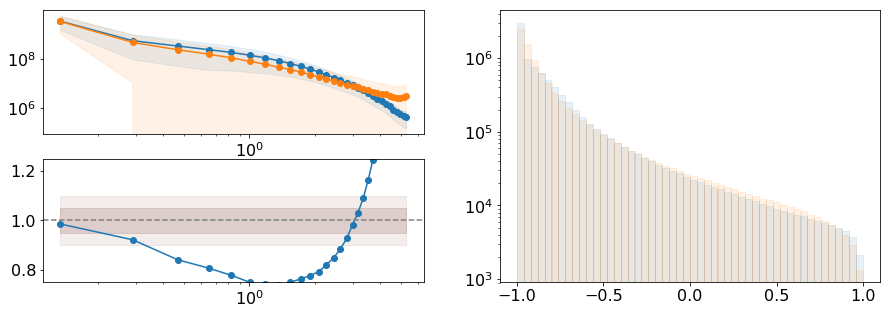

In [79]:
mi = 33
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

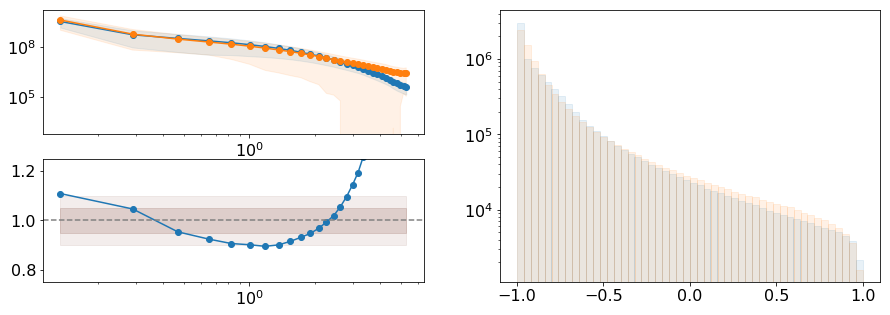

In [78]:
mi = 34
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

In [80]:
model_list = np.sort(glob.glob("/work/06147/pberger/maverick2/saved_models/*_21s-41.keras*"))

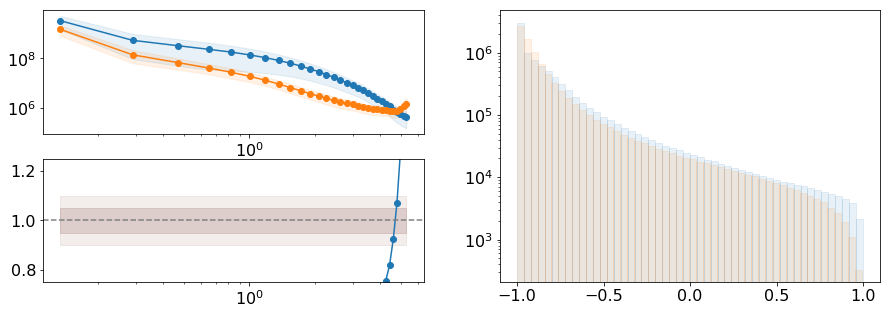

In [81]:
mi = 0
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

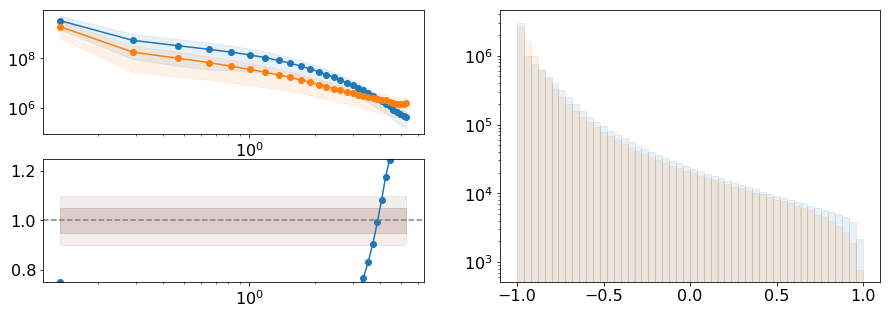

In [82]:
mi = 3
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

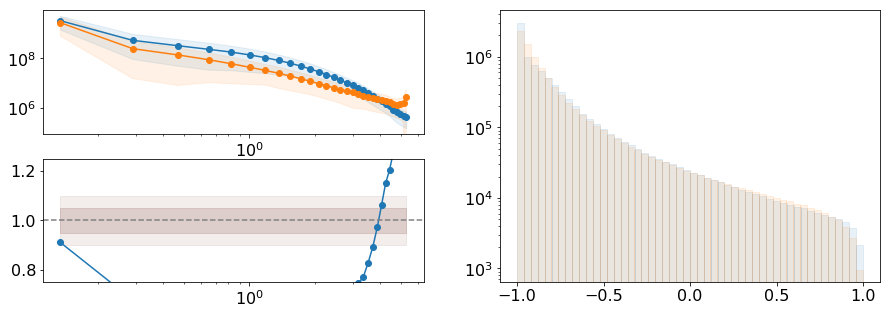

In [83]:
mi = 5
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

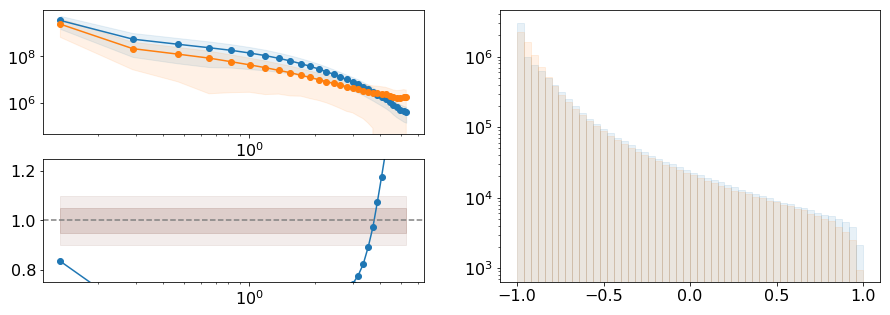

In [84]:
mi = 6
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

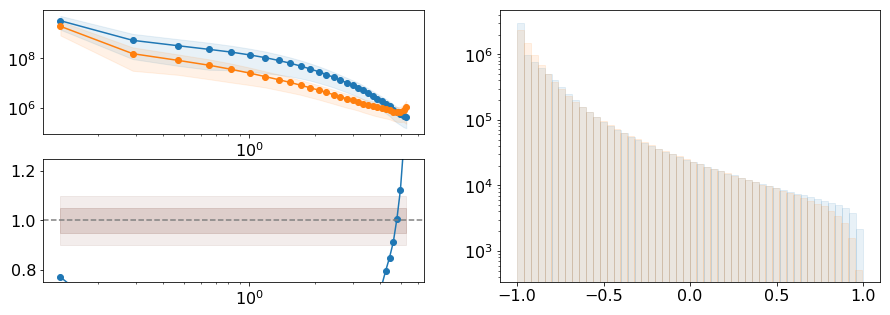

In [85]:
mi = 7
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

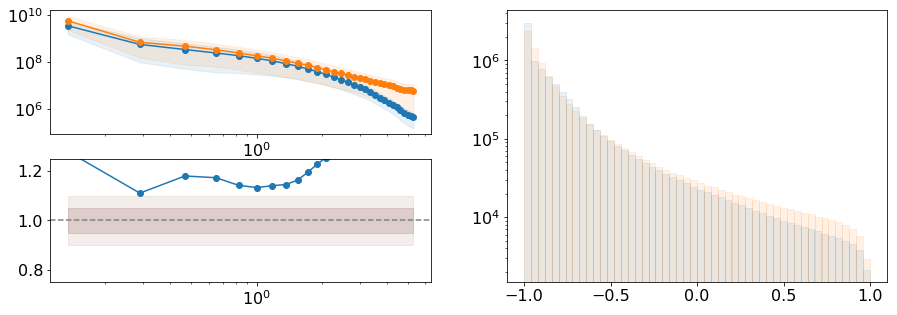

In [86]:
mi = 10
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

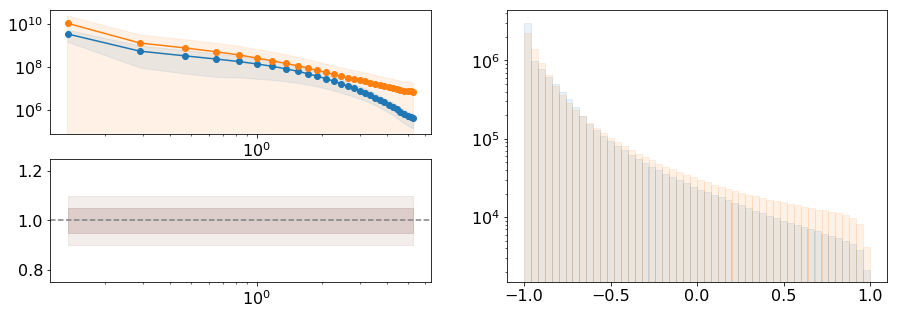

In [87]:
mi = 11
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

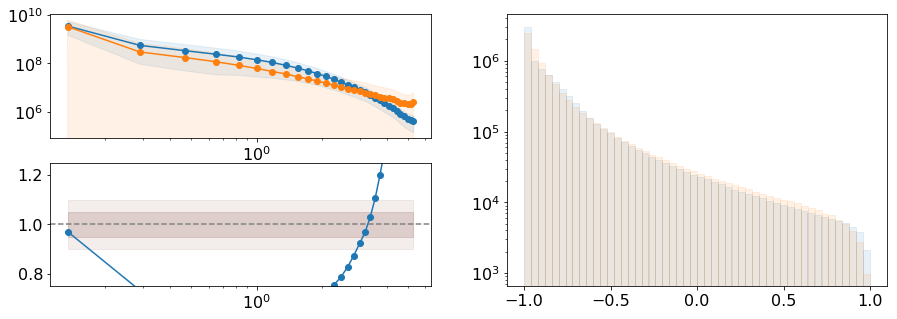

In [96]:
mi = 14
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

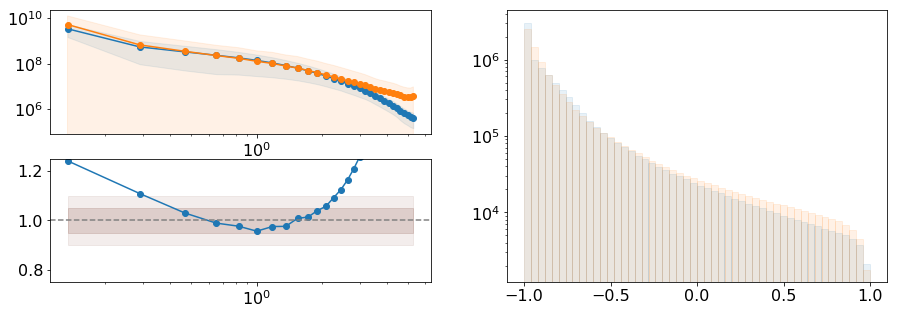

In [88]:
mi = 15
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

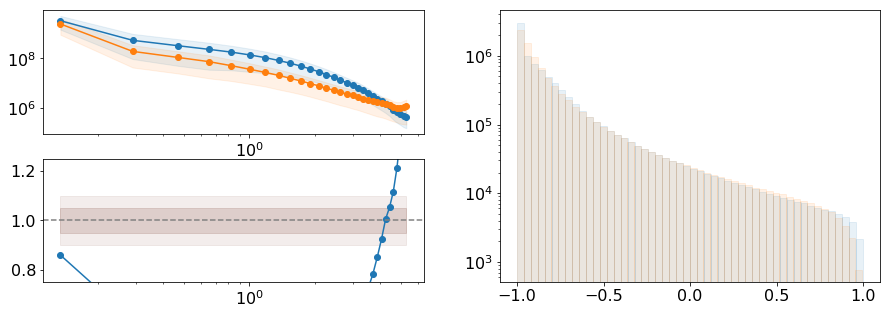

In [97]:
mi = 16
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

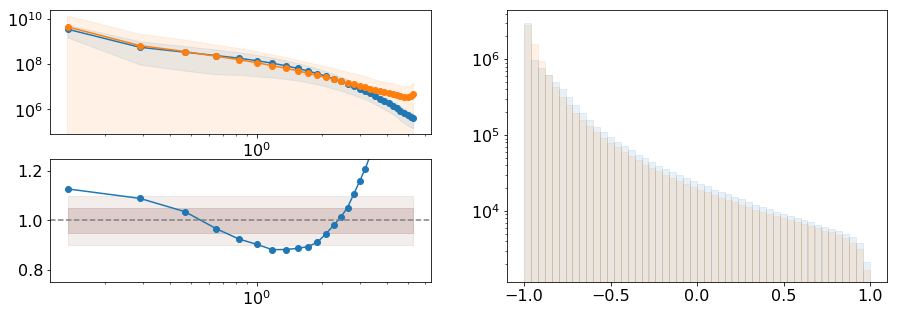

In [90]:
mi = 25
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

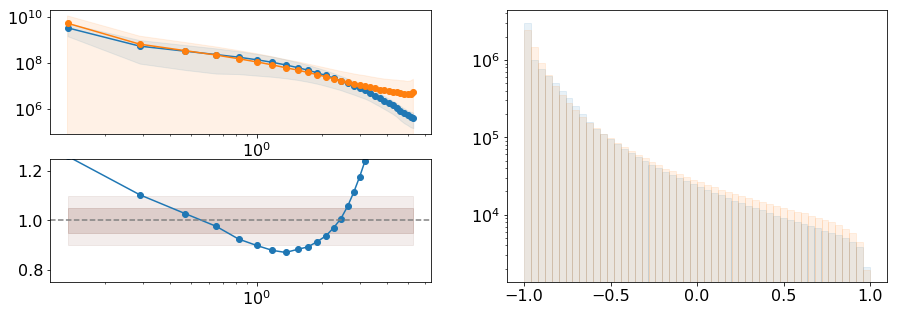

In [91]:
mi = 30
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

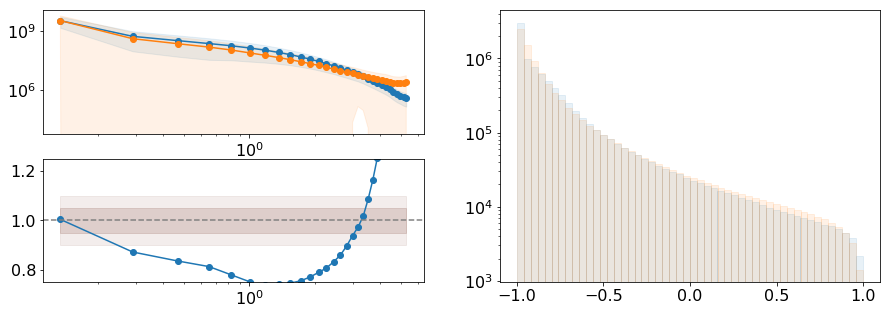

In [92]:
mi = 31
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

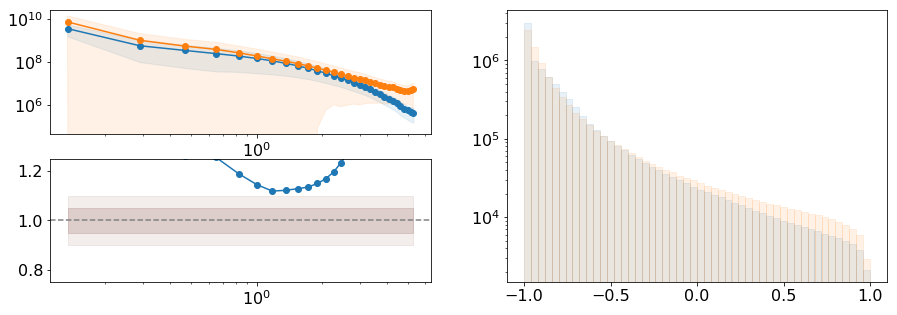

In [93]:
mi = 32
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

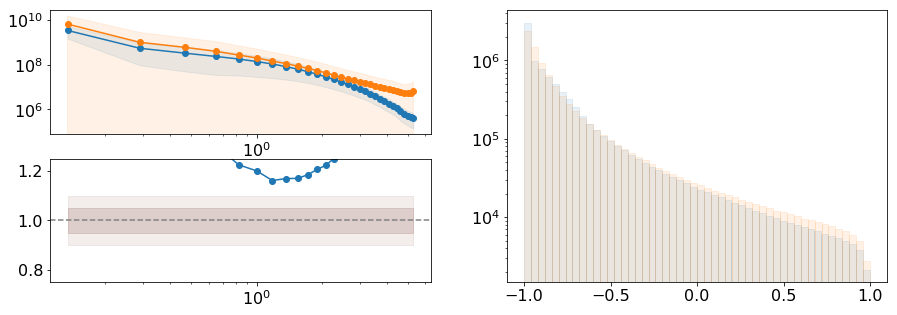

In [94]:
mi = 33
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)

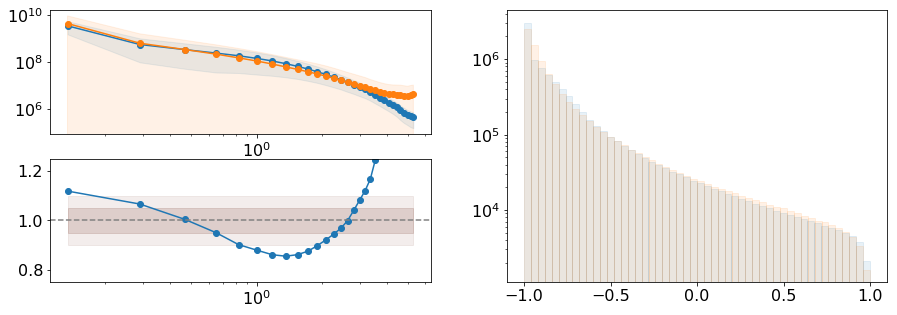

In [95]:
mi = 34
model = km.load_model(model_list[mi])

test_imgs = model.predict(np.random.normal(0, 1, (32, latent_dim))).reshape(32, 64, 64, 64)
real_imgs = delta[:32]
    
test_imgs = np.array(test_imgs)
real_imgs = np.array(real_imgs)

quick_check_plot(real_imgs, test_imgs)